
# Superstore Sales Prediction

## Project Overview

This notebook presents a comprehensive analysis and predictive modeling effort aimed at forecasting sales for a superstore based on historical transaction data. Leveraging advanced machine learning techniques, the project seeks to provide actionable insights for optimizing inventory management, pricing strategies, and revenue forecasting. The solution integrates data preprocessing, exploratory data analysis (EDA), feature engineering, and model evaluation to deliver a robust sales prediction system, culminating in a deployable Flask-based web application.

## Data Description

The dataset underpinning this analysis, derived from a Superstore dataset, contains detailed transactional information. Below is an organized overview of the data structure and key attributes:

| **Column Name**      | **Description**                                      | **Data Type** | **Example Values**            |
|-----------------------|-----------------------------------------------------|---------------|--------------------------------|
| Row ID               | Unique identifier for each transaction              | Integer       | 1, 2, 3, ...                  |
| Order ID             | Unique identifier for each order                    | String        | CA-2013-152156                |
| Order Date           | Date when the order was placed                     | Date (Excel)  | 41587 (Jan 6, 2013)           |
| Ship Date            | Date when the order was shipped                    | Date (Excel)  | 41590 (Jan 9, 2013)           |
| Ship Mode            | Method of shipment                                  | String        | Second Class, Standard Class  |
| Customer ID          | Unique identifier for each customer                 | String        | CG-12520                      |
| Customer Name        | Name of the customer                                | String        | Claire Gute                   |
| Segment              | Customer segment (e.g., Consumer, Corporate)        | String        | Consumer                      |
| Country              | Country of the transaction                         | String        | United States                 |
| City                 | City of the transaction                             | String        | Henderson                     |
| State                | State of the transaction                            | String        | Kentucky                      |
| Postal Code          | Postal code of the transaction                     | Integer       | 42420                         |
| Region               | Geographical region                                 | String        | South                         |
| Product ID           | Unique identifier for each product                  | String        | FUR-BO-10001798               |
| Category             | Broad product category                              | String        | Furniture                     |
| Sub-Category         | Specific product subcategory                        | String        | Bookcases                     |
| Product Name         | Name of the product                                 | String        | Bush Somerset Collection Bookcase |
| Sales                | Total sales amount                                  | Float         | 261.96                        |
| Quantity             | Number of units sold                                | Integer       | 2                             |
| Discount             | Discount percentage applied                        | Float         | 0                             |
| Profit               | Profit generated from the transaction               | Float         | 41.9136                       |

### Key Points:
- **Dataset Size**: The dataset comprises 9,994 rows and 21 columns, providing a robust foundation for predictive modeling.
- **Temporal Scope**: Order and ship dates span multiple years, enabling time-series analysis and trend identification.
- **Geographical Coverage**: Transactions are exclusively from the United States, segmented into regions (e.g., South, West).
- **Financial Metrics**: Includes critical financial indicators such as Sales, Quantity, Discount, and Profit for comprehensive analysis.
- **Product Diversity**: Encompasses three main categories (Furniture, Office Supplies, Technology) with detailed subcategories.
- **Data Integrity**: Contains some anomalies (e.g., negative profits, varying precision in numerical fields), requiring preprocessing for accurate modeling.

This project leverages these data attributes to develop a high-performing sales prediction model.

## Importing the relevant libraries

In [ ]:
# Core Libraries
import numpy as np
import pandas as pd

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Utility Libraries
import warnings
import joblib
import gc
import re
import time
warnings.filterwarnings('ignore')

# Statistical Libraries
from scipy.stats import probplot

# Scikit-learn Libraries
## Model Selection & Metrics
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

## Regression Models
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, BaggingRegressor, VotingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, BayesianRidge, HuberRegressor, PassiveAggressiveRegressor, SGDRegressor, PoissonRegressor, RANSACRegressor, TheilSenRegressor, GammaRegressor, ARDRegression, TweedieRegressor
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from ngboost import NGBRegressor
from sklearn.neural_network import MLPRegressor

## Preprocessing & Feature Engineering
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression, SelectPercentile, SelectFromModel, RFE, SequentialFeatureSelector
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from feature_engine.outliers import Winsorizer
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, DropCorrelatedFeatures

# Model Visualization Libraries
from yellowbrick.regressor import PredictionError, ResidualsPlot

# mlxtend Library
from mlxtend.plotting import plot_decision_regions

## Loading the dataset

In [ ]:
df = pd.read_excel('data/Superstore.xlsx')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2013-138688,2013-06-13,2013-06-17,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


## Data Exploration

In [ ]:
df.shape

(9994, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   datetime64[ns]
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [ ]:
df.drop('Row ID', axis=1, inplace=True)

In [ ]:
df.nunique() / len(df)

,0
Order ID,0.501201
Order Date,0.123874
Ship Date,0.133480
Ship Mode,0.000400
Customer ID,0.079348
Customer Name,0.079348
Segment,0.000300
Country,0.000100
City,0.053132
State,0.004903


In [ ]:
df.isna().sum()

,0
Order ID,0
Order Date,0
Ship Date,0
Ship Mode,0
Customer ID,0
Customer Name,0
Segment,0
Country,0
City,0
State,0


In [ ]:
df.duplicated().sum()

np.int64(1)

In [ ]:
df = df.drop_duplicates()
df.shape

(9993, 20)

In [ ]:
df.drop(['Order ID','Customer ID','Customer Name','Product ID'],axis=1,inplace=True)

## Exploratory Data Analysis

### Univariate Analysis

Skewness of Postal Code: -0.12862858810335934
Kurtosis of Postal Code: -1.4931118549547797


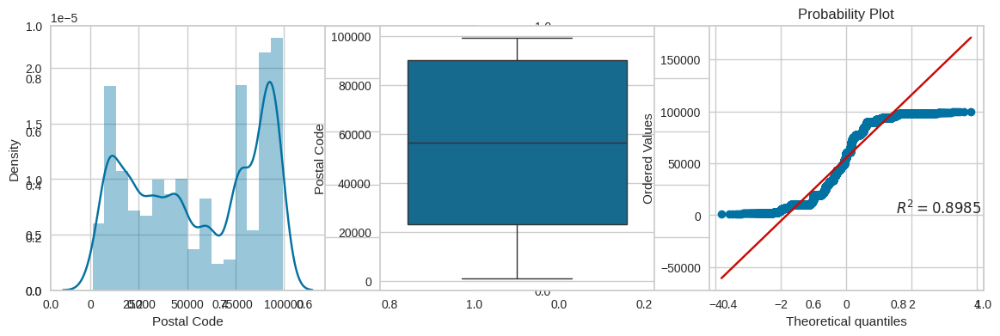

Skewness of Sales: 12.972141558363262
Kurtosis of Sales: 305.28176970634985


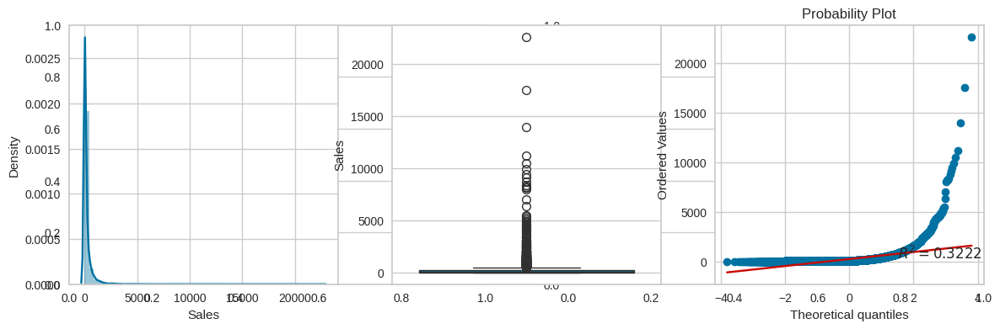

Skewness of Quantity: 1.2784155399852233
Kurtosis of Quantity: 1.9915827160047757


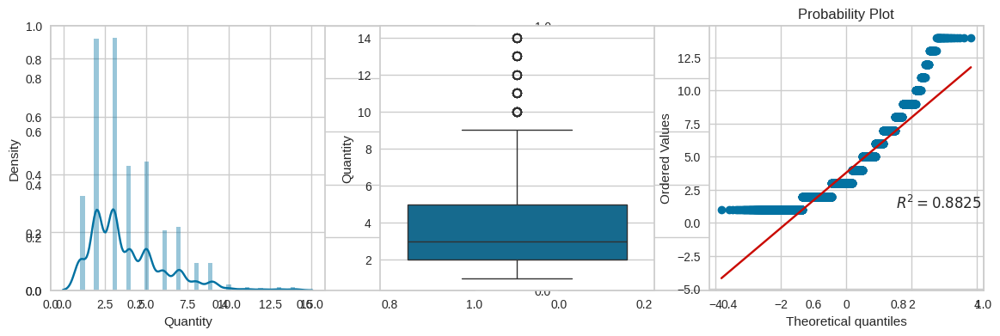

Skewness of Discount: 1.6845084876700462
Kurtosis of Discount: 2.409976524801519


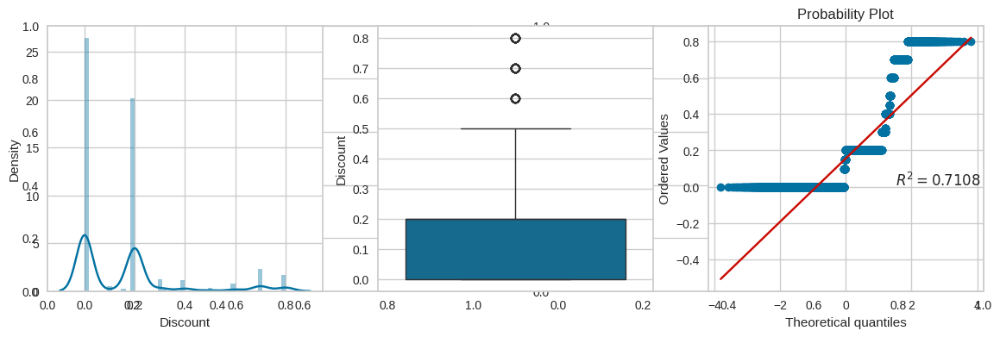

Skewness of Profit: 7.561035996041436
Kurtosis of Profit: 397.15038474389223


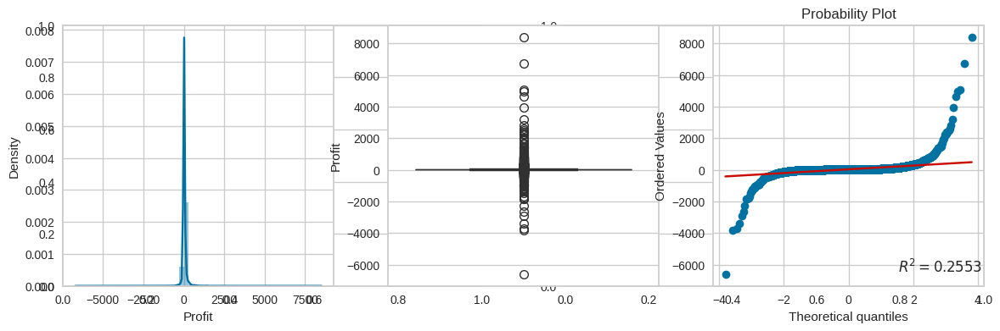

In [ ]:
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [ ]:
skewed_cols = ['Quantity','Discount','Profit']

In [ ]:
df['Country'].value_counts()

,count
Country,
United States,9993


In [ ]:
df.drop('Country', axis=1, inplace=True)

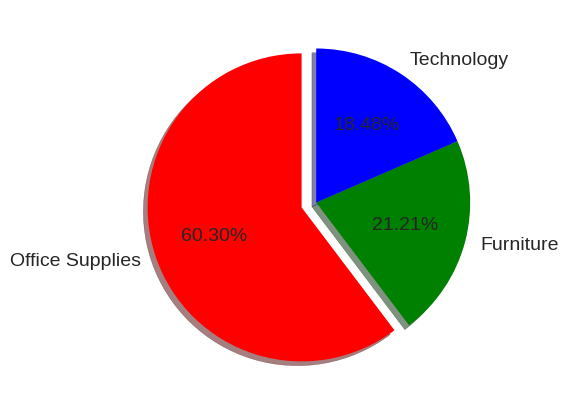

In [ ]:
plt.figure(figsize=(10,5))
labels = df['Category'].value_counts().keys()
values = df['Category'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['red','green','blue'])
plt.show()

Majority of the products are in Office Supplies category whereas the least number of products are in Technology category.

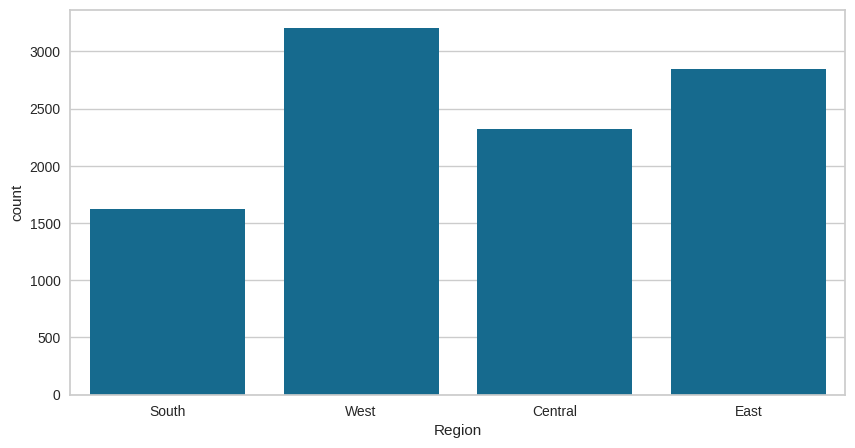

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Region',data=df)
plt.show()

A significant number of customers belong to the Western region while the Southern region has the least number of customers.

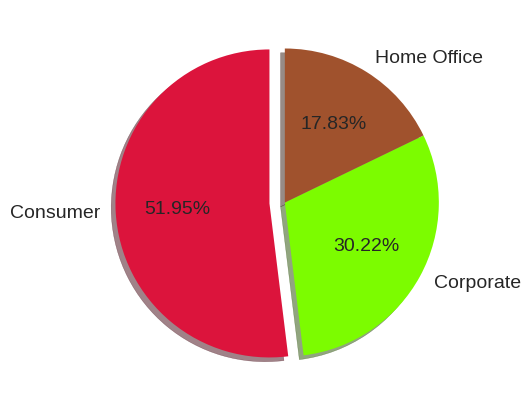

In [ ]:
plt.figure(figsize=(10,5))
labels = df['Segment'].value_counts().keys()
values = df['Segment'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna'])
plt.show()

More than half of the entire population belongs to the Consumer segment.

In [ ]:
df['Ship Mode'].value_counts()

,count
Ship Mode,
Standard Class,5967
Second Class,1945
First Class,1538
Same Day,543


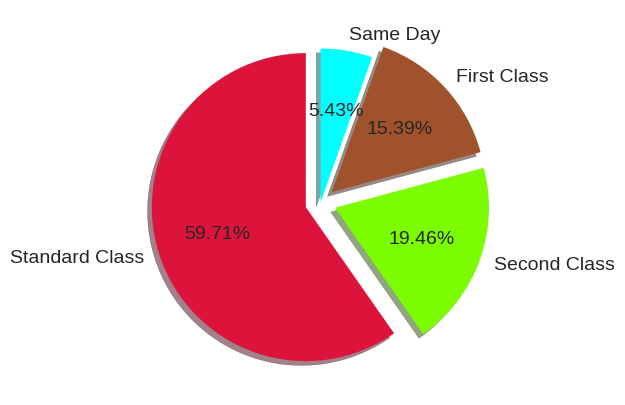

In [ ]:
plt.figure(figsize=(10,5))
labels = df['Ship Mode'].value_counts().keys()
values = df['Ship Mode'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0.1,0.1,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna','cyan'])
plt.show()

A significant number of orders were delivered via the Standard shipping mode whereas First Class and Second Class shipping modes were less frequently used.

### Bivariate Analysis

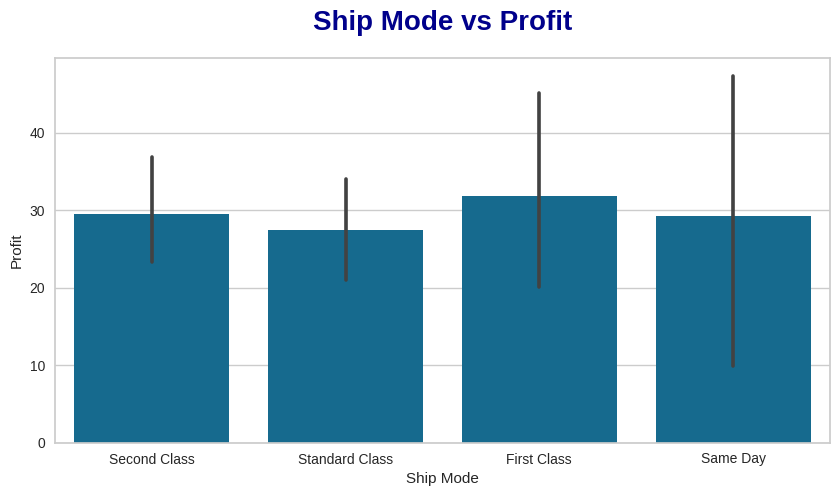

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Profit',data=df)
plt.title('Ship Mode vs Profit',pad=20,fontsize=20,color='darkblue',fontweight='bold')
plt.show()

The First Class was the most profitable shipping mode while the Standard shipping mode was the least profitable.

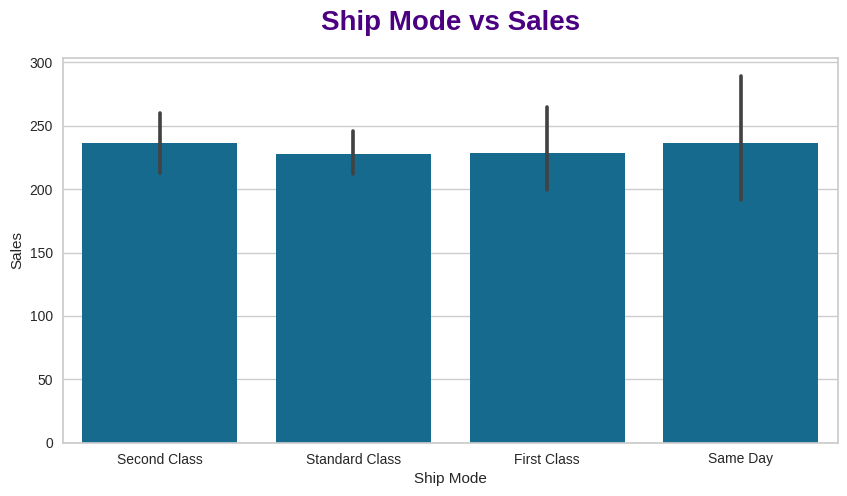

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Sales',data=df)
plt.title('Ship Mode vs Sales',pad=20,fontsize=20,fontweight='bold',color='indigo')
plt.show()

The shipping modes that generated the highest sales are Second Class and Same Day whereas Standard Class and First Class generated the least sales.

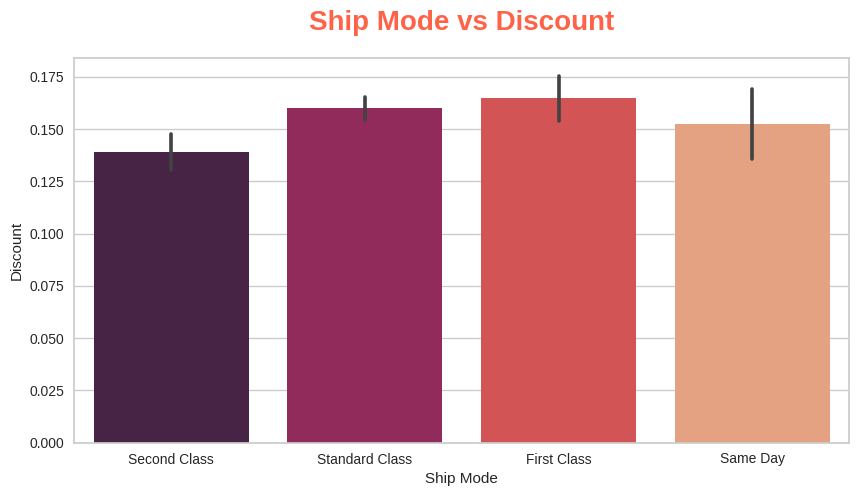

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Discount',data=df,palette='rocket')
plt.title('Ship Mode vs Discount',pad=20,fontsize=20,fontweight='bold',color='tomato')
plt.show()

The maximum discount was offered on products that were delivered via the First Class shipping mode whereas the minimum discount was given on products that were shipped via the Second Class.

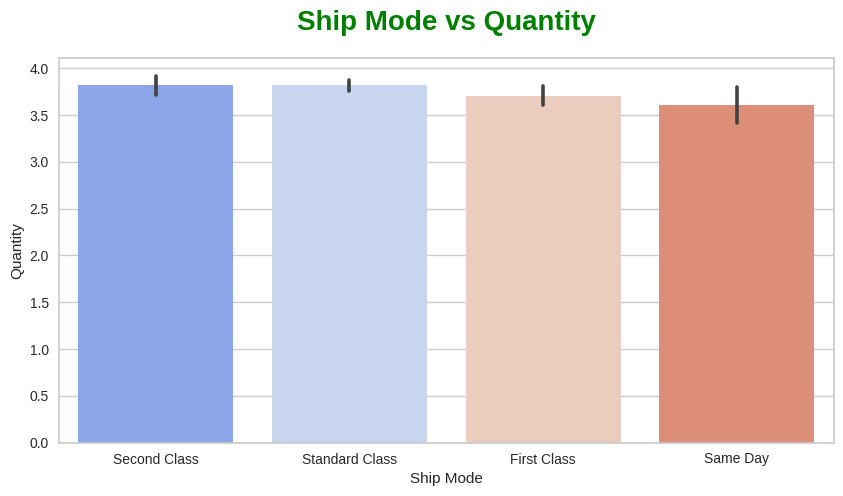

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Quantity',data=df,palette='coolwarm')
plt.title('Ship Mode vs Quantity',pad=20,fontsize=20,fontweight='bold',color='green')
plt.show()

The highest quantities of products were shipped via the Second Class and Standard Class shipping modes whereas the least quantities were shipped through the Same Day shipping mode.

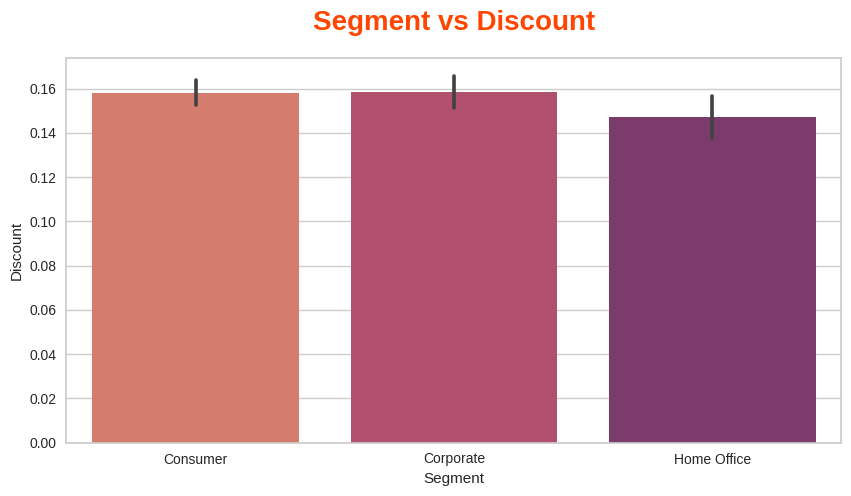

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Discount',data=df,palette='flare')
plt.title('Segment vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

The highest discount was given on the orders made by Consumer and Corporate segments whereas those made by Home Office provided the least discount.

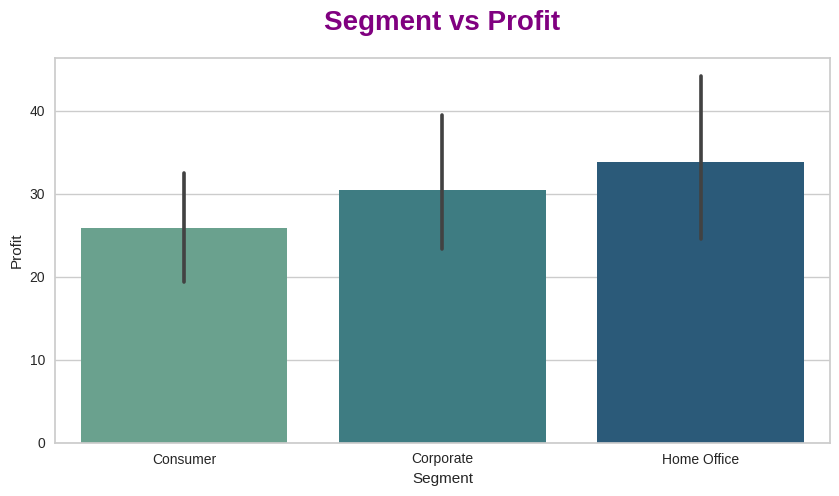

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Profit',data=df,palette='crest')
plt.title('Segment vs Profit',pad=20,fontsize=20,fontweight='bold',color='purple')
plt.show()

The orders made by Home Office segment generated the highest profit whereas those made by Consumer and Corporate segments generated the least profit.

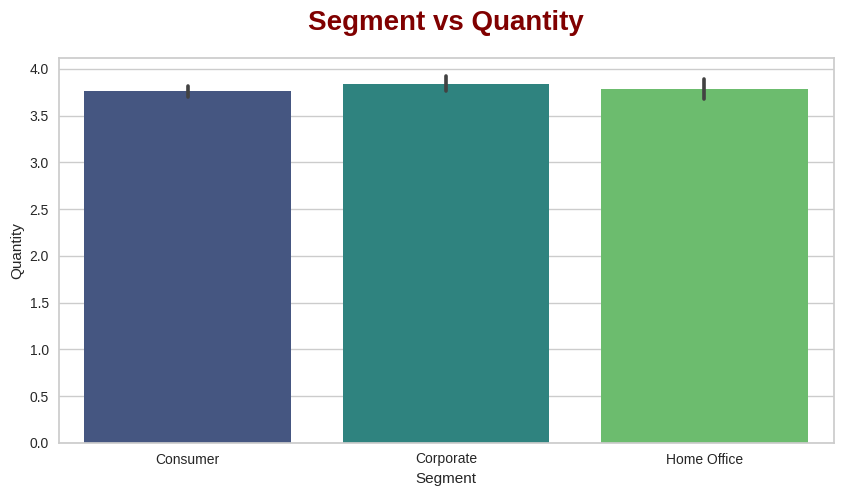

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Quantity',data=df,palette='viridis')
plt.title('Segment vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased by the Corporate segment whereas the lowest quantities were purchased by the Consumer segment.

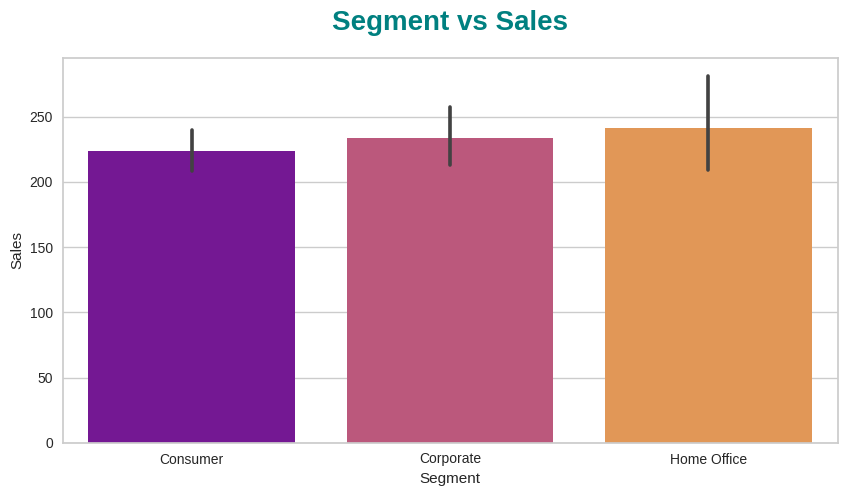

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Sales',data=df,palette='plasma')
plt.title('Segment vs Sales',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The orders made by the Home Office segment generated the maximum sales whereas those made by the Consumer segment generated the minimum sales.

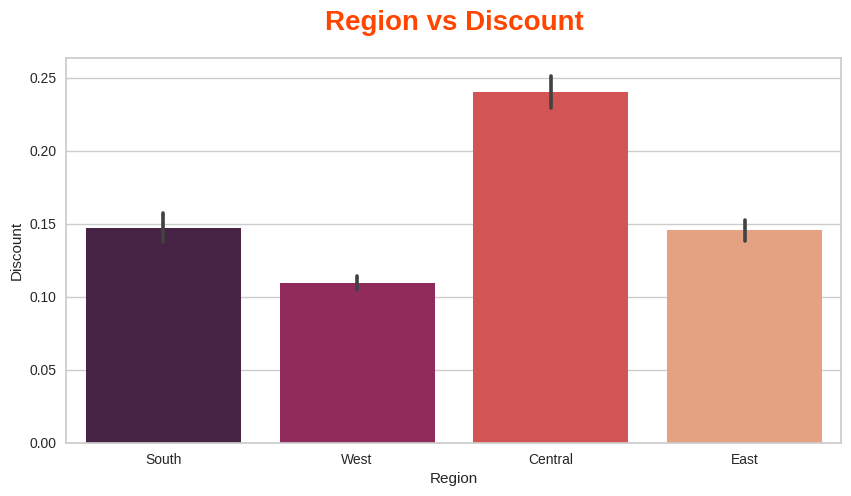

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Discount',data=df,palette='rocket')
plt.title('Region vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A substantial discount was offered on the orders made in the Central region whereas the least discount was given on those made in the Western region.

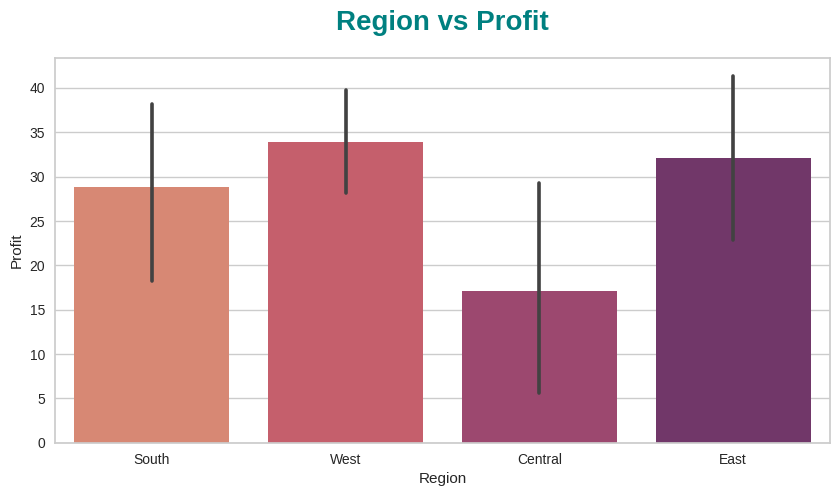

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Profit',data=df,palette='flare')
plt.title('Region vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The largest profit was recorded in the Western region while the lowest profit was obtained in the Central region.

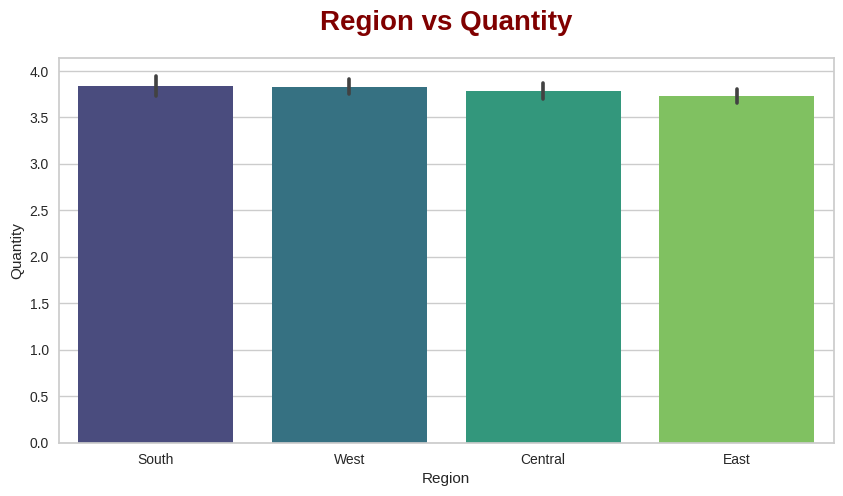

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Quantity',data=df,palette='viridis')
plt.title('Region vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased in the Southern and Western regions whereas the lowest quantities were ordered in the Eastern region. However, there is overall a minimal difference in the quantities of products ordered across all regions.

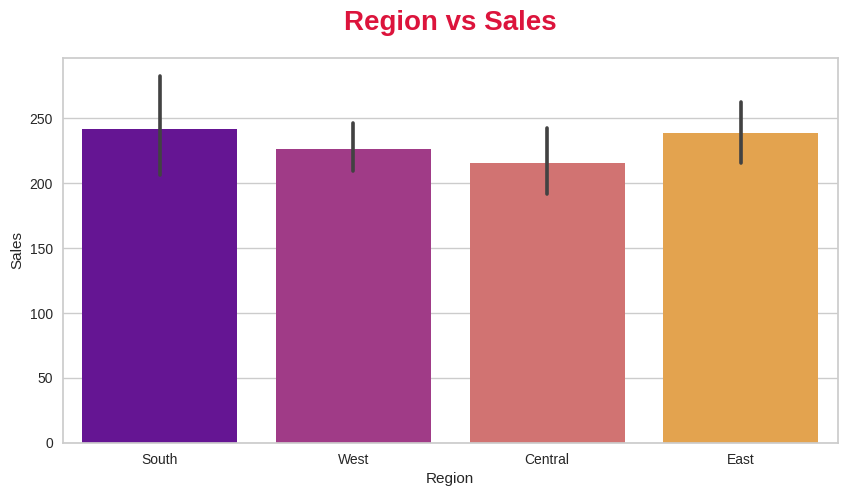

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Sales',data=df,palette='plasma')
plt.title('Region vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The highest sales were recorded in the South and East regions while the lowest sales were observed in the Central region.

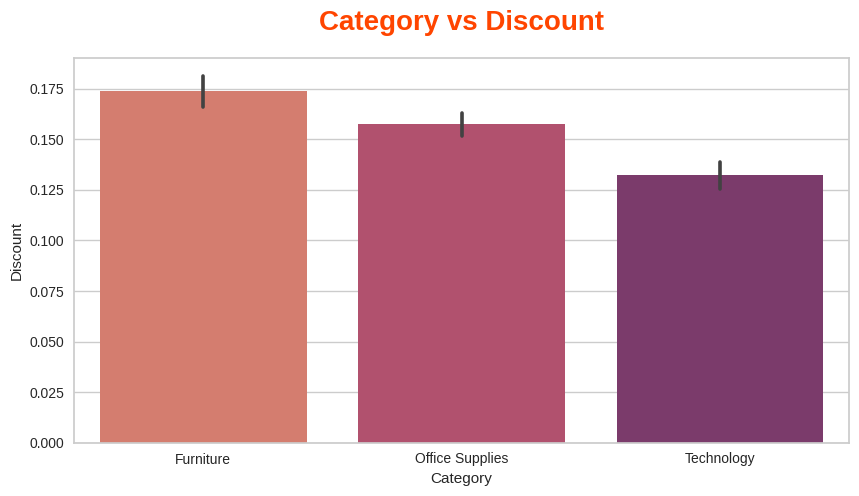

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Discount',data=df,palette='flare')
plt.title('Category vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A significant discount was provided on furniture products whereas the least discount was given on technology products.

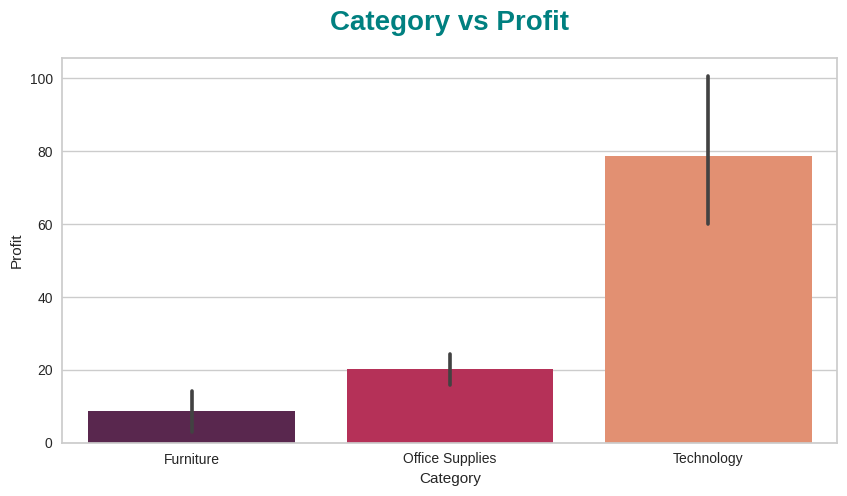

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Profit',data=df,palette='rocket')
plt.title('Category vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The products belonging to the Technology category are the most profitable while the products belonging to the Furniture category are the least profitable.

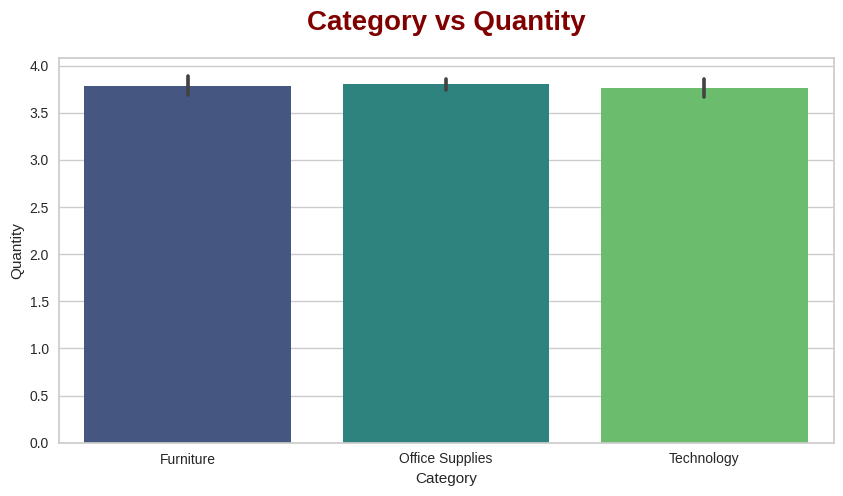

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Quantity',data=df,palette='viridis')
plt.title('Category vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

All categories have almost similar quantities of products ordered.

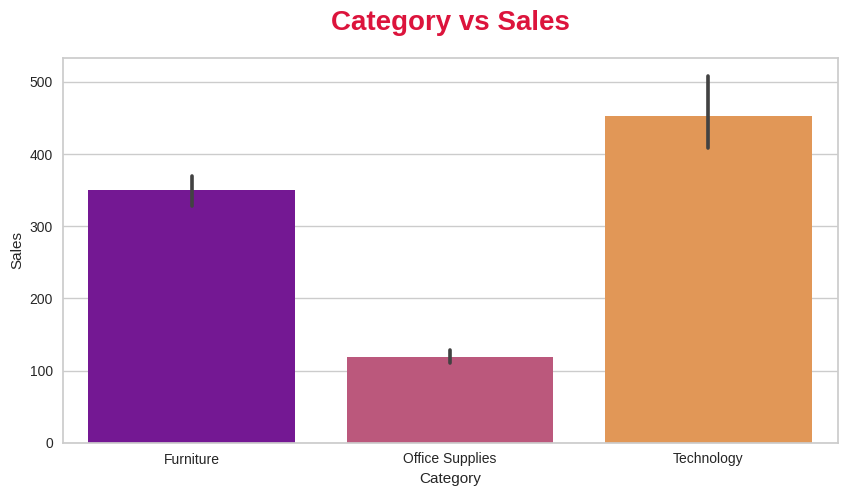

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Sales',data=df,palette='plasma')
plt.title('Category vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The maximum sales were recorded in the Technology category while the lowest sales were obtained in the Office Supplies category.

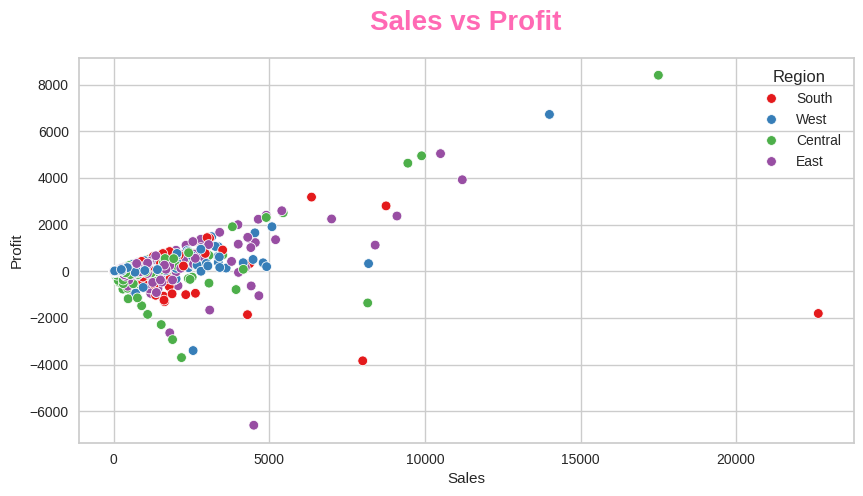

79343

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Region',palette='Set1')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The Western region recorded the lowest sales and profit among all regions whereas the Eastern region generated a considerable profit in general across all regions.

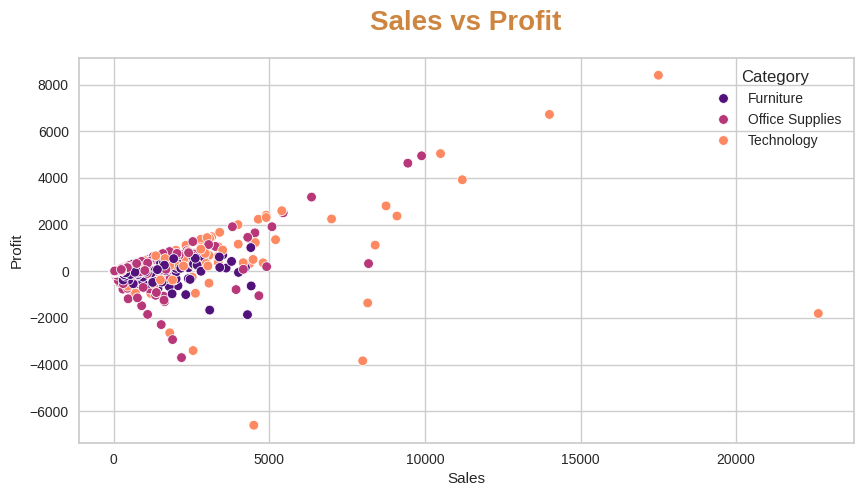

43399

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Category',palette='magma')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='peru')
plt.show()
plt.close('all')
del fig
gc.collect()

It is clearly evident from the above plot that the highest profit was obtained in the Technology category whereas the lowest profit was obtained in the Office Supplies category.

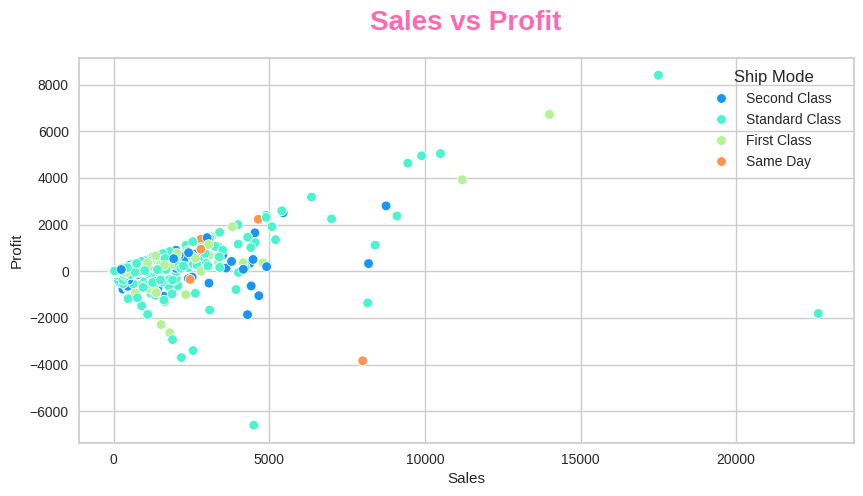

3923

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Ship Mode',palette='rainbow')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The highest sales and profit were recorded in the orders delivered via the Standard Class shipping mode while the Second Class shipping mode was the least profitable.

### Multivariate Analysis

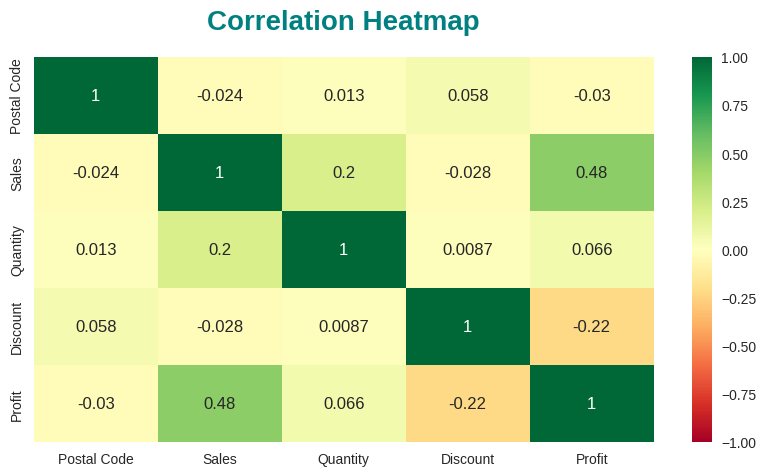

3918

In [ ]:
plt.figure(figsize=(10,5))
numerical_df = df.select_dtypes(include=np.number)
fig = sns.heatmap(numerical_df.corr(),annot=True,cmap='RdYlGn',vmin=-1.0,vmax=1.0)
plt.title('Correlation Heatmap',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()
plt.close('all')
del fig
gc.collect()

<Figure size 1000x500 with 0 Axes>

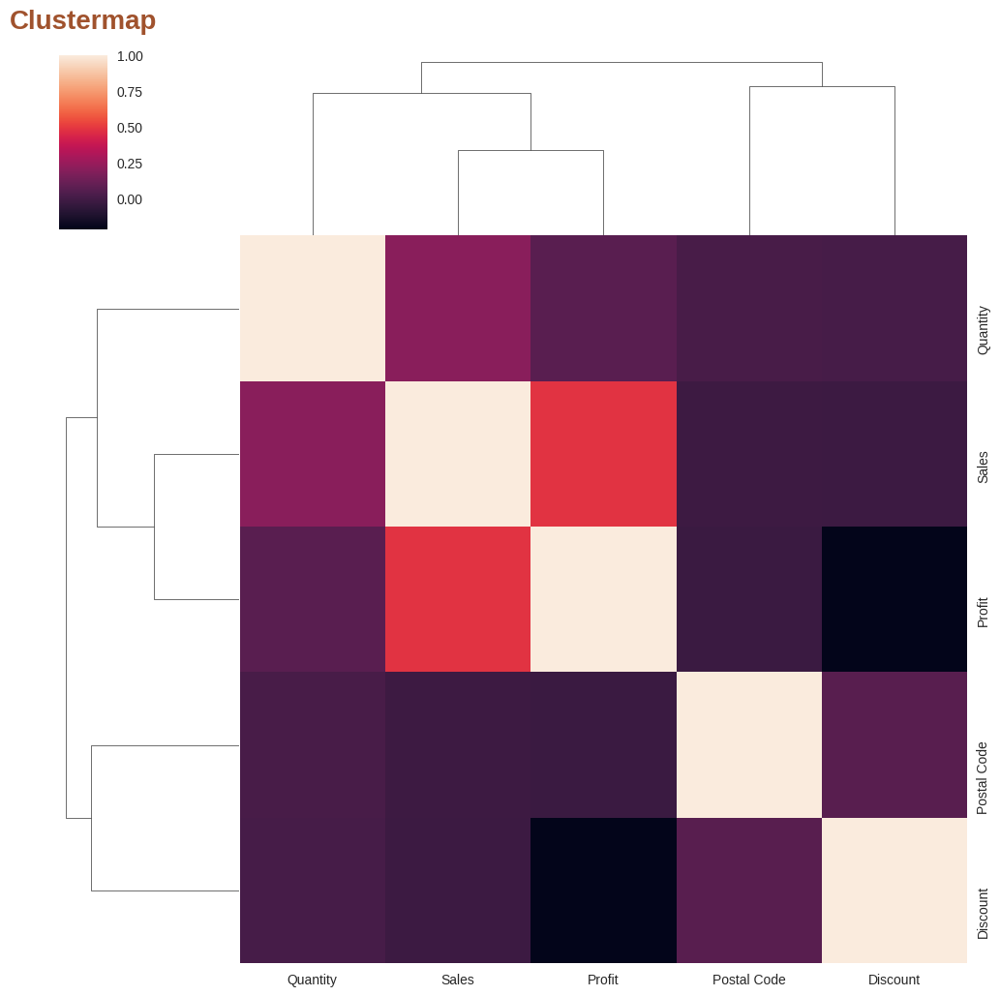

6363

In [ ]:
plt.figure(figsize=(10,5))
numerical_df = df.select_dtypes(include=np.number)
fig = sns.clustermap(numerical_df.corr())
plt.title('Clustermap',pad=20,fontsize=20,fontweight='bold',color='sienna')
plt.show()
plt.close('all')
del fig
gc.collect()

<Figure size 1000x500 with 0 Axes>

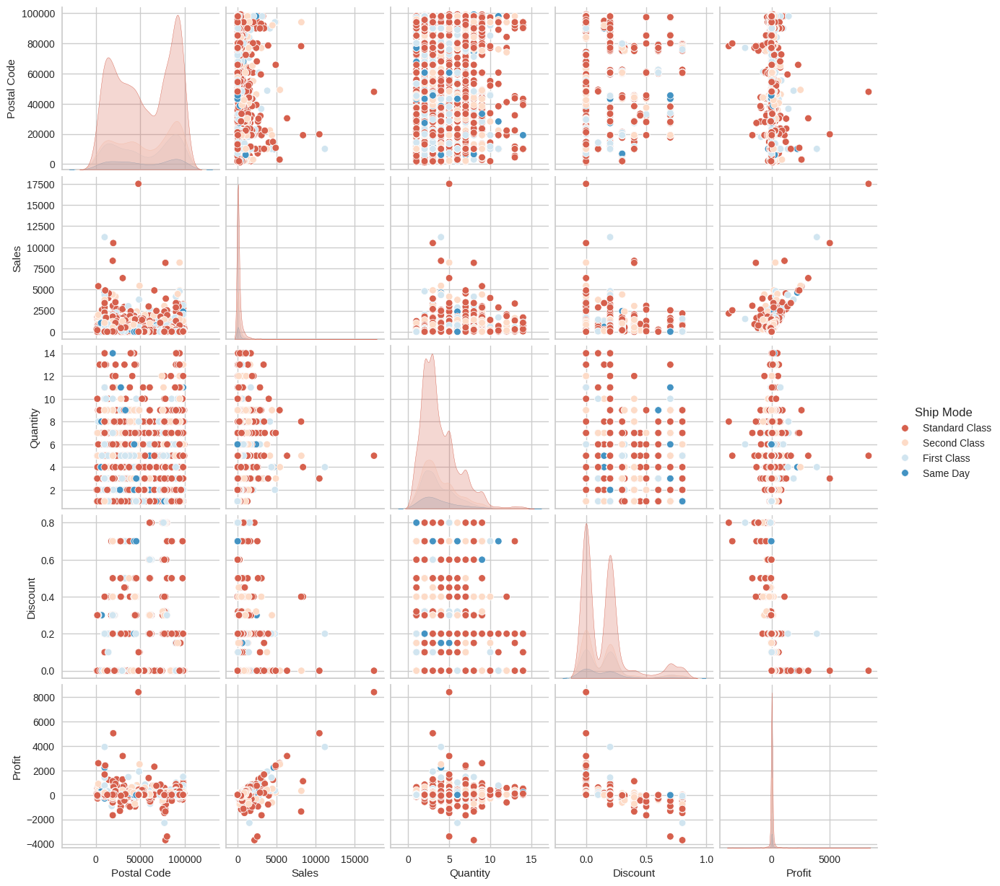

195

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.pairplot(df.sample(n=5000),hue='Ship Mode',palette='RdBu')
plt.show()
plt.close('all')
del fig
gc.collect()

## Feature Engineering

### Feature Extraction

In [ ]:
df['Profit Margin'] = df['Profit']/df['Sales']
df['Discounted Profit'] = df['Profit']-df['Profit']*df['Discount']
df['Discount Percentage'] = df['Discount']/df['Sales']*100
df['Operating Expenses'] = df['Sales'] - df['Profit']
df['Net Profit'] = df['Profit'] - df['Discount']

In [ ]:
df['Order Date'] = pd.to_datetime(df['Order Date'],errors='coerce')
df['Ship Date'] = pd.to_datetime(df['Ship Date'],errors='coerce')

In [ ]:
df['Order Year'] = df['Order Date'].dt.year
df['Order Month'] = df['Order Date'].dt.month
df['Order Day'] = df['Order Date'].dt.day
df['Order Weekday'] = df['Order Date'].dt.dayofweek
df['Ship Year'] = df['Ship Date'].dt.year
df['Ship Month'] = df['Ship Date'].dt.month
df['Ship Day'] = df['Ship Date'].dt.day
df['Ship Weekday'] = df['Ship Date'].dt.dayofweek
df.drop(['Order Date','Ship Date'],axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9993 entries, 0 to 9993
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Ship Mode            9993 non-null   object 
 1   Segment              9993 non-null   object 
 2   City                 9993 non-null   object 
 3   State                9993 non-null   object 
 4   Postal Code          9993 non-null   int64  
 5   Region               9993 non-null   object 
 6   Category             9993 non-null   object 
 7   Sub-Category         9993 non-null   object 
 8   Product Name         9993 non-null   object 
 9   Sales                9993 non-null   float64
 10  Quantity             9993 non-null   int64  
 11  Discount             9993 non-null   float64
 12  Profit               9993 non-null   float64
 13  Profit Margin        9993 non-null   float64
 14  Discounted Profit    9993 non-null   float64
 15  Discount Percentage  9993 non-null   float6

### Categorical Encoding

In [ ]:
df['Ship Mode'].unique()

array(['Second Class', 'Standard Class', 'First Class', 'Same Day'],
      dtype=object)

In [ ]:
df['Segment'].unique()

array(['Consumer', 'Corporate', 'Home Office'], dtype=object)

In [ ]:
df['Category'].unique()

array(['Furniture', 'Office Supplies', 'Technology'], dtype=object)

In [ ]:
df['Sub-Category'].unique()

array(['Bookcases', 'Chairs', 'Labels', 'Tables', 'Storage',
       'Furnishings', 'Art', 'Phones', 'Binders', 'Appliances', 'Paper',
       'Accessories', 'Envelopes', 'Fasteners', 'Supplies', 'Machines',
       'Copiers'], dtype=object)

In [ ]:
df['Product Name'].nunique()

1841

In [ ]:
df['City'].nunique()

531

In [ ]:
df['State'].nunique()

49

In [ ]:
df['Region'].unique()

array(['South', 'West', 'Central', 'East'], dtype=object)

In [ ]:
def onehotencode(data: pd.DataFrame,col: str) -> pd.DataFrame:
    encoder = OneHotEncoder(drop='first',sparse_output=False,max_categories=10)
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_data = pd.DataFrame(encoded_data,columns=encoder.get_feature_names_out())
    return encoded_data

In [ ]:
for col in ['Ship Mode','Segment','State','City','Region','Category','Sub-Category','Product Name']:
    encoded_data = onehotencode(df,col)
    df = pd.concat([df,encoded_data],axis=1)
    df.drop(col,axis=1,inplace=True)

In [ ]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit','Discounted Profit','Net Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Profit Margin','Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit', 'Discounted Profit',
                                  'Net Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Profit Margin', 'Discount Percentage',
                                  'Operating Expenses'])])

### Feature Transformation

In [ ]:
skewed_cols = ['Quantity',
 'Discount',
 'Profit',
 'Profit Margin',
 'Discounted Profit',
 'Discount Percentage',
 'Operating Expenses',
 'Net Profit',
 'Order Day',
 'Order Weekday',
 'Order Month',
 'Ship Day']

Skewness of Quantity: 1.2784155399852233
Kurtosis of Quantity: 1.9915827160047757


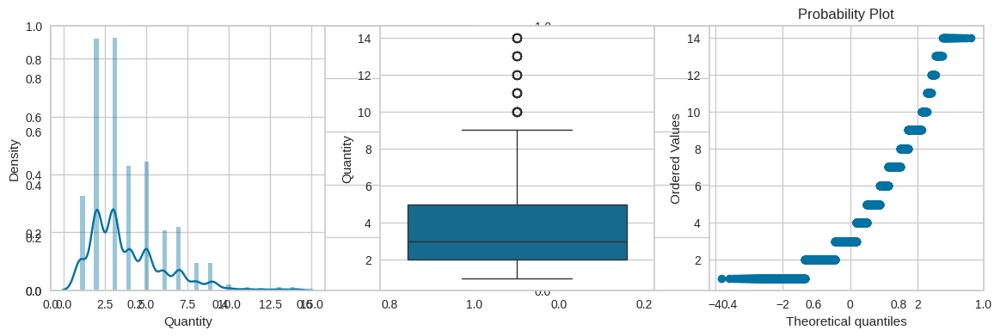

Skewness of Discount: 1.6845084876700462
Kurtosis of Discount: 2.409976524801519


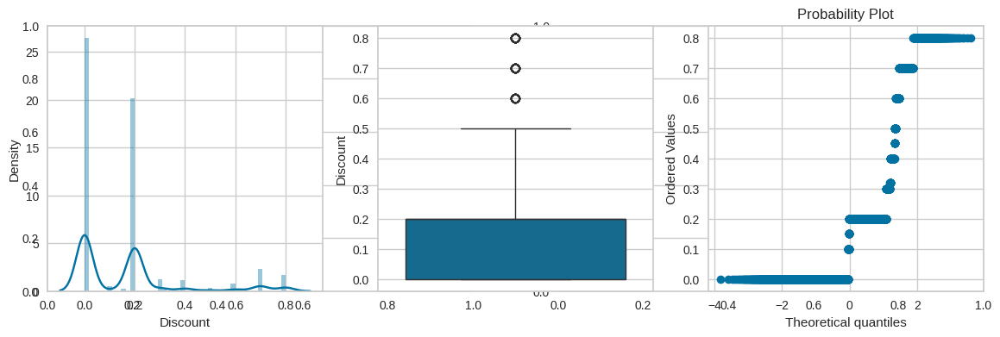

Skewness of Profit: 7.561035996041436
Kurtosis of Profit: 397.15038474389223


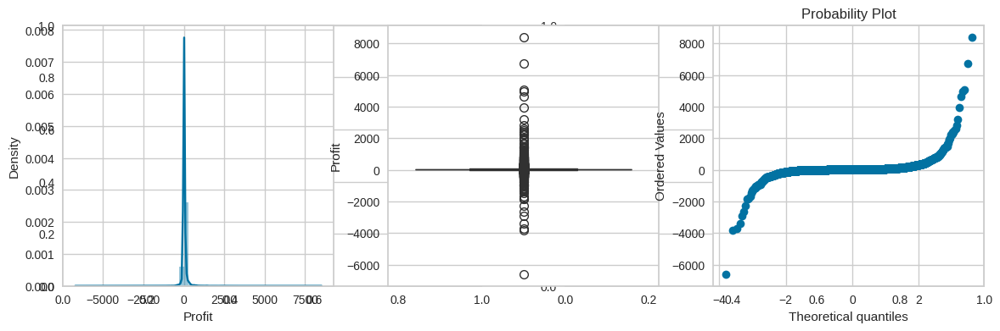

Skewness of Profit Margin: -2.894835315865789
Kurtosis of Profit Margin: 10.172752622828092


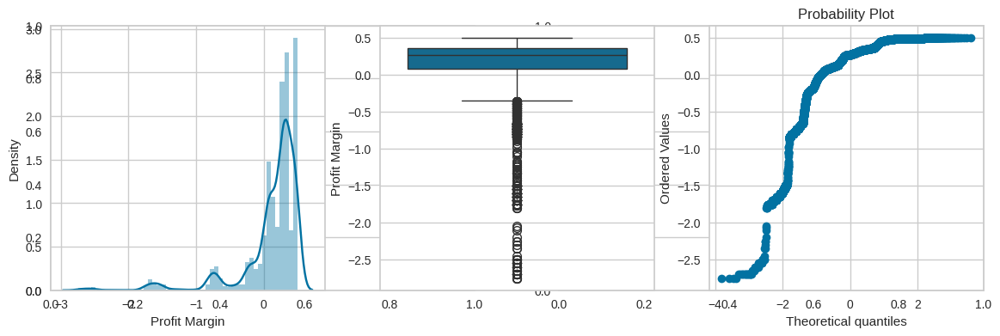

Skewness of Discounted Profit: 19.35659799419806
Kurtosis of Discounted Profit: 617.6369152241313


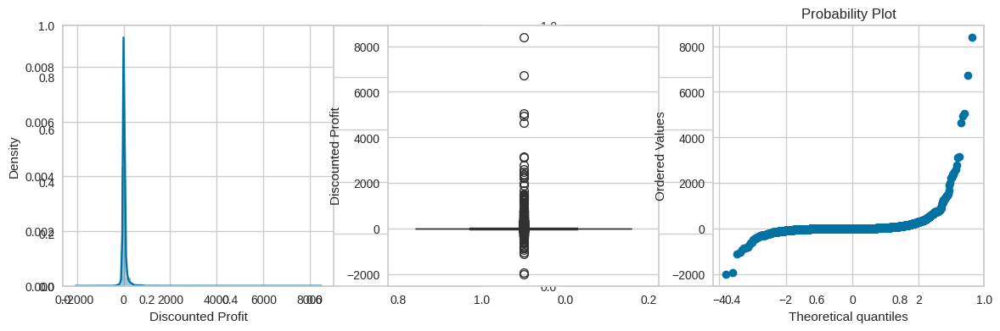

Skewness of Discount Percentage: 10.828151381652273
Kurtosis of Discount Percentage: 188.85920639655157


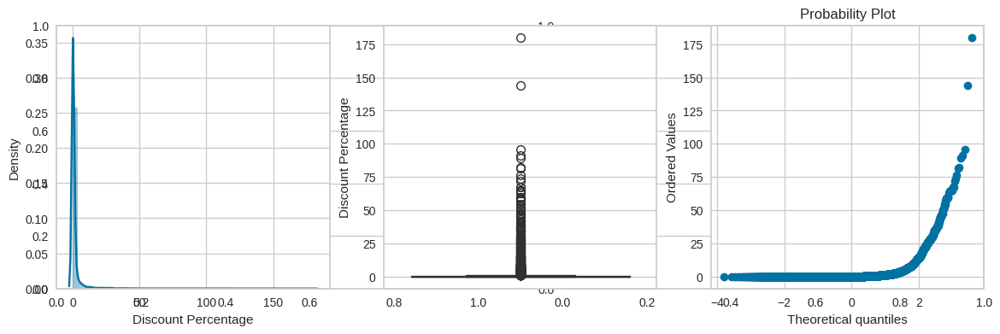

Skewness of Operating Expenses: 14.752446377055431
Kurtosis of Operating Expenses: 454.5499992208234


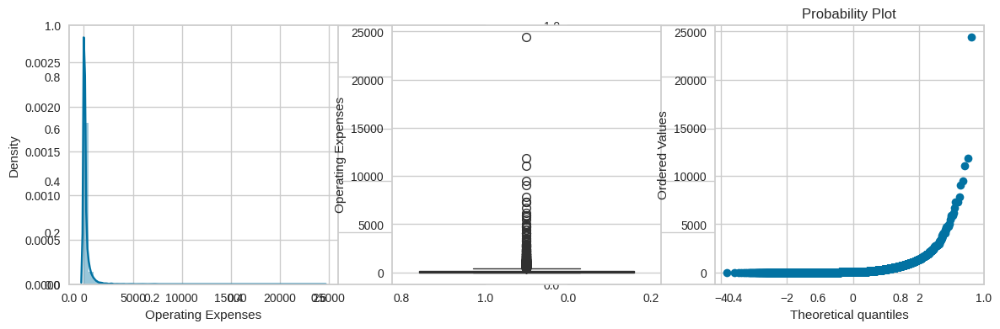

Skewness of Net Profit: 7.555768996026929
Kurtosis of Net Profit: 396.9091881919584


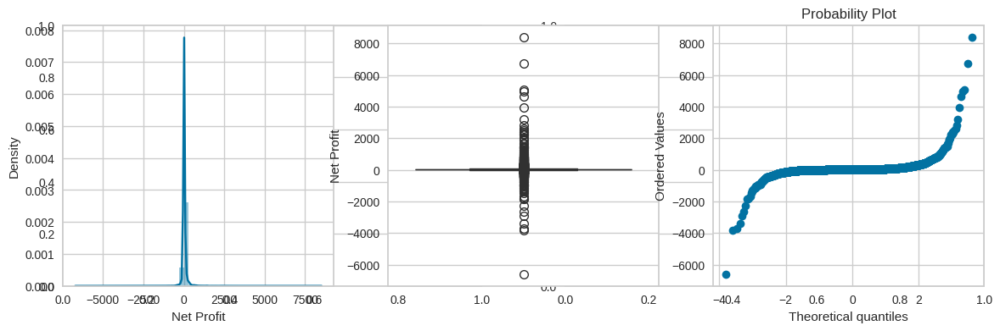

Skewness of Order Day: 0.013550065823461663
Kurtosis of Order Day: -1.1861898468255059


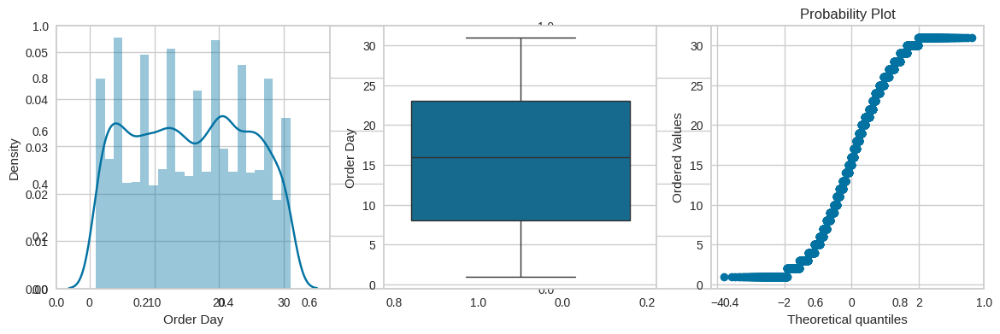

Skewness of Order Weekday: 0.12340952691336028
Kurtosis of Order Weekday: -1.0869179921056922


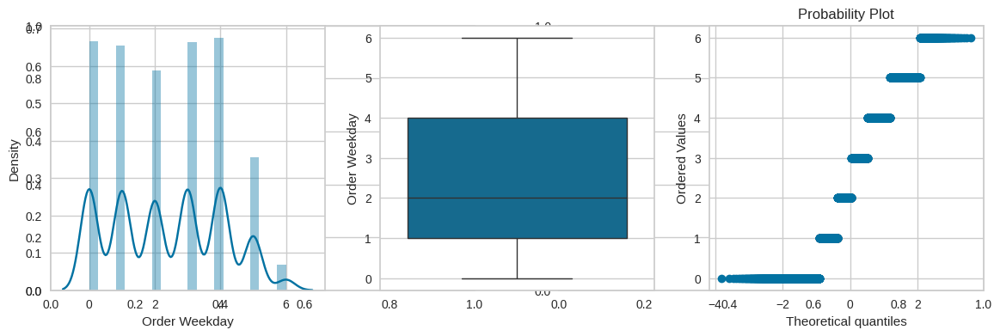

Skewness of Order Month: -0.4329511345177871
Kurtosis of Order Month: -0.9846637321437535


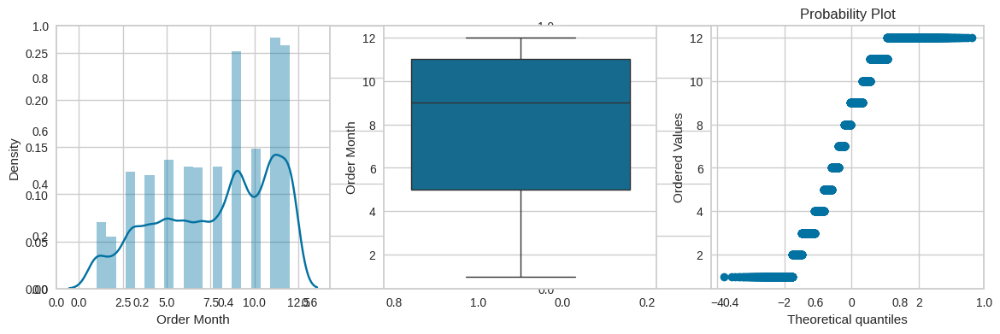

Skewness of Ship Day: -0.012355797229445813
Kurtosis of Ship Day: -1.2070053450291567


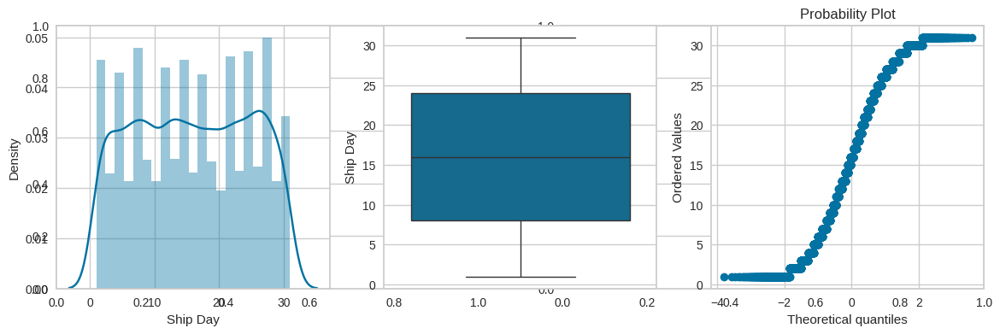

In [ ]:
for col in skewed_cols:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [ ]:
def apply_transform(data,col,transformer):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(data[col])
    plt.subplot(132)
    sns.boxplot(data[col])
    plt.subplot(133)
    probplot(data[col],rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} Before Transform")
    plt.show()
    col_tf = transformer.fit_transform(data[[col]])
    col_tf = np.array(col_tf).reshape(col_tf.shape[0])
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(col_tf)
    plt.subplot(132)
    sns.boxplot(col_tf)
    plt.subplot(133)
    probplot(col_tf,rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} After Transform")
    plt.show()
    gc.collect();

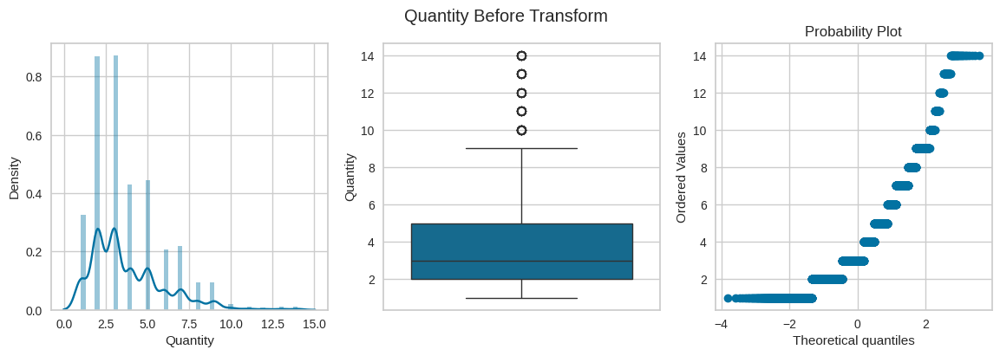

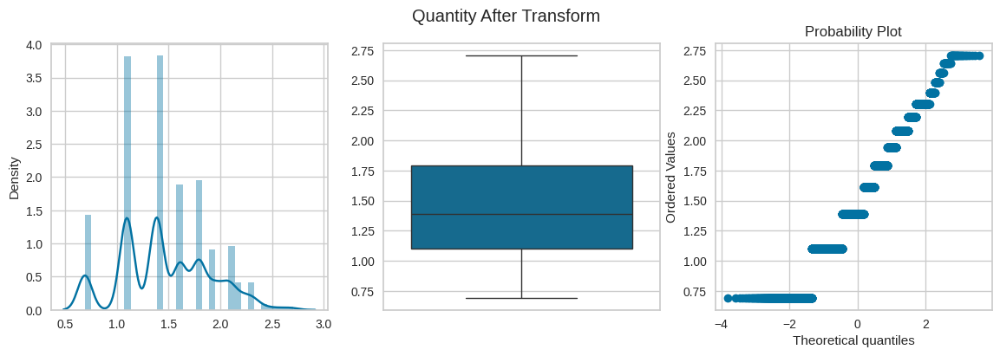

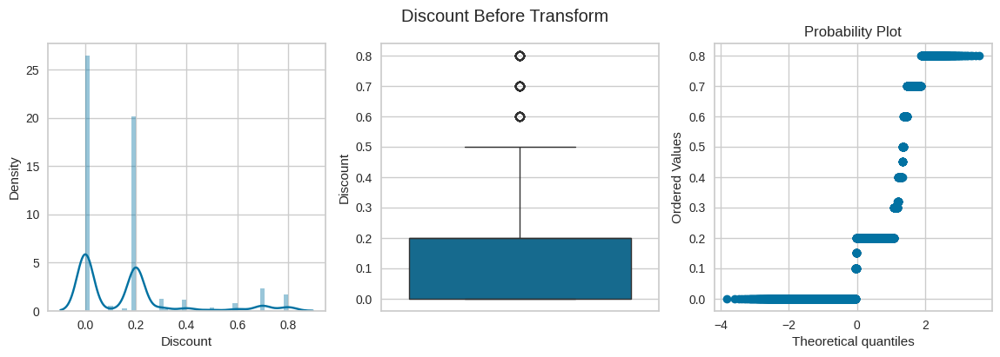

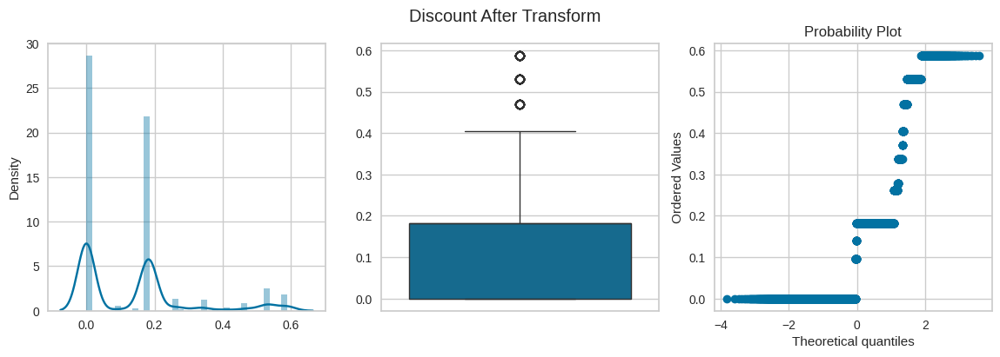

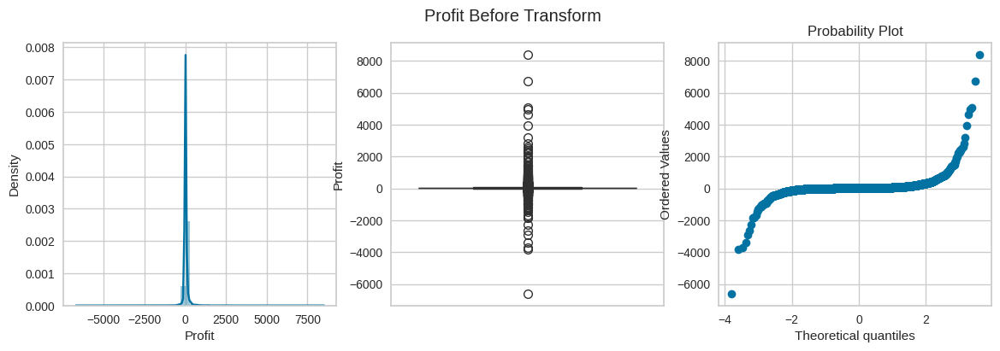

...

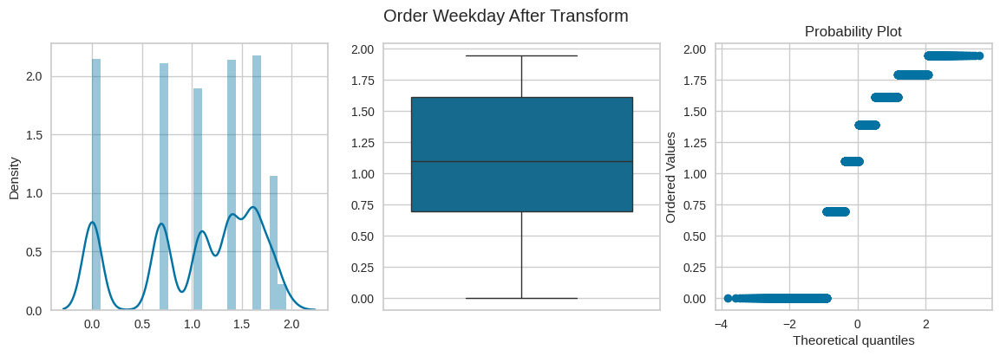

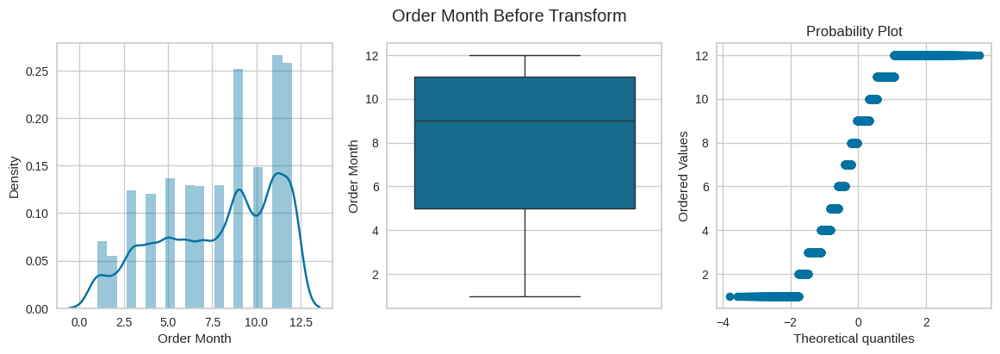

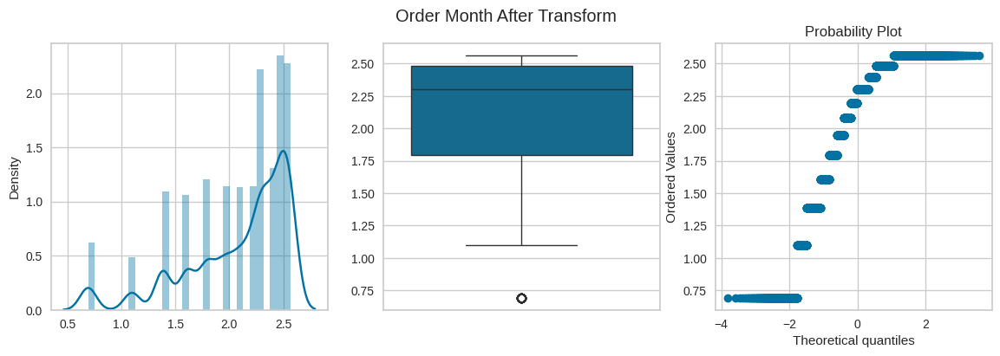

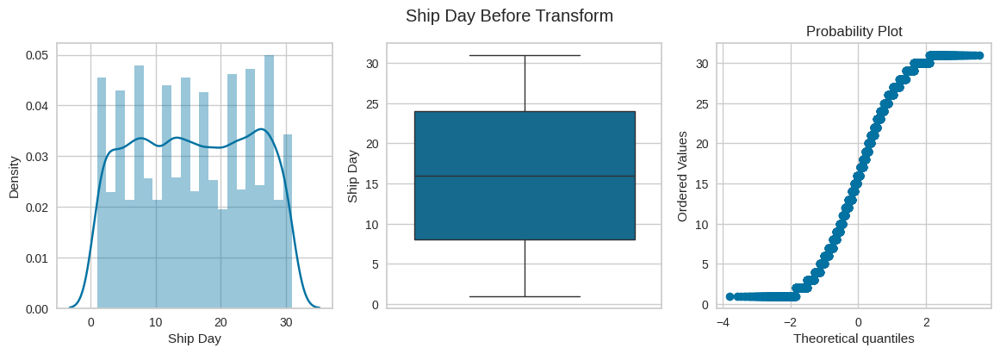

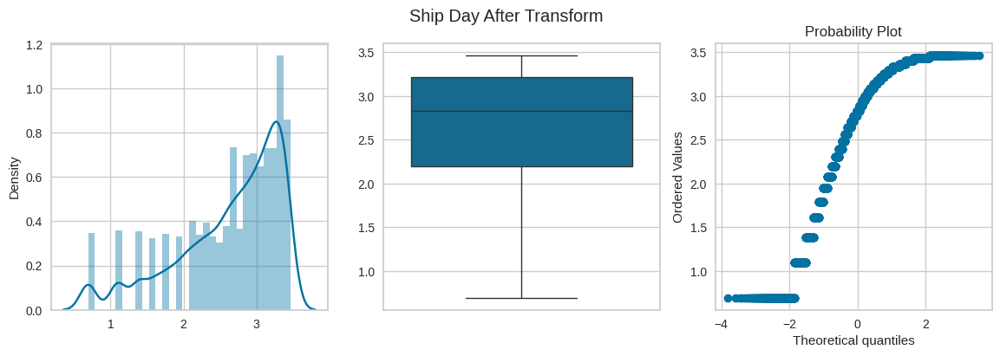

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.log1p))

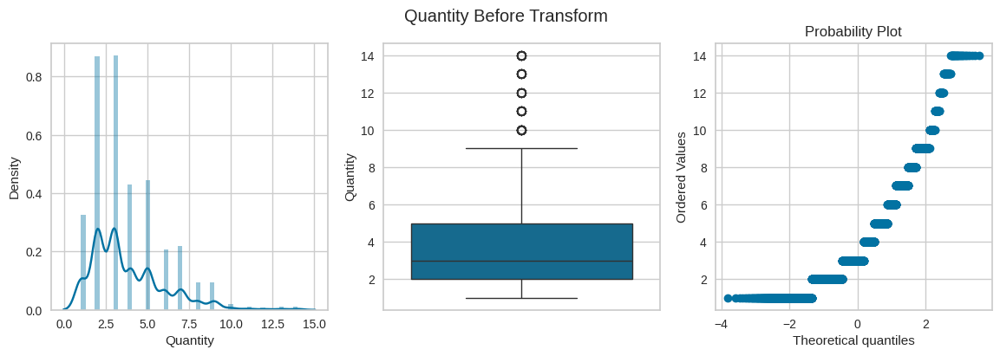

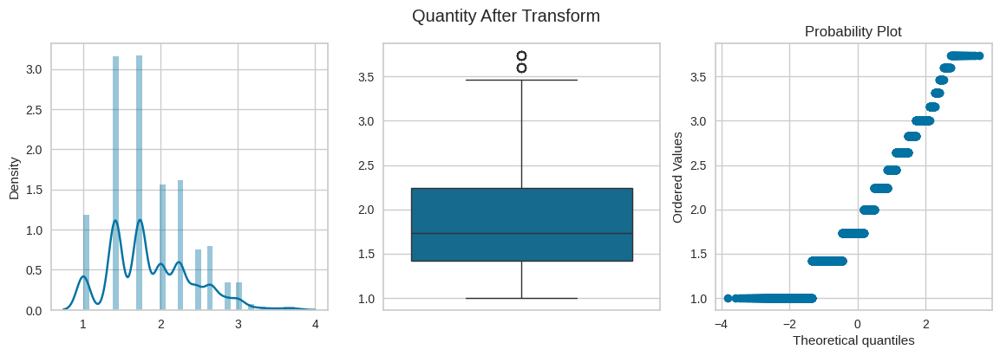

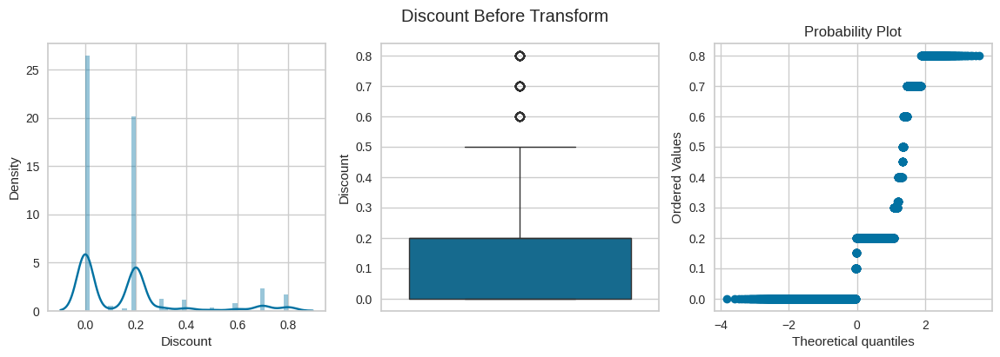

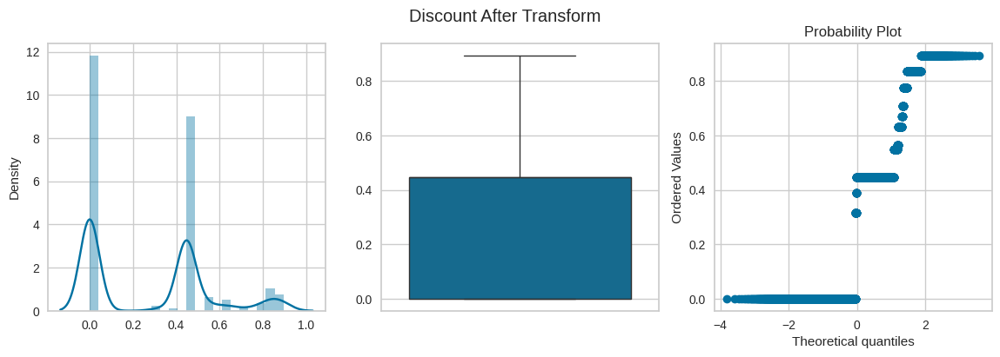

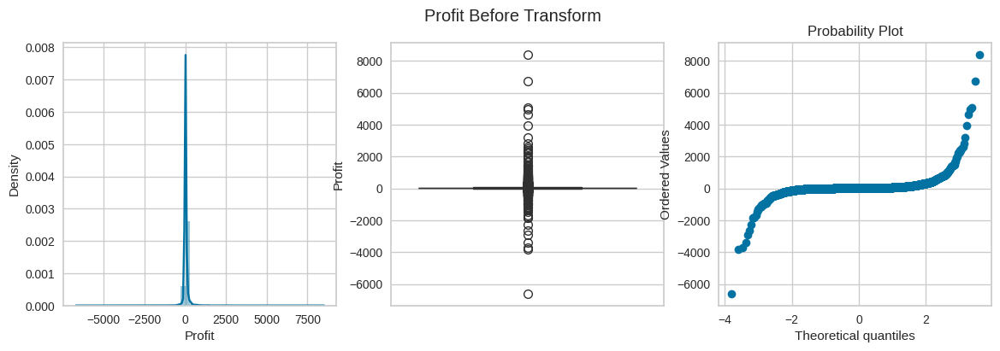

...

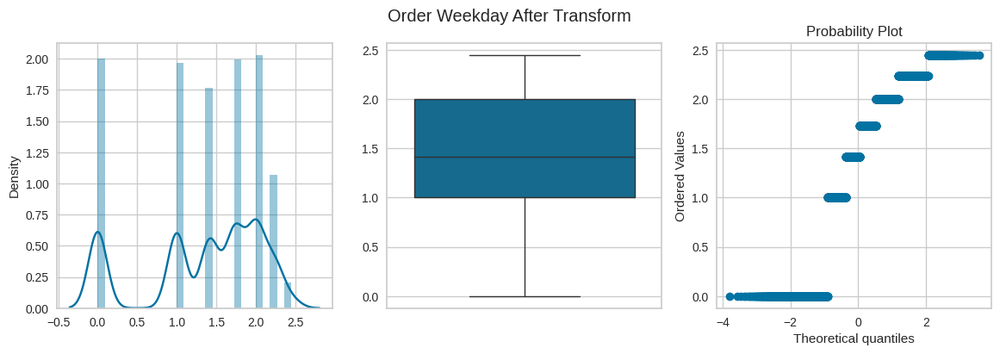

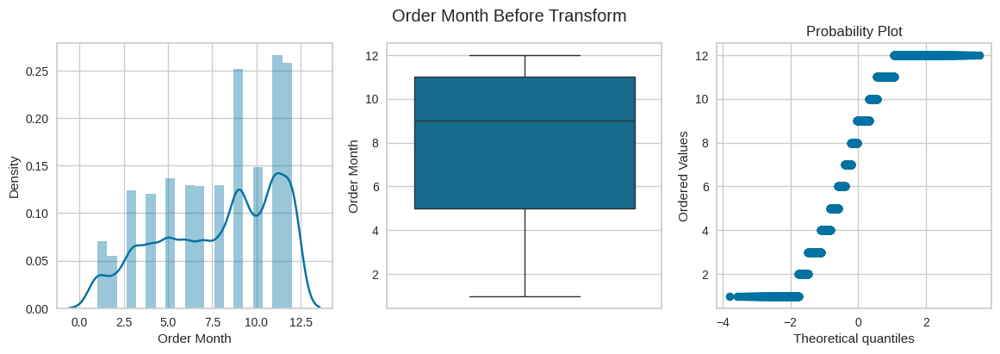

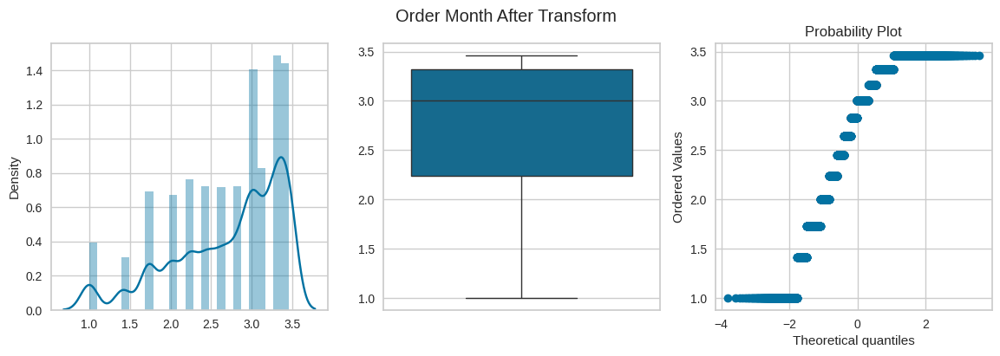

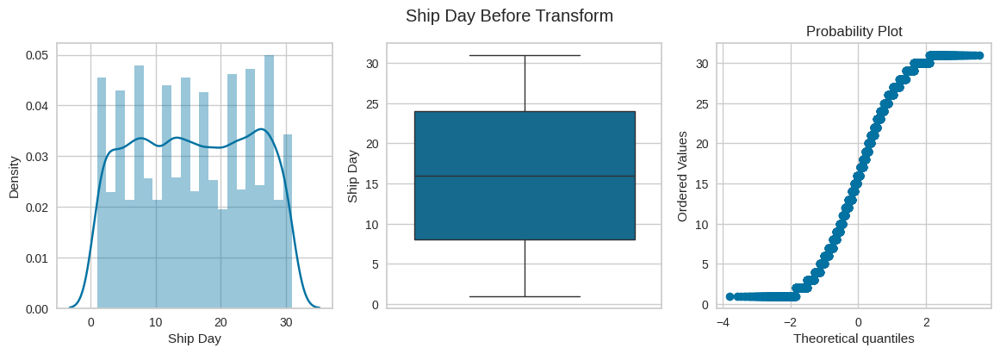

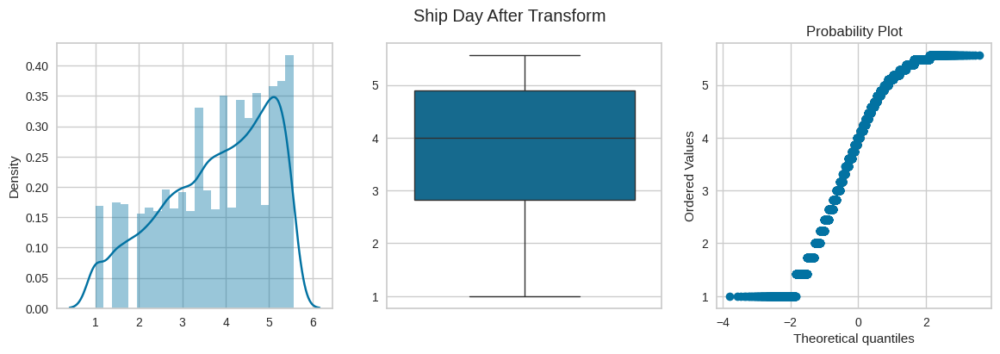

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.sqrt))

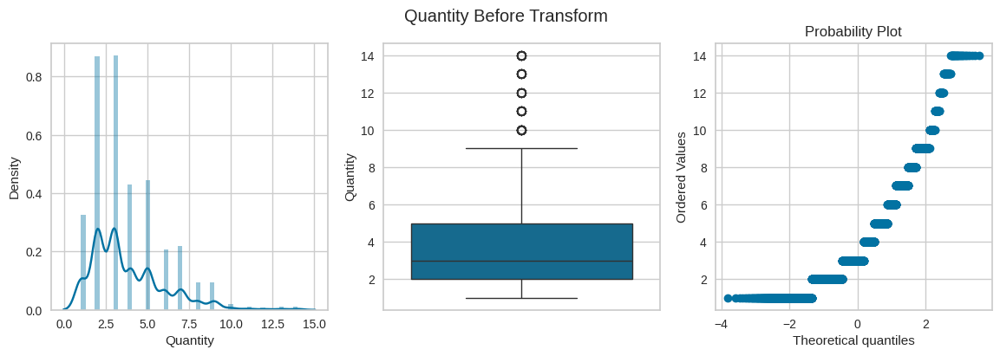

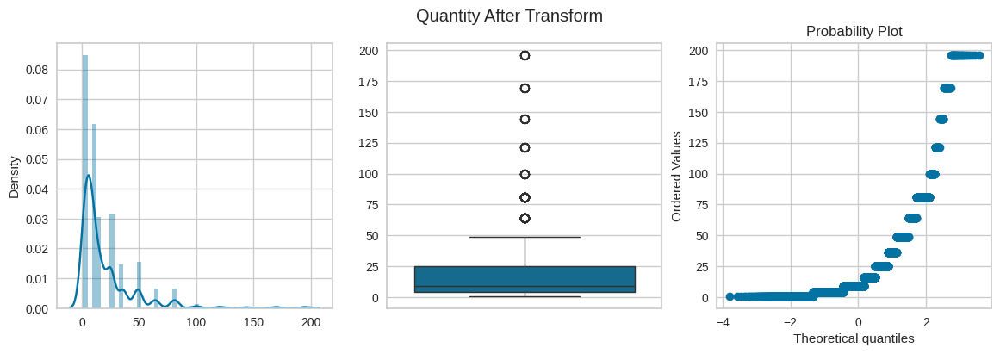

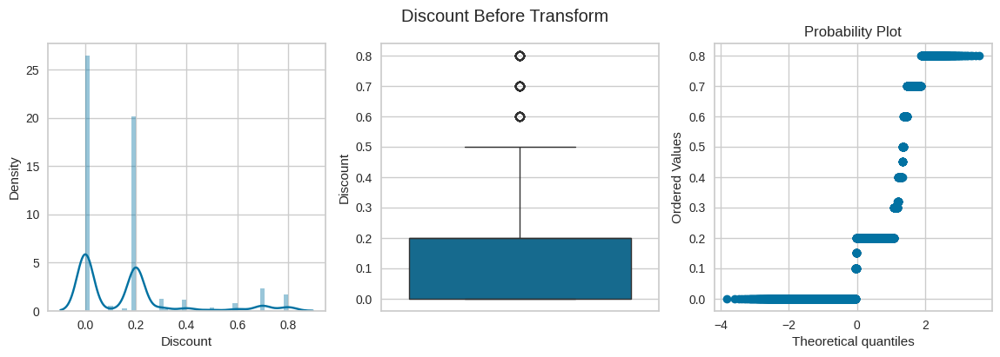

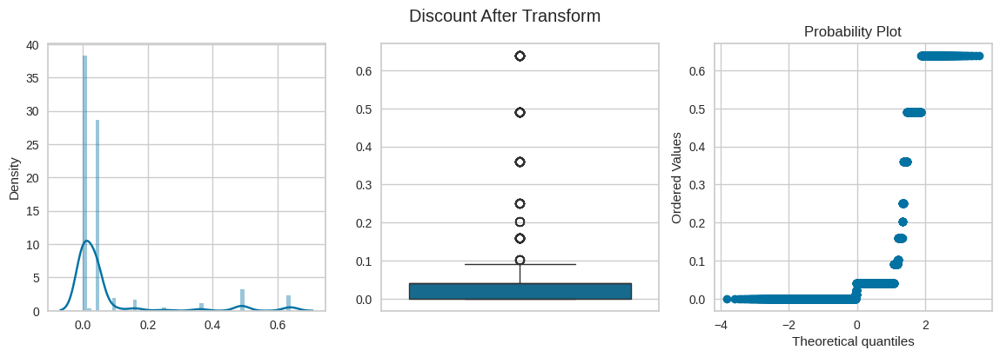

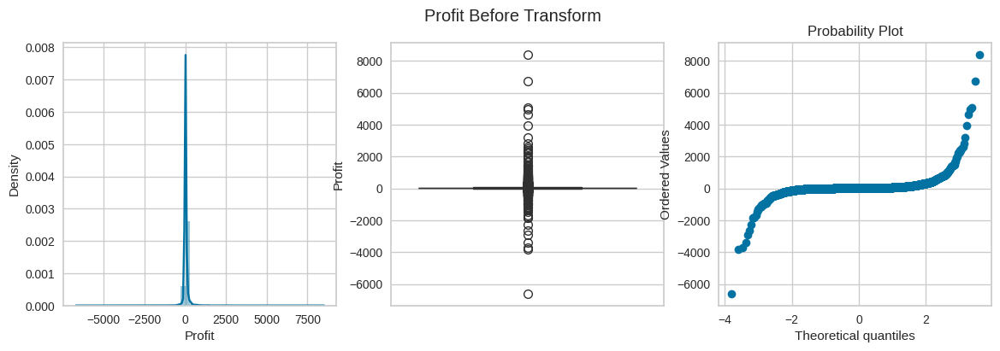

...

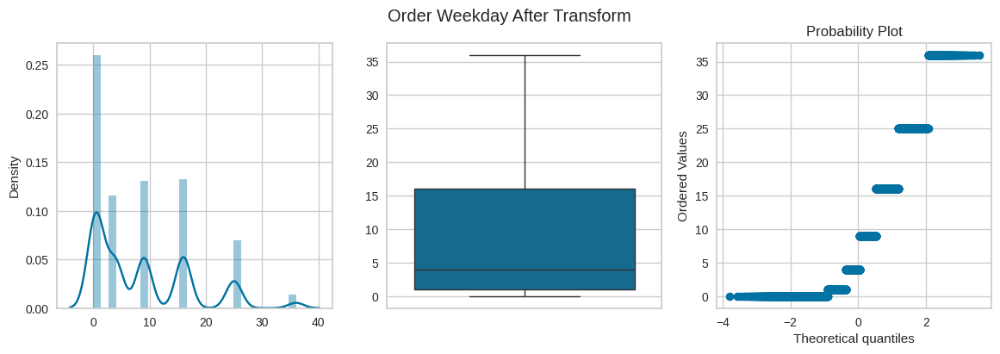

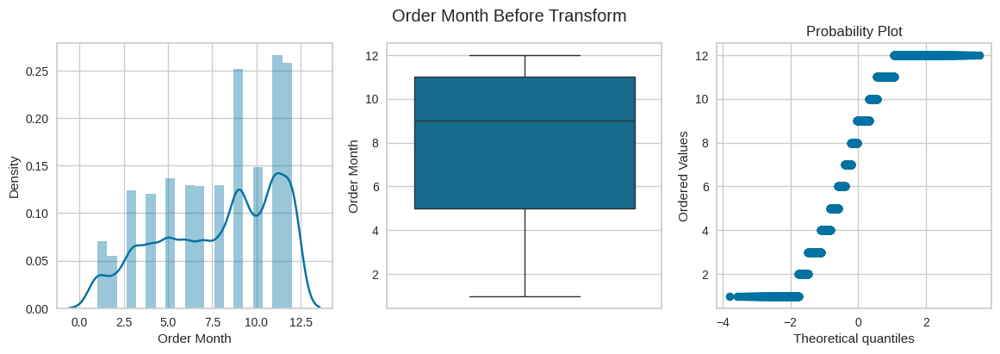

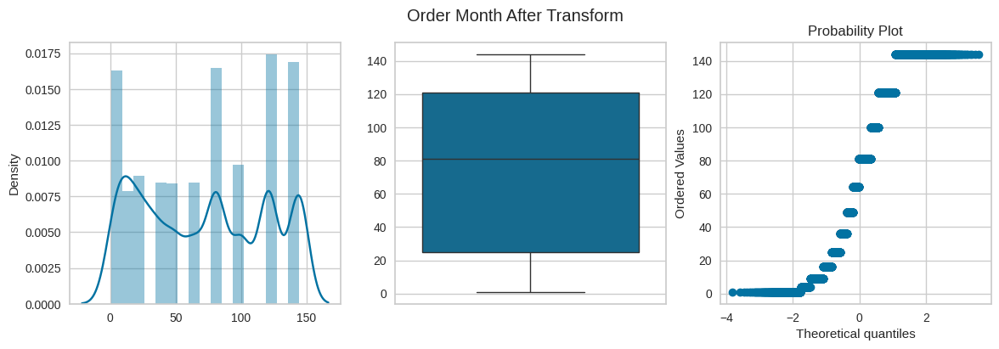

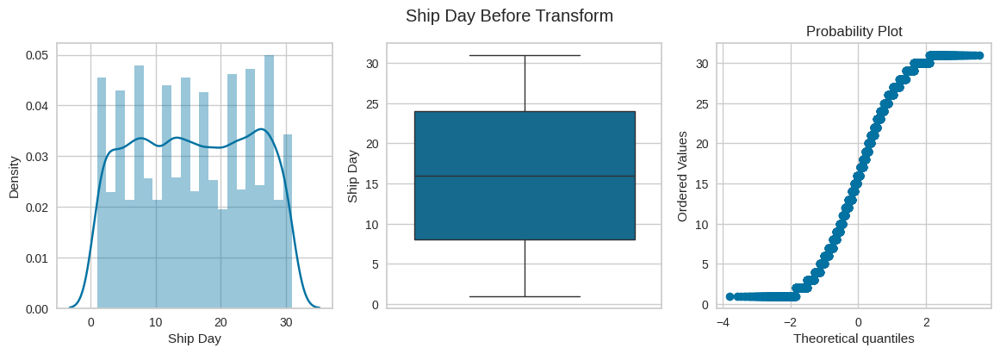

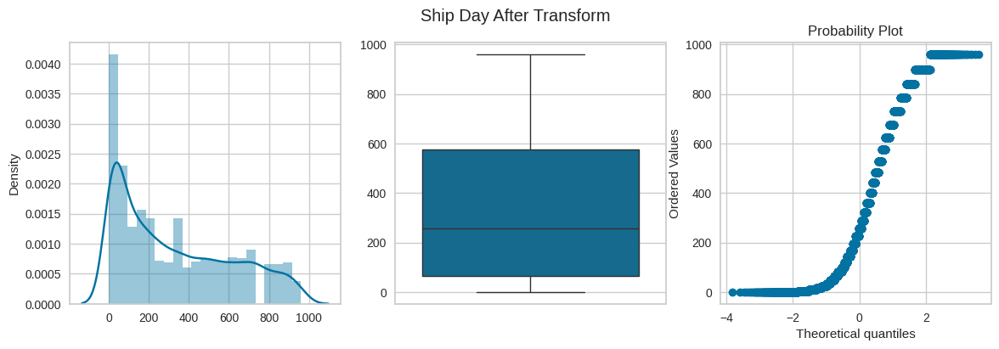

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.square))

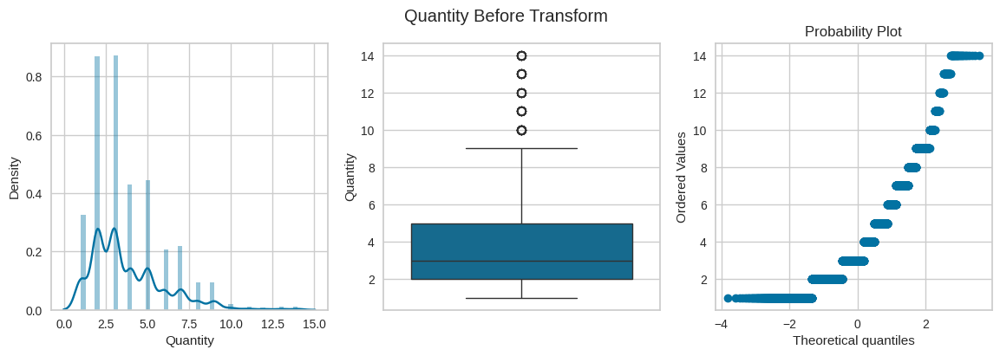

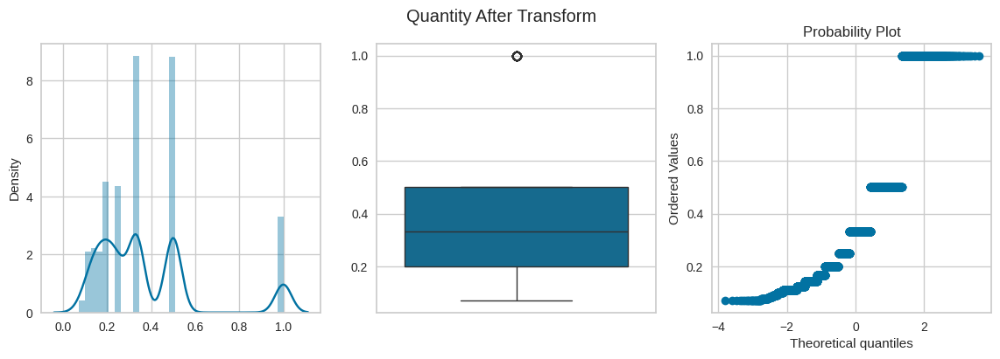

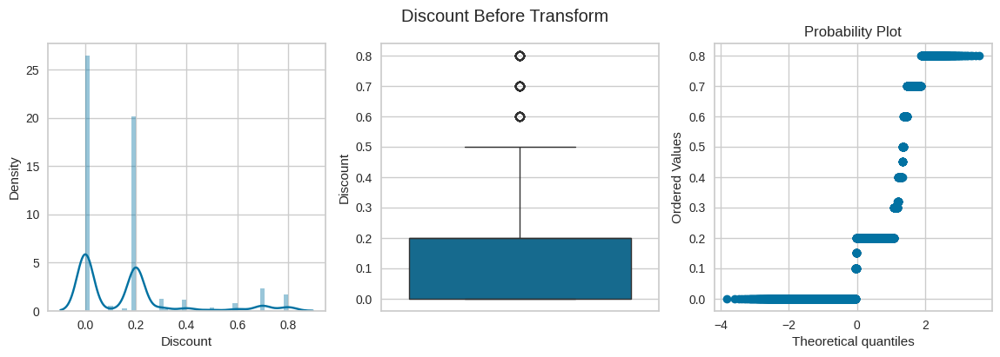

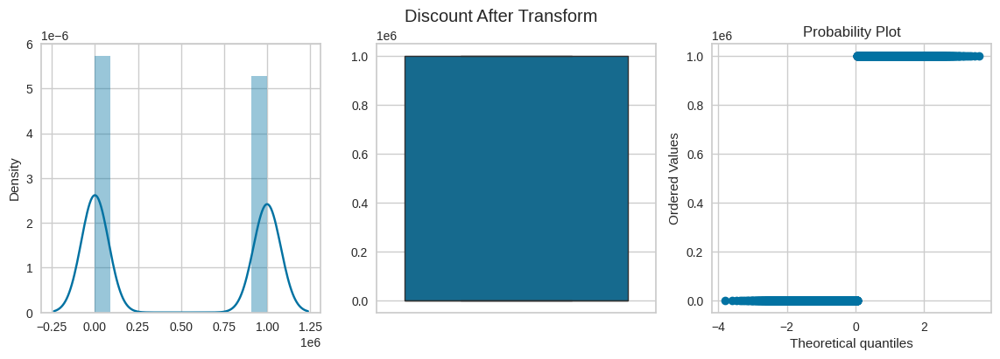

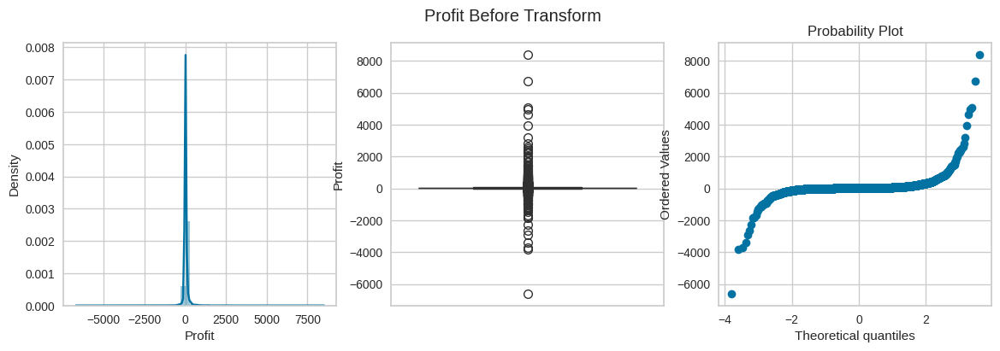

...

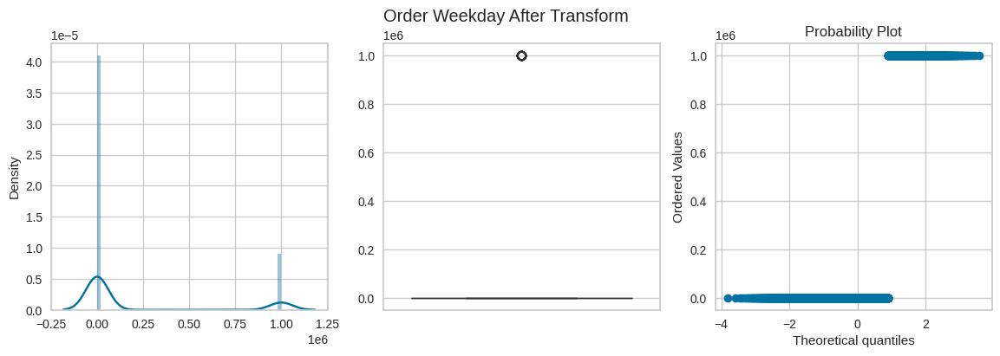

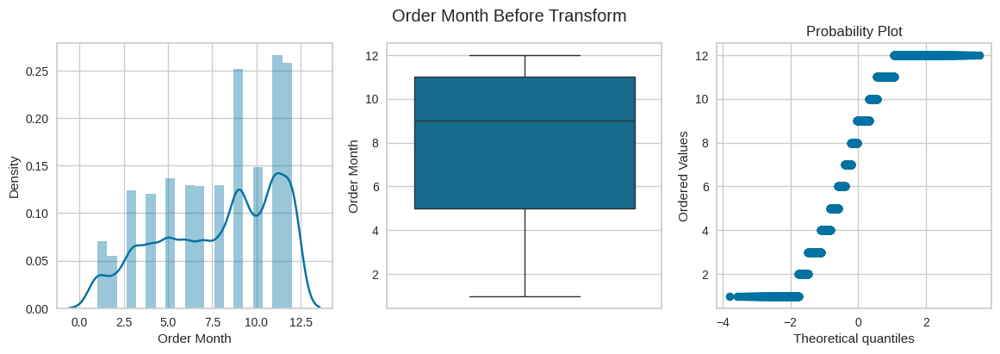

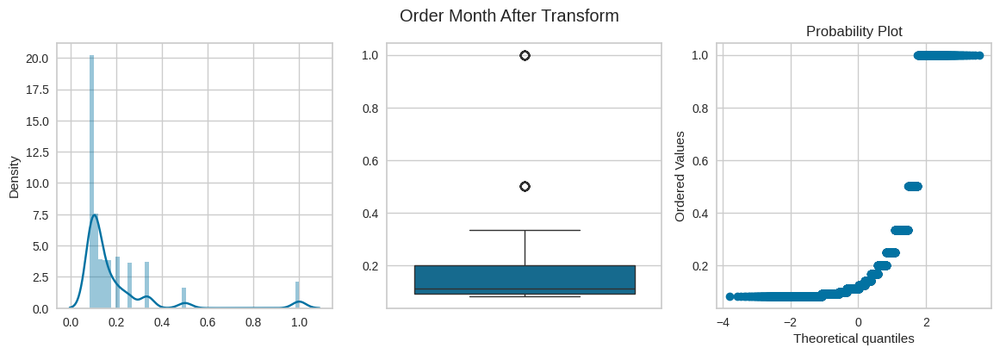

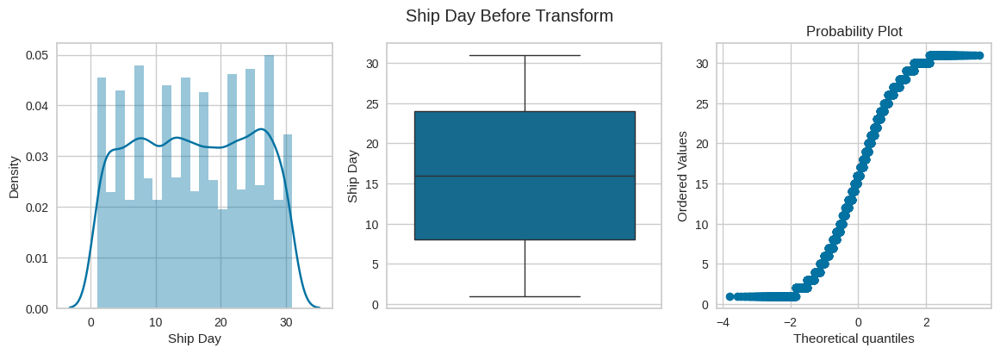

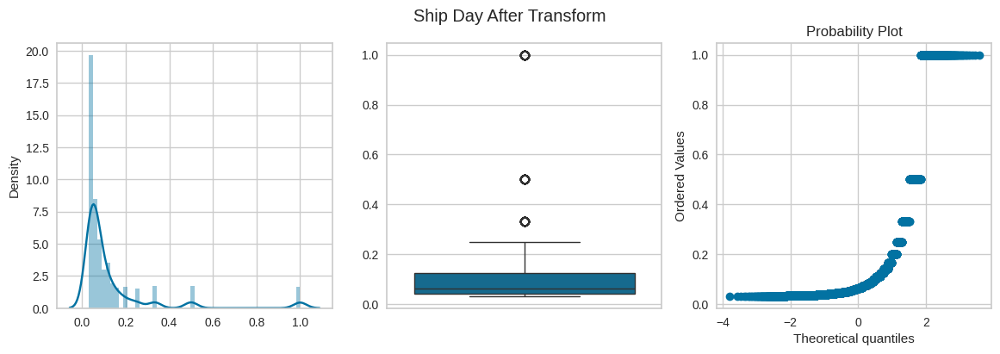

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(lambda x: 1/(x+0.000001)))

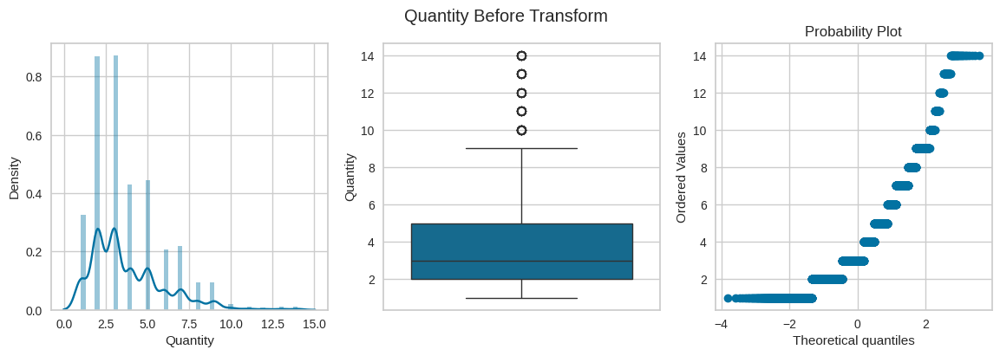

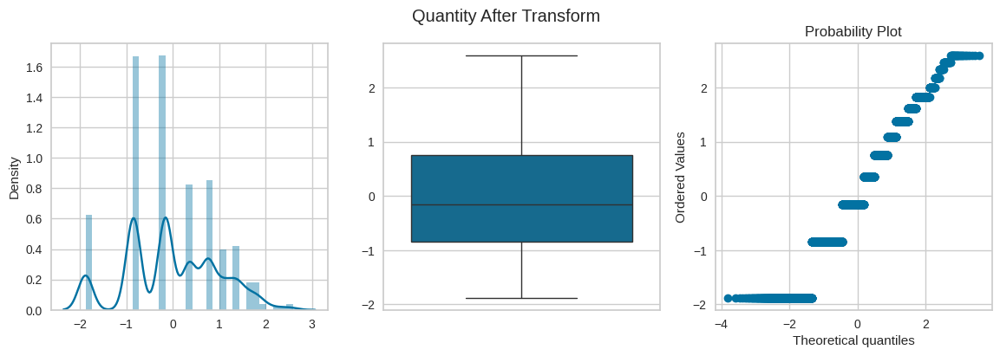

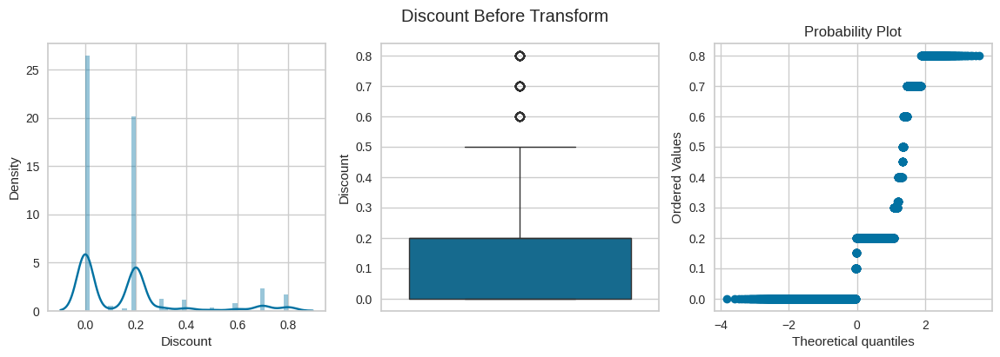

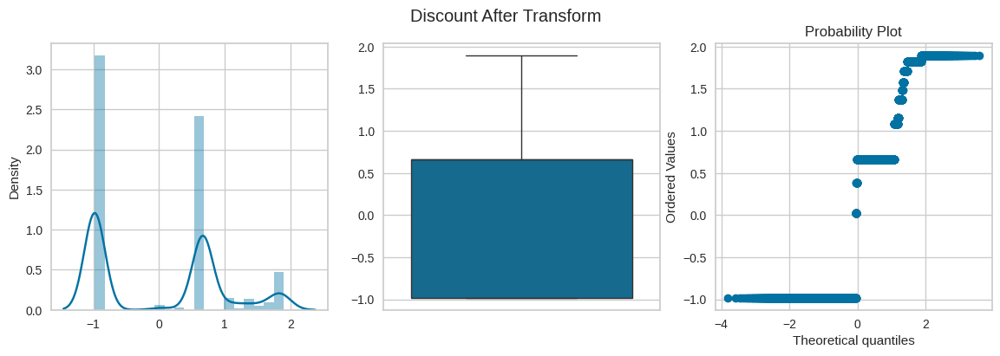

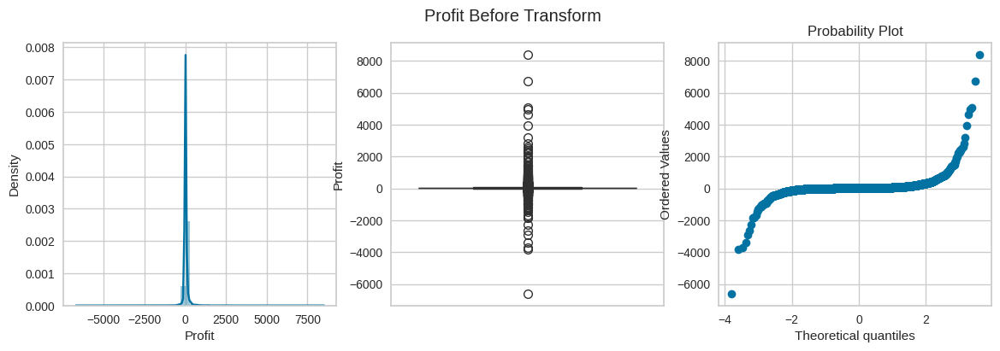

...

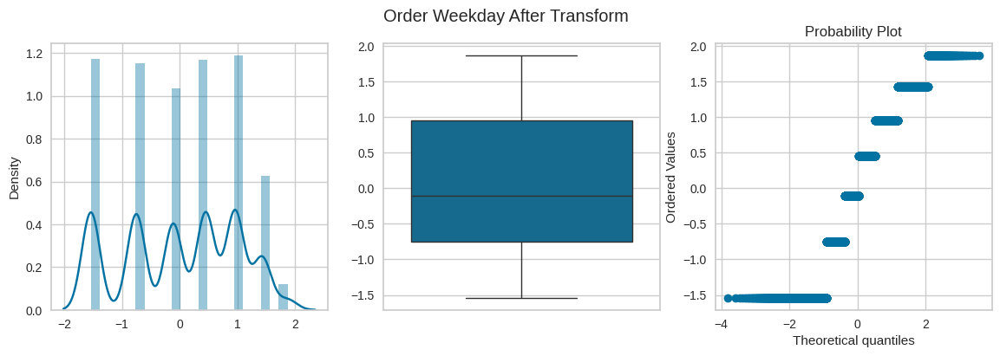

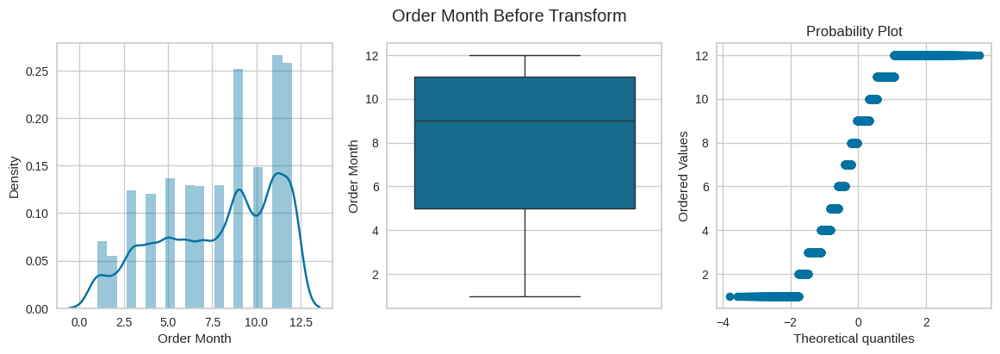

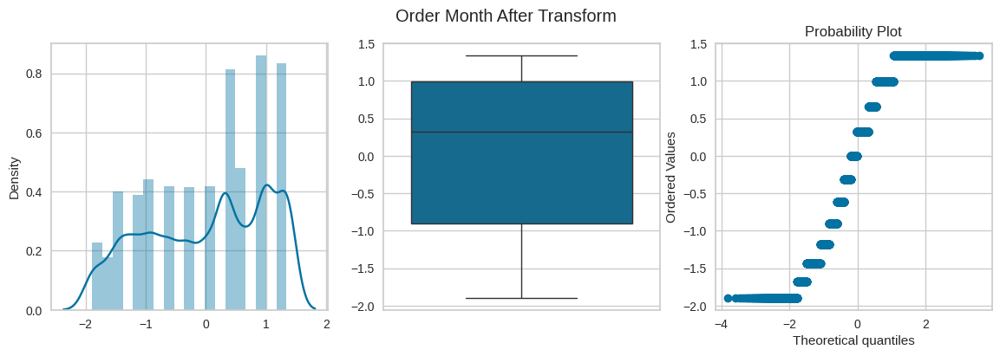

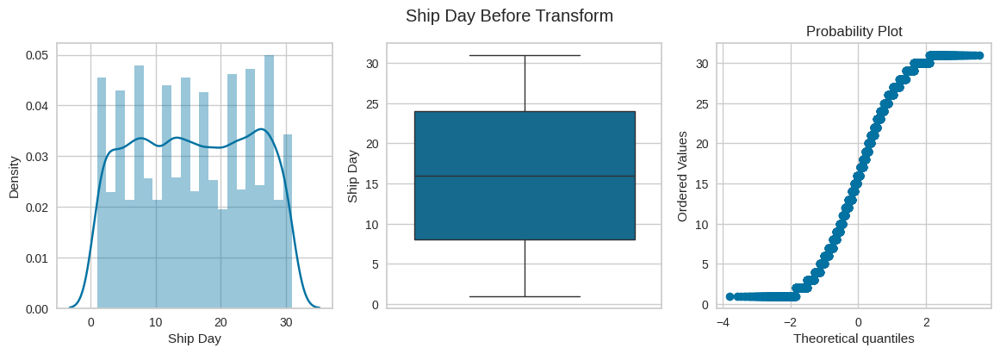

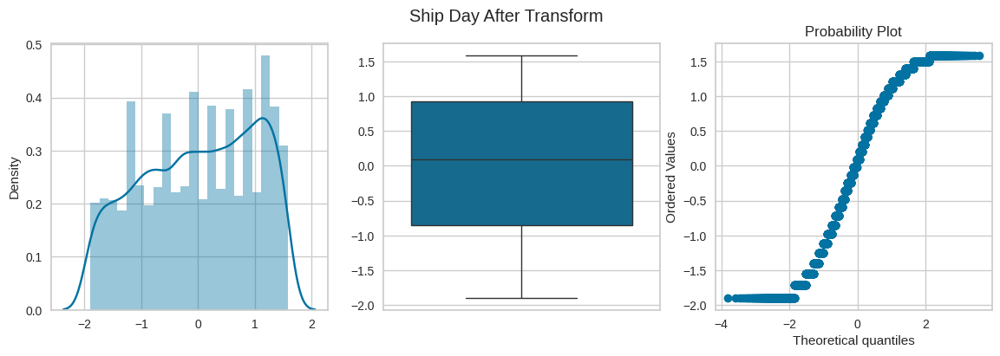

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,PowerTransformer())

Quantity: Log Transform <br>
Discount: Sqrt Transform <br>
Profit: Log Transform <br>
Profit Margin: Power Transform <br>
Discounted Profit: Log Transform <br>
Discount Percentage: Power Transform <br>
Operating Expenses: Power Transform <br>
Net Profit: Log Transform

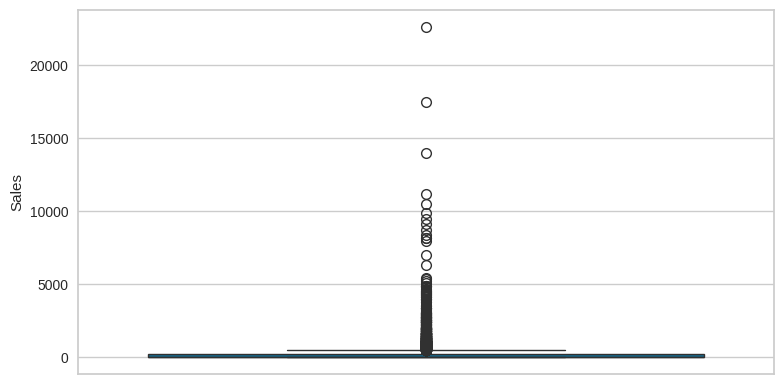

In [ ]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

In [ ]:
for idx in list(df[df['Sales'] > 10500].index):
    df.drop(idx,axis=0,inplace=True)

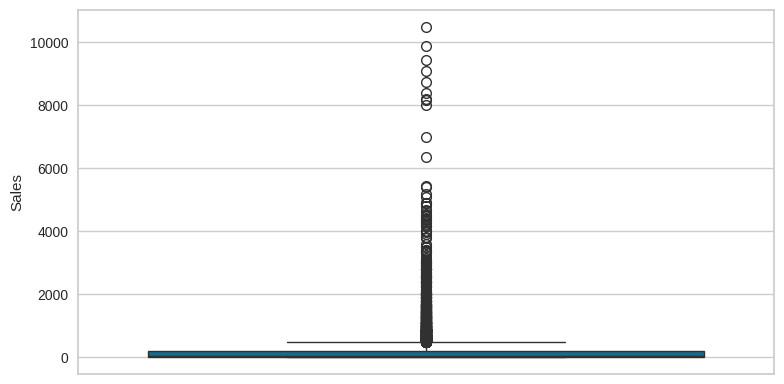

In [ ]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Splitting

In [ ]:
df.isnull().sum()

,0
Postal Code,1
Sales,1
Quantity,1
Discount,1
Profit,1
...,...
Product Name_Logitech 910-002974 M325 Wireless Mouse for Web Scrolling,0
"Product Name_Situations Contoured Folding Chairs, 4/Set",0
Product Name_Staples,0
Product Name_Storex Dura Pro Binders,0


In [ ]:
df = df.dropna()
df.shape

(9988, 67)

In [ ]:
X = df.drop('Sales',axis=1)
y = df['Sales']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Feature Selection

In [ ]:
X_train.shape, X_test.shape

((6991, 66), (2997, 66))

In [ ]:
pipeline = Pipeline(steps=[
    ('constant',DropConstantFeatures()),
    ('duplicate',DropDuplicateFeatures()),
    ('correlated',DropCorrelatedFeatures())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [ ]:
X_train.shape, X_test.shape

((6991, 55), (2997, 55))

In [ ]:
kbest = SelectKBest(k=10,score_func=f_regression)
kbest.fit(X_train,y_train)

SelectKBest(score_func=<function f_regression at 0x7f11b33e25c0>)

In [ ]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['Quantity', 'Discount', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Chairs', 'Sub-Category_Paper',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [ ]:
perc = SelectPercentile(percentile=20,score_func=f_regression)
perc.fit(X_train,y_train)

SelectPercentile(percentile=20,
                 score_func=<function f_regression at 0x7f11b33e25c0>)

In [ ]:
selected_features = perc.get_feature_names_out()
selected_features

array(['Quantity', 'Discount', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Binders',
       'Sub-Category_Chairs', 'Sub-Category_Paper',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [ ]:
ridge = SelectFromModel(estimator=Ridge(),max_features=10)
ridge.fit(X_train,y_train)

SelectFromModel(estimator=Ridge(), max_features=10)

In [ ]:
selected_features = ridge.get_feature_names_out()
selected_features

array(['Discount', 'State_Illinois', 'City_Philadelphia',
       'Category_Office Supplies', 'Category_Technology',
       'Sub-Category_Chairs', 'Sub-Category_Furnishings',
       "Product Name_Global Wood Trimmed Manager's Task Chair, Khaki",
       'Product Name_Logitech 910-002974 M325 Wireless Mouse for Web Scrolling',
       'Product Name_Situations Contoured Folding Chairs, 4/Set'],
      dtype=object)

In [ ]:
rf = SelectFromModel(estimator=RandomForestRegressor(),max_features=10)
rf.fit(X_train,y_train)

SelectFromModel(estimator=RandomForestRegressor(), max_features=10)

In [ ]:
selected_features = rf.get_feature_names_out()
selected_features

array(['Discounted Profit', 'Discount Percentage', 'Operating Expenses'],
      dtype=object)

In [ ]:
rfe = RFE(estimator=RandomForestRegressor(),n_features_to_select=10,step=5,verbose=1)
rfe.fit(X_train,y_train)

Fitting estimator with 55 features.
Fitting estimator with 50 features.
Fitting estimator with 45 features.
Fitting estimator with 40 features.
Fitting estimator with 35 features.
Fitting estimator with 30 features.
Fitting estimator with 25 features.
Fitting estimator with 20 features.
Fitting estimator with 15 features.


RFE(estimator=RandomForestRegressor(), n_features_to_select=10, step=5,
    verbose=1)

In [ ]:
selected_features = rfe.get_feature_names_out()
selected_features

array(['Postal Code', 'Discount', 'Discounted Profit',
       'Discount Percentage', 'Operating Expenses', 'Order Year',
       'Order Month', 'Order Day', 'Ship Day', 'Ship Weekday'],
      dtype=object)

In [ ]:
sfs = SequentialFeatureSelector(estimator=Ridge(),n_features_to_select=10,direction='backward')
sfs.fit(X_train,y_train)

SequentialFeatureSelector(direction='backward', estimator=Ridge(),
                          n_features_to_select=10)

In [ ]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['Discount', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'State_Michigan', 'State_infrequent_sklearn',
       'Category_Office Supplies', 'Category_Technology',
       'Sub-Category_Furnishings', 'Sub-Category_Phones'], dtype=object)

In [ ]:
xgb = XGBRegressor()
xgb.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
def plot_feature_importances(feat_imp_type: str):
    feat_imps = xgb.get_booster().get_score(importance_type=feat_imp_type)
    keys = list(feat_imps.keys())[:10]
    values = list(feat_imps.values())[:10]
    feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance", ascending=False).reset_index()
    feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
    plt.figure(figsize=(12,8))
    fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
    plt.title(f"{feat_imp_type.title()} Feature Importance")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect();

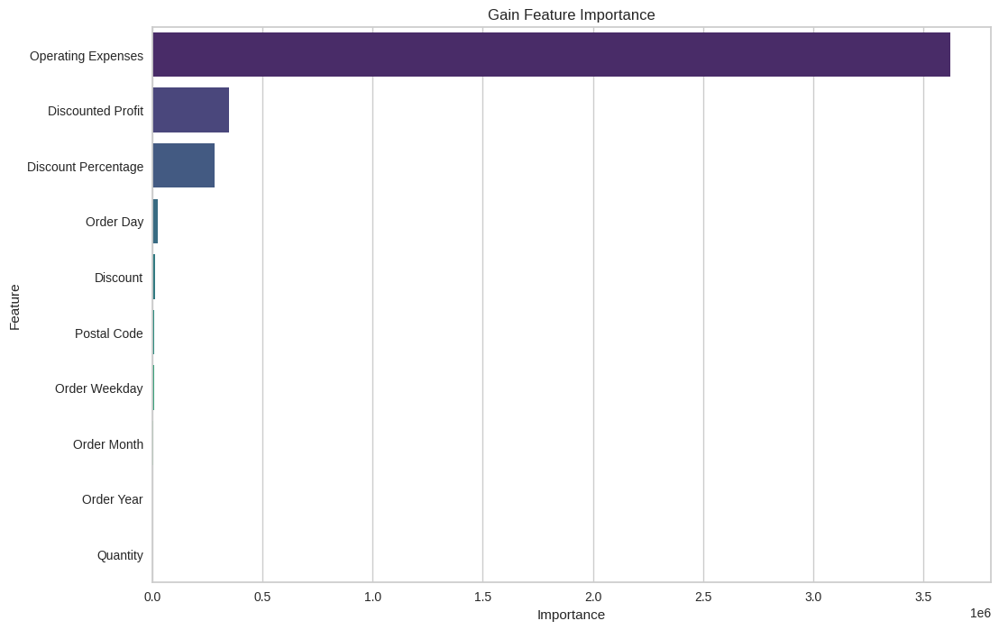

In [ ]:
plot_feature_importances('gain')

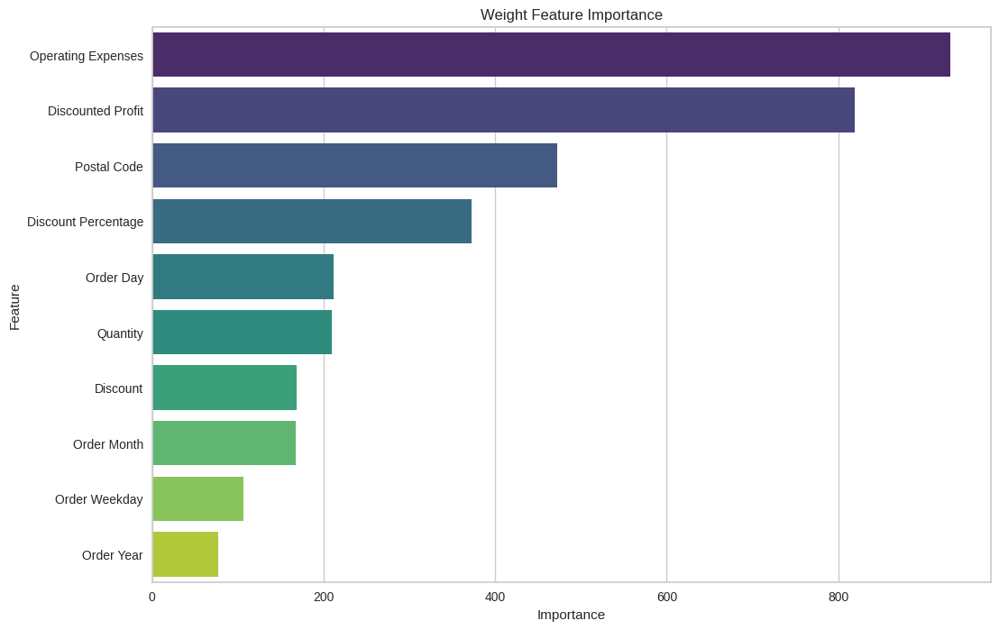

In [ ]:
plot_feature_importances('weight')

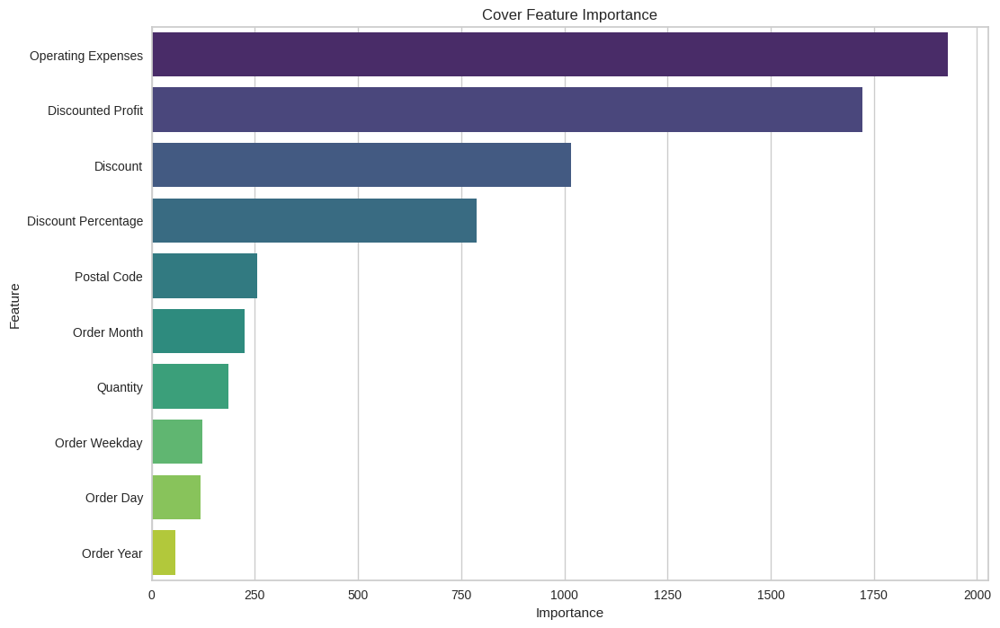

In [ ]:
plot_feature_importances('cover')

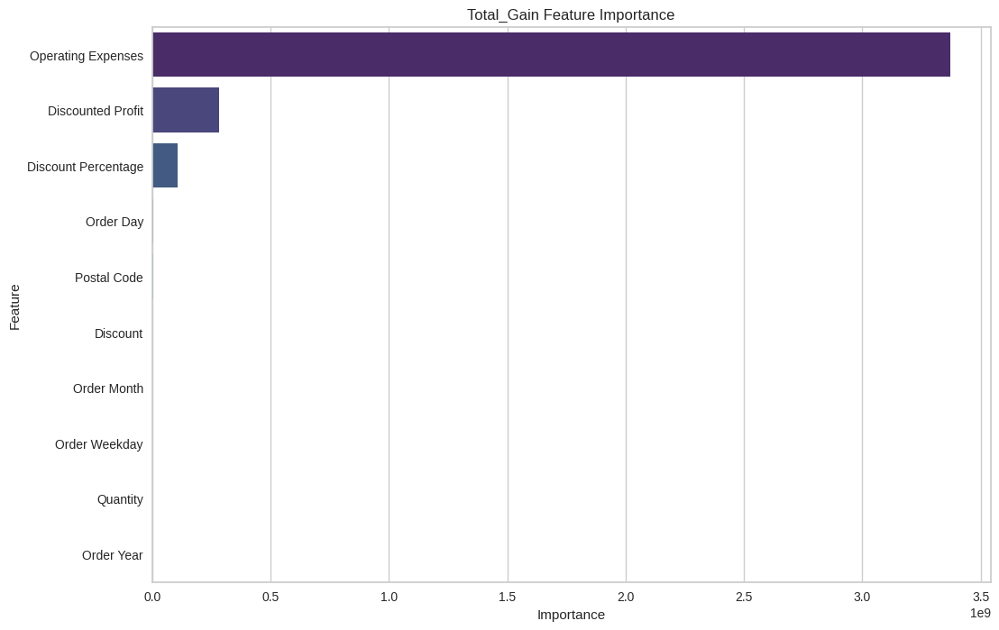

In [ ]:
plot_feature_importances('total_gain')

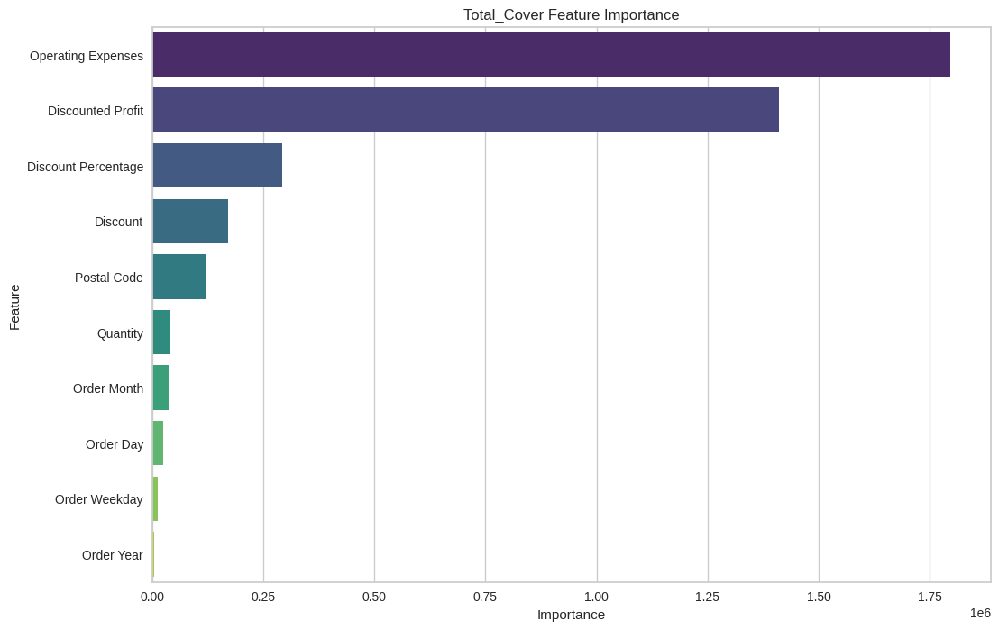

In [ ]:
plot_feature_importances('total_cover')

In [ ]:
final_selected_features = ['Discounted Profit',
                           'Discount Percentage',
                           'Postal Code',
                           'Discount',
                           'Order Day',
                           'Order Month',
                           'Quantity',
                           'Operating Expenses',
                           'Ship Day',
                           'Order Weekday']

final_X_train = X_train[final_selected_features]
final_X_test = X_test[final_selected_features]

In [ ]:
gc.collect()

4451

In [ ]:
final_X_train.head()

,Discounted Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
5579,-12.19600,0.081994,90004.0,0.2,10.0,9.0,5.0,259.1650,15.0,2.0
2728,56.69622,0.063496,43615.0,0.4,23.0,12.0,7.0,535.4643,25.0,1.0
477,5.74560,0.208855,90008.0,0.2,13.0,7.0,6.0,88.5780,20.0,5.0
1329,16.30200,0.000000,94109.0,0.0,24.0,5.0,3.0,20.7480,28.0,4.0
4544,13.36320,0.134698,60610.0,0.2,12.0,7.0,2.0,131.7760,17.0,3.0


In [ ]:
final_X_test.head()

,Discounted Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
1558,44.70960,0.000000,98103.0,0.0,16.0,3.0,2.0,127.2504,18.0,4.0
3059,-2.68048,0.820749,94110.0,0.2,20.0,10.0,2.0,27.7186,25.0,0.0
8234,0.33280,6.009615,32216.0,0.2,2.0,5.0,2.0,2.9120,7.0,4.0
5357,1.63600,0.000000,94122.0,0.0,5.0,8.0,1.0,14.7240,11.0,4.0
35,98.77896,0.018223,75080.0,0.2,9.0,12.0,7.0,974.0703,11.0,0.0


In [ ]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Discounted Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Discounted Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Discount Percentage',
                                  'Operating Expenses'])])

In [ ]:
final_X_train = transformer.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_test = transformer.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_train.head()

,Discounted Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.791759,NaN,0.447214,-0.324229,1.009995,90004.0,10.0,9.0,15.0,2.0
1,2.079442,4.055192,0.632456,-0.412458,1.378259,43615.0,23.0,12.0,25.0,1.0
2,1.945910,1.908890,0.447214,0.171010,0.414783,90008.0,13.0,7.0,20.0,5.0
3,1.386294,2.850822,0.000000,-0.755604,-0.483757,94109.0,24.0,5.0,28.0,4.0
4,1.098612,2.664669,0.447214,-0.097214,0.642144,60610.0,12.0,7.0,17.0,3.0


In [ ]:
final_X_test.head()

,Discounted Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.098612,3.822308,0.000000,-0.755604,0.622479,98103.0,16.0,3.0,18.0,4.0
1,1.098612,NaN,0.447214,1.246647,-0.296776,94110.0,20.0,10.0,25.0,0.0
2,1.098612,0.287282,0.447214,1.963591,-1.764067,32216.0,2.0,5.0,7.0,4.0
3,0.693147,0.969263,0.000000,-0.755604,-0.708771,94122.0,5.0,8.0,11.0,4.0
4,2.079442,4.602957,0.447214,-0.650184,1.662262,75080.0,9.0,12.0,11.0,0.0


### Missing Value Imputation

In [ ]:
final_X_train.isna().sum()

,0
Discounted Profit,0
Discount Percentage,1170
Postal Code,0
Discount,0
Order Day,0
Order Month,0
Quantity,0
Operating Expenses,0
Ship Day,0
Order Weekday,0


In [ ]:
final_X_test.isnull().sum()

,0
Discounted Profit,0
Discount Percentage,497
Postal Code,0
Discount,0
Order Day,0
Order Month,0
Quantity,0
Operating Expenses,0
Ship Day,0
Order Weekday,0


In [ ]:
imputer = SimpleImputer(strategy='median')
final_X_train['Discount Percentage'] = imputer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = imputer.fit_transform(final_X_test[['Discount Percentage']])

In [ ]:
for col in final_X_train.columns:
    imputer = SimpleImputer(strategy='median')
    final_X_train[col] = imputer.fit_transform(final_X_train[[col]])

In [ ]:
final_X_train.isna().sum()

,0
Discounted Profit,0
Discount Percentage,0
Postal Code,0
Discount,0
Order Day,0
Order Month,0
Quantity,0
Operating Expenses,0
Ship Day,0
Order Weekday,0


In [ ]:
final_X_test.isnull().sum()

,0
Discounted Profit,0
Discount Percentage,0
Postal Code,0
Discount,0
Order Day,0
Order Month,0
Quantity,0
Operating Expenses,0
Ship Day,0
Order Weekday,0


### Outlier Treatment

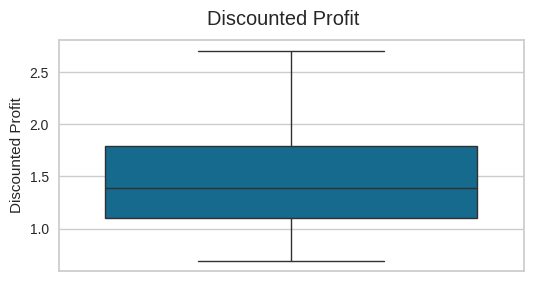

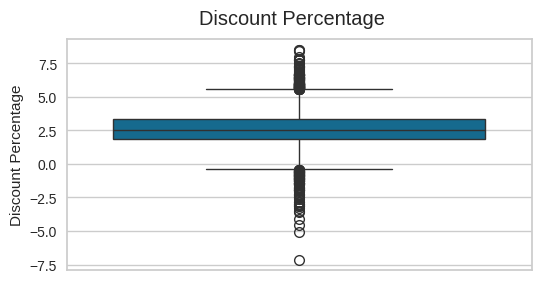

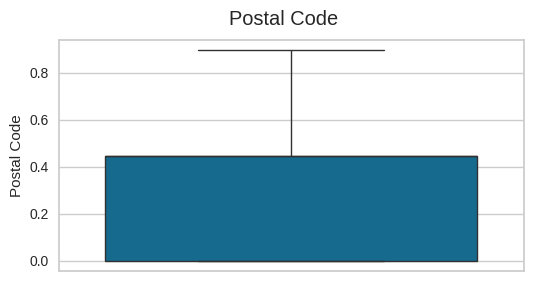

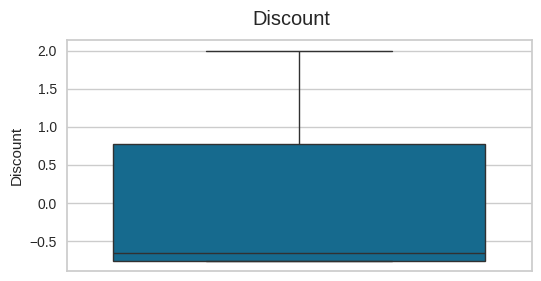

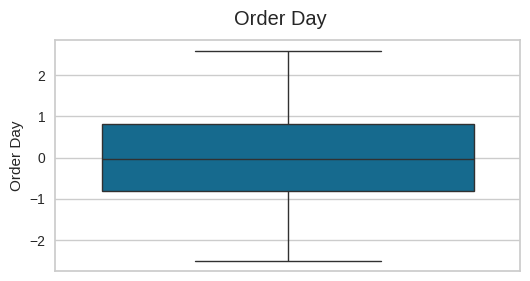

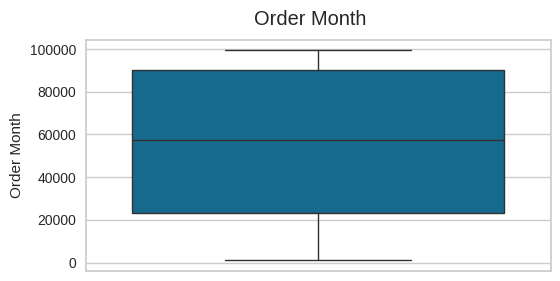

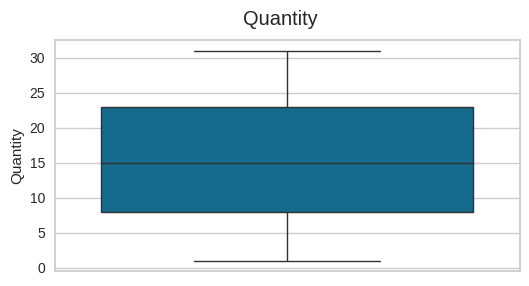

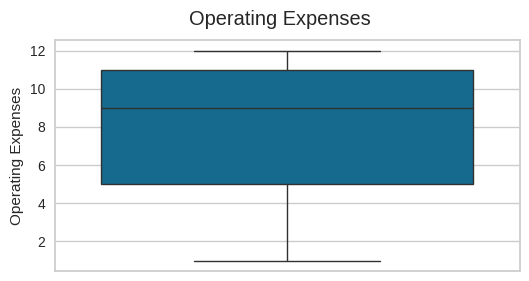

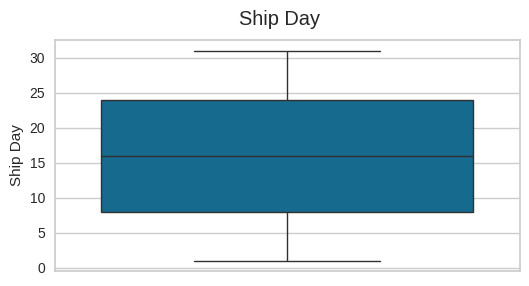

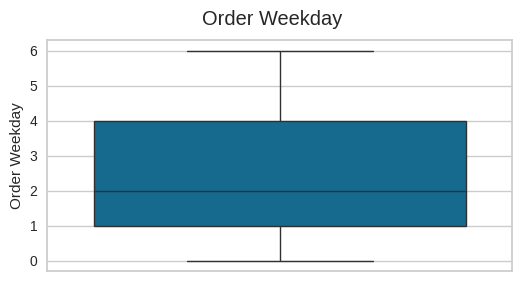

In [ ]:
for col in final_X_train.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_train[col])
    plt.suptitle(col)
    plt.show()

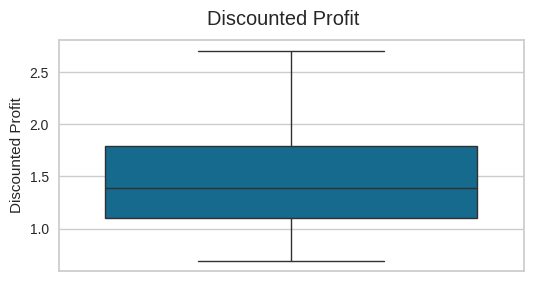

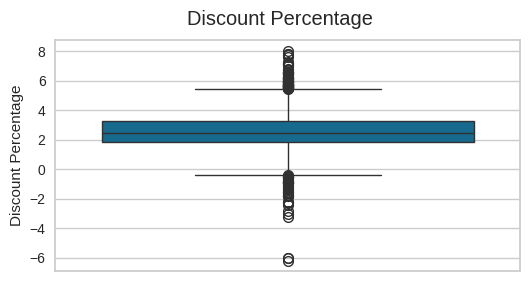

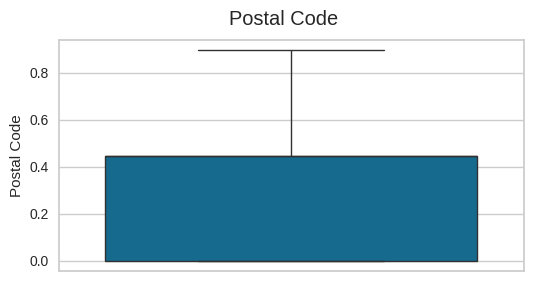

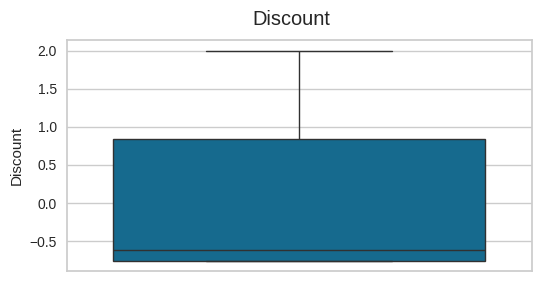

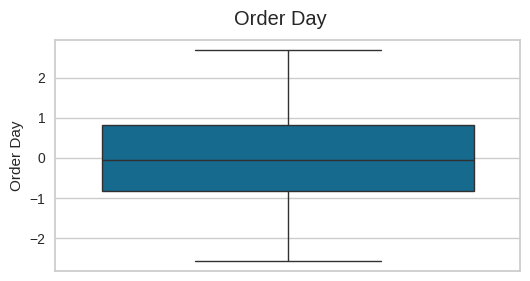

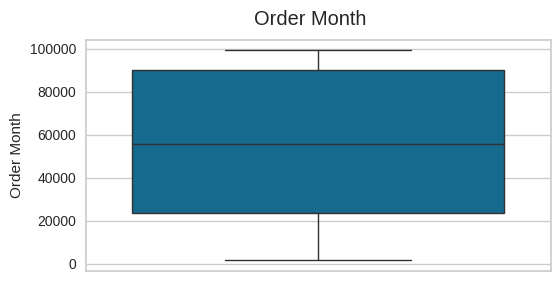

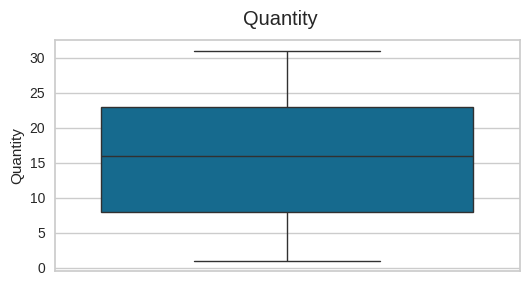

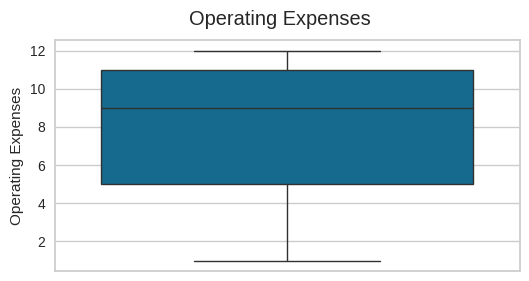

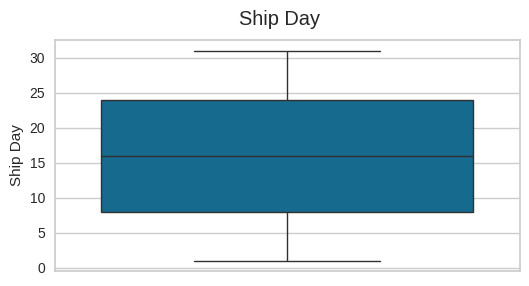

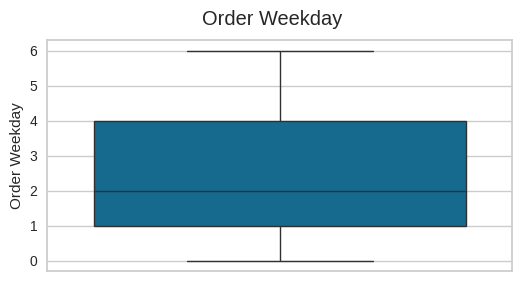

In [ ]:
for col in final_X_test.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_test[col])
    plt.suptitle(col)
    plt.show()

In [ ]:
def impute_outliers(data,col):
    winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
    fig = sns.boxplot(winsorizer.fit_transform(data[[col]]).values)
    plt.title(f"Box Plot of {col} after Outlier Removal")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect()

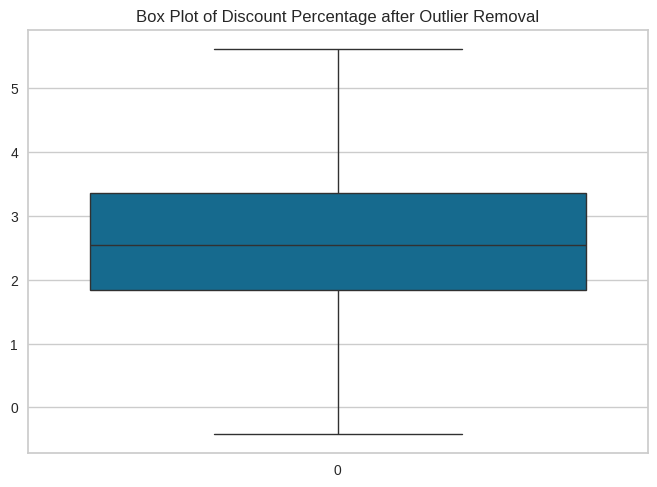

In [ ]:
impute_outliers(final_X_train,'Discount Percentage')

In [ ]:
winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
final_X_train['Discount Percentage'] = winsorizer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = winsorizer.transform(final_X_test[['Discount Percentage']])

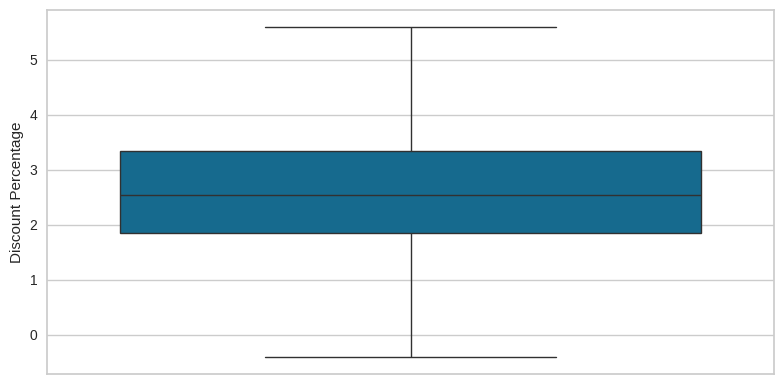

In [ ]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_train['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

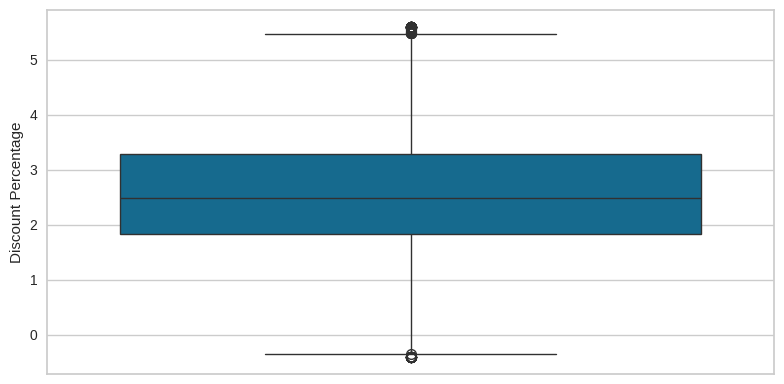

In [ ]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_test['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Scaling

In [ ]:
scaler = StandardScaler()
features = final_X_train.columns
final_X_train = scaler.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=features)
final_X_test = scaler.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=features)
final_X_train.head()

,Discounted Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,0.738777,-0.067066,0.620435,-0.324229,1.009995,1.083957,-0.650256,0.361982,-0.093987,-0.231513
1,1.398690,1.110730,1.271876,-0.412458,1.378259,-0.361693,0.840780,1.277878,1.043587,-0.823287
2,1.092383,-0.561217,0.620435,0.171010,0.414783,1.084082,-0.306171,-0.248614,0.474800,1.543812
3,-0.191318,0.172538,-0.952285,-0.755604,-0.483757,1.211884,0.955475,-0.859211,1.384859,0.952037
4,-0.851232,0.027527,0.620435,-0.097214,0.642144,0.167933,-0.420866,-0.248614,0.133528,0.360262


In [ ]:
final_X_test.head()

,Discounted Profit,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,-0.851232,0.929316,-0.952285,-0.755604,0.622479,1.336351,0.037914,-1.469808,0.247285,0.952037
1,-0.851232,-0.107906,0.620435,1.246647,-0.296776,1.211915,0.496695,0.667281,1.043587,-1.415062
2,-0.851232,-1.824433,0.620435,1.963591,-1.764067,-0.716927,-1.567816,-0.859211,-1.004046,0.952037
3,-1.781327,-1.293177,-0.952285,-0.755604,-0.708771,1.212289,-1.223731,0.056684,-0.549016,0.952037
4,1.398690,1.537433,0.620435,-0.650184,1.662262,0.618871,-0.764951,1.277878,-0.549016,-1.415062


In [ ]:
imputer = SimpleImputer(strategy='mean')
y_train = imputer.fit_transform(y_train.values.reshape(-1,1))
y_test = imputer.transform(y_test.values.reshape(-1,1))

## Model Training & Evaluation

In [ ]:
models = []
mae_scores = []
mse_scores = []
rmse_scores = []
mape_scores = []
r2_scores = []
training_times = []

In [ ]:
def train_and_evaluate_model(model):
    start_time = time.time()
    model.fit(final_X_train,y_train)
    duration = time.time() - start_time
    y_pred = model.predict(final_X_test)
    r2 = r2_score(y_test,y_pred)
    mae = mean_absolute_error(y_test,y_pred)
    mse = mean_squared_error(y_test,y_pred)
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    mape = mean_absolute_percentage_error(y_test,y_pred)
    print("Mean Absolute Error:",mae)
    print("Mean Squared Error:",mse)
    print("Root Mean Squared Error:",rmse)
    print("Mean Absolute Percentage Error:",mape)
    print("R2 Score:",r2)
    print("Training Time:",duration)
    training_times.append(duration)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mape_scores.append(mape)
    r2_scores.append(r2)
    models.append(model)

    try:
        prediction_error = PredictionError(estimator=model)
        prediction_error.score(final_X_test,y_test)
        prediction_error.show()
        res_plot = ResidualsPlot(estimator=model)
        res_plot.score(final_X_test,y_test)
        res_plot.show()
        del r2, mae, mape, rmse, duration, prediction_error, res_plot
    except Exception as e:
        pass

    gc.collect()

In [ ]:
def create_model_metrics(y_test, y_pred):
    y_test_ = np.ravel(y_test)
    y_pred_ = np.ravel(y_pred)

    return {
        'mae': mean_absolute_error(y_test_, y_pred_),
        'mse': mean_squared_error(y_test_, y_pred_),
        'rmse': np.sqrt(mean_squared_error(y_test_, y_pred_)),
        'mape': mean_absolute_percentage_error(y_test_, y_pred_),
        'r2': r2_score(y_test_, y_pred_)
    }

def setup_plot_style():
    plt.style.use('seaborn-v0_8')
    sns.set_context("notebook", font_scale=1.2)
    return sns.color_palette("viridis", n_colors=5)

def plot_prediction_scatter(model_name, y_test, y_pred, palette):
    y_test_ = np.ravel(y_test)
    y_pred_ = np.ravel(y_pred)

    fig = plt.figure(figsize=(10, 8), dpi=100)
    gs = fig.add_gridspec(1, 1)
    ax = fig.add_subplot(gs[0, 0])

    scatter = ax.scatter(y_test_, y_pred_, c=y_test_, cmap='viridis',
                        alpha=0.7, s=80, label='Predictions')

    min_max = [min(y_test_.min(), y_pred_.min()), max(y_test_.max(), y_pred_.max())]
    ax.plot(min_max, min_max, 'r--', lw=2, label='Perfect Prediction')

    m, b = np.polyfit(y_test_, y_pred_, 1)
    ax.plot(y_test_, m * y_test_ + b, color=palette[3], lw=2,
            label=f'Best Fit (R²={r2_score(y_test_, y_pred_):.2f})')

    ax.set_xlabel('True Values', fontsize=12)
    ax.set_ylabel('Predicted Values', fontsize=12)
    ax.set_title(f'{model_name}: True vs Predicted Values', fontsize=14, pad=15)
    ax.legend(frameon=True, fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)

    plt.colorbar(scatter, label='True Value Intensity')

    plt.tight_layout()
    return fig

def plot_residuals_distribution(model_name, residuals, palette):
    fig = plt.figure(figsize=(10, 8), dpi=100)
    gs = fig.add_gridspec(1, 1)
    ax = fig.add_subplot(gs[0, 0])

    sns.histplot(data=residuals, bins=30, kde=True, color=palette[2],
                 stat='density', alpha=0.6, ax=ax)

    ax.axvline(np.mean(residuals), color=palette[4], ls='--',
               label=f'Mean: {np.mean(residuals):.2f}')

    ax.set_title(f'{model_name}: Residuals Distribution', fontsize=14, pad=15)
    ax.set_xlabel('Residuals', fontsize=12)
    ax.set_ylabel('Density', fontsize=12)
    ax.legend(frameon=True, fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    return fig

def plot_residuals_timeseries(model_name, residuals, palette):
    fig = plt.figure(figsize=(10, 8), dpi=100)
    gs = fig.add_gridspec(1, 1)
    ax = fig.add_subplot(gs[0, 0])

    sns.lineplot(x=np.arange(len(residuals)), y=residuals,
                 color=palette[1], ax=ax, label='Residuals')

    rolling_std = pd.Series(residuals).rolling(window=50).std()
    ax.fill_between(np.arange(len(residuals)),
                    residuals - rolling_std,
                    residuals + rolling_std,
                    color=palette[1], alpha=0.2,
                    label='±1 STD')

    ax.axhline(0, color='gray', linestyle='--', alpha=0.8)

    ax.set_title(f'{model_name}: Residuals Over Samples', fontsize=14, pad=15)
    ax.set_xlabel('Sample Index', fontsize=12)
    ax.set_ylabel('Residual', fontsize=12)
    ax.legend(frameon=True, fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    return fig

def train_and_evaluate_model(model):
    global final_X_train, y_train, final_X_test, y_test
    global training_times, mae_scores, mse_scores, rmse_scores, mape_scores, r2_scores, models

    model_name = model.__class__.__name__
    print("="*60)
    print(f"Training model: {model_name}")
    print("="*60)

    try:
        start_time = time.time()
        model.fit(final_X_train, y_train)
        duration = time.time() - start_time

        y_pred = model.predict(final_X_test)

        metrics = create_model_metrics(y_test, y_pred)

        print(f"MAE:  {metrics['mae']:.4f}")
        print(f"MSE:  {metrics['mse']:.4f}")
        print(f"RMSE: {metrics['rmse']:.4f}")
        print(f"MAPE: {metrics['mape']:.4f}")
        print(f"R² Score: {metrics['r2']:.4f}")
        print(f"Training Time: {duration:.2f} sec")

        training_times.append(duration)
        mae_scores.append(metrics['mae'])
        mse_scores.append(metrics['mse'])
        rmse_scores.append(metrics['rmse'])
        mape_scores.append(metrics['mape'])
        r2_scores.append(metrics['r2'])
        models.append(model)

        palette = setup_plot_style()

        try:
            plt.close('all')
            pred_err = PredictionError(model)
            pred_err.score(final_X_test, y_test)
            pred_err.finalize()
            pred_err.show()
            plt.close(pred_err.figure)

            res_plot = ResidualsPlot(model)
            res_plot.score(final_X_test, y_test)
            res_plot.finalize()
            res_plot.show()
            plt.close(res_plot.figure)

            residuals = np.ravel(y_test) - np.ravel(y_pred)

            figs = [
                plot_prediction_scatter(model_name, y_test, y_pred, palette),
                plot_residuals_distribution(model_name, residuals, palette),
                plot_residuals_timeseries(model_name, residuals, palette)
            ]

            for fig in figs:
                plt.show()
                plt.close(fig)

            del pred_err, res_plot, residuals, figs

        except Exception as e:
            print(f"")

    except Exception as e:
        print(f"")
        return None

    finally:
        gc.collect()

Training model: LinearRegression
MAE:  214.3499
MSE:  167934.0184
RMSE: 409.7975
MAPE: 11.7708
R² Score: 0.3752
Training Time: 0.00 sec



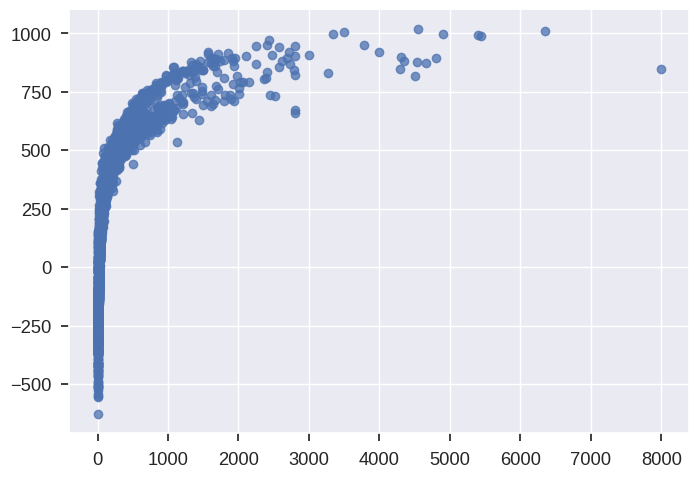

In [ ]:
train_and_evaluate_model(LinearRegression())

Training model: PassiveAggressiveRegressor
MAE:  157.2592
MSE:  207649.4997
RMSE: 455.6857
MAPE: 4.1202
R² Score: 0.2274
Training Time: 0.01 sec


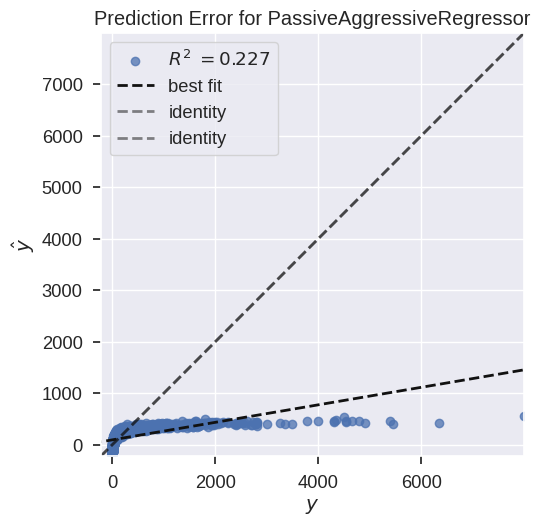

In [ ]:
train_and_evaluate_model(PassiveAggressiveRegressor())

Training model: SGDRegressor
MAE:  222.9532
MSE:  167932.6212
RMSE: 409.7958
MAPE: 12.2276
R² Score: 0.3752
Training Time: 0.02 sec


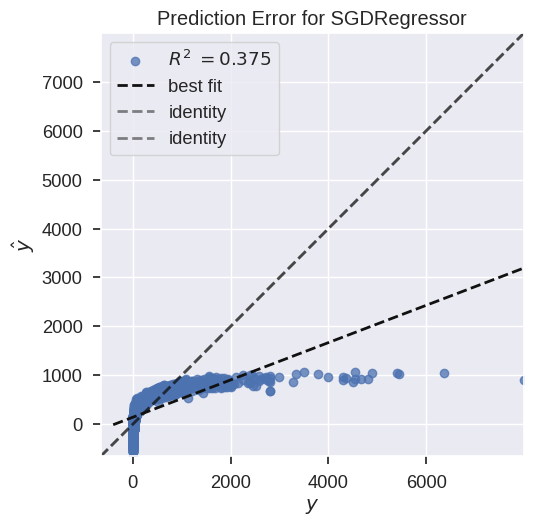

In [ ]:
train_and_evaluate_model(SGDRegressor())

Training model: Lasso
MAE:  214.3428
MSE:  167932.5663
RMSE: 409.7958
MAPE: 11.7694
R² Score: 0.3752
Training Time: 0.01 sec


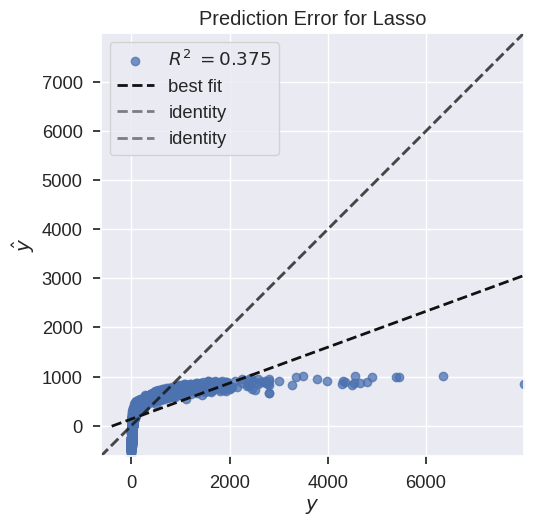

In [ ]:
train_and_evaluate_model(Lasso(alpha=0.01))

Training model: Ridge
MAE:  214.3499
MSE:  167934.0170
RMSE: 409.7975
MAPE: 11.7708
R² Score: 0.3752
Training Time: 0.00 sec


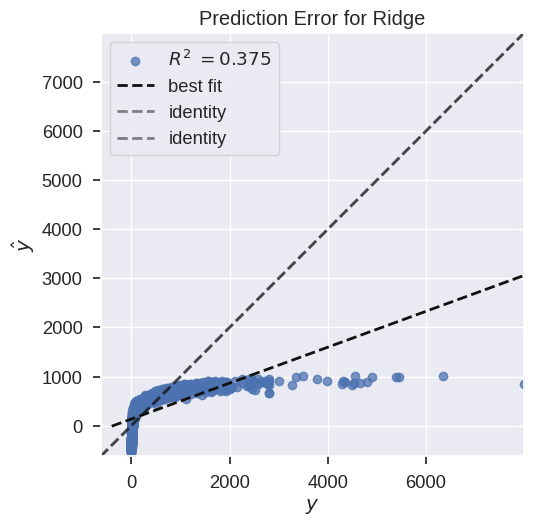

In [ ]:
train_and_evaluate_model(Ridge(alpha=0.001))

Training model: ElasticNet
MAE:  191.2028
MSE:  179676.3574
RMSE: 423.8825
MAPE: 7.1474
R² Score: 0.3315
Training Time: 0.00 sec


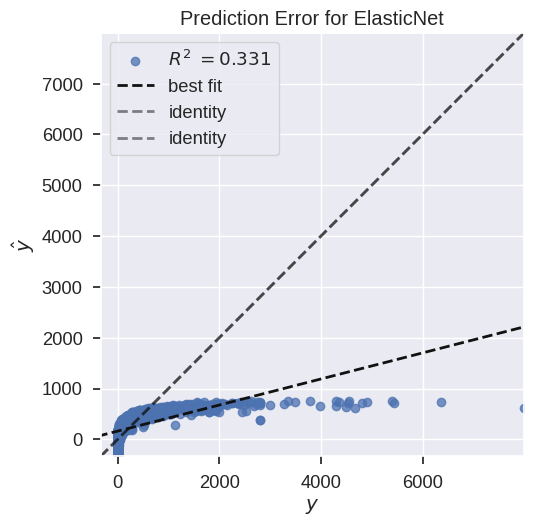

In [ ]:
train_and_evaluate_model(ElasticNet(l1_ratio=0.3))

In [ ]:
train_and_evaluate_model(PoissonRegressor())

Training model: PoissonRegressor
MAE:  36.4376
MSE:  20371.5828
RMSE: 142.7291
MAPE: 0.2782
R² Score: 0.9242
Training Time: 0.01 sec



In [ ]:
train_and_evaluate_model(TweedieRegressor())

Training model: TweedieRegressor
MAE:  189.3378
MSE:  184675.1505
RMSE: 429.7385
MAPE: 6.2064
R² Score: 0.3129
Training Time: 0.01 sec



Training model: TheilSenRegressor
MAE:  158.2876
MSE:  200775.9938
RMSE: 448.0803
MAPE: 5.4266
R² Score: 0.2530
Training Time: 1.81 sec


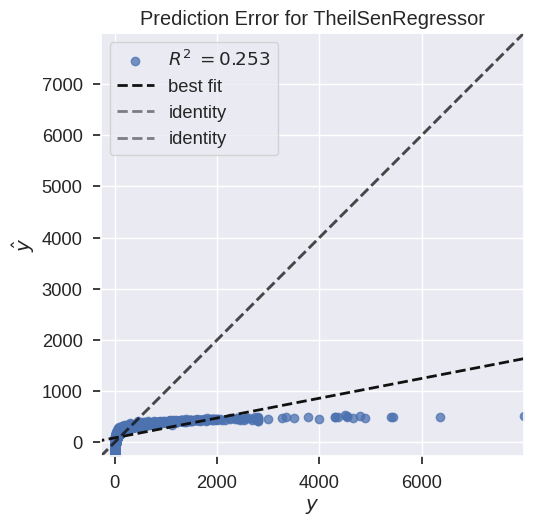

In [ ]:
train_and_evaluate_model(TheilSenRegressor())

In [ ]:
train_and_evaluate_model(GammaRegressor())

Training model: GammaRegressor
MAE:  122.4785
MSE:  171315.8392
RMSE: 413.9032
MAPE: 0.8188
R² Score: 0.3626
Training Time: 0.01 sec



Training model: HuberRegressor
MAE:  155.0433
MSE:  209908.9593
RMSE: 458.1582
MAPE: 3.9995
R² Score: 0.2190
Training Time: 0.03 sec


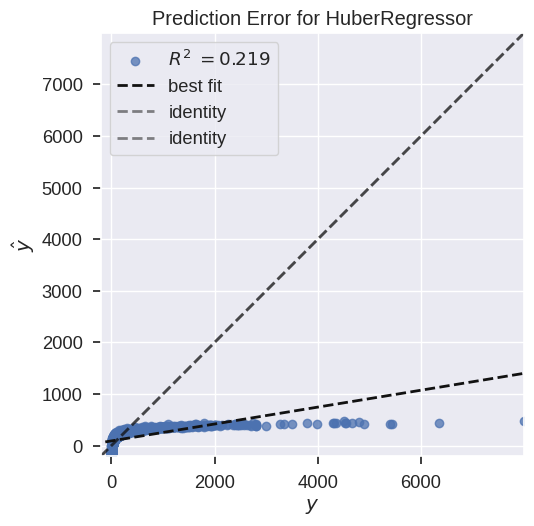

In [ ]:
train_and_evaluate_model(HuberRegressor())

Training model: BayesianRidge
MAE:  213.9846
MSE:  167913.9122
RMSE: 409.7730
MAPE: 11.7133
R² Score: 0.3752
Training Time: 0.01 sec


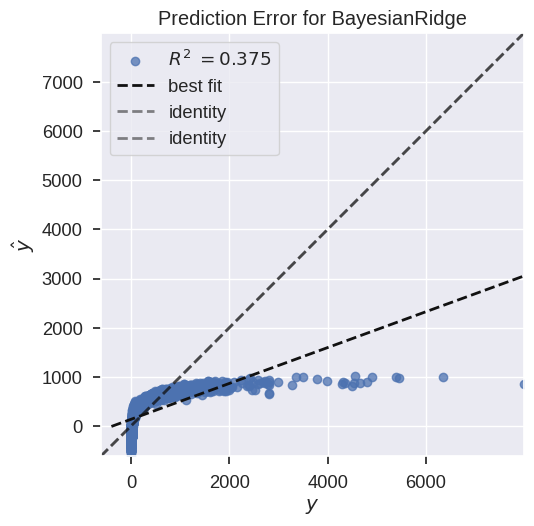

In [ ]:
train_and_evaluate_model(BayesianRidge())

Training model: ARDRegression
MAE:  214.0263
MSE:  167891.4223
RMSE: 409.7456
MAPE: 11.7140
R² Score: 0.3753
Training Time: 0.01 sec


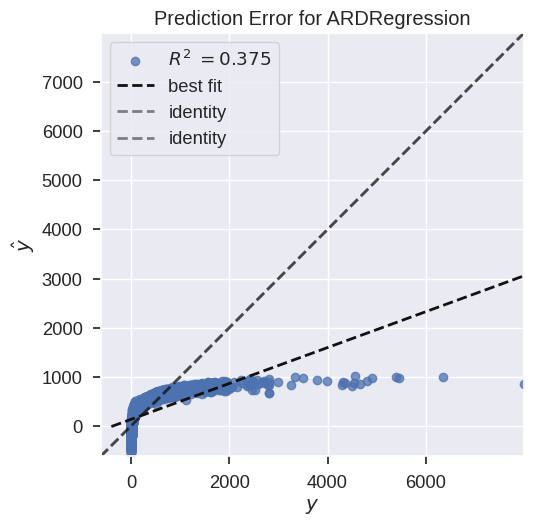

In [ ]:
train_and_evaluate_model(ARDRegression())

Training model: RANSACRegressor
MAE:  175.2976
MSE:  240529.7674
RMSE: 490.4383
MAPE: 3.6959
R² Score: 0.1050
Training Time: 0.12 sec



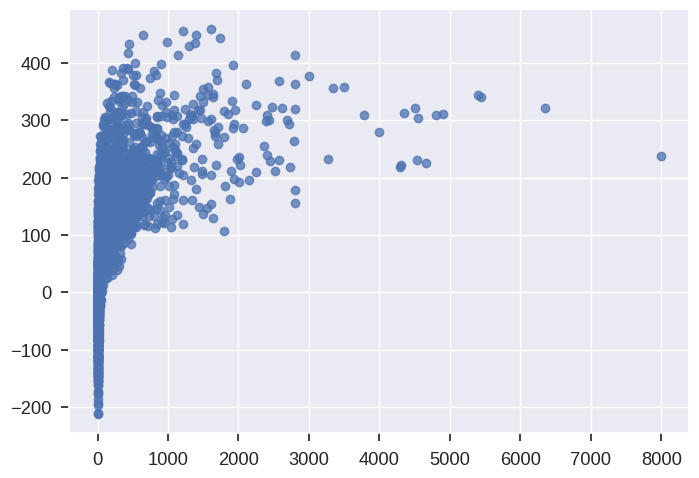

In [ ]:
train_and_evaluate_model(RANSACRegressor())

Training model: KNeighborsRegressor
MAE:  81.6638
MSE:  100322.3992
RMSE: 316.7371
MAPE: 0.2980
R² Score: 0.6267
Training Time: 0.01 sec



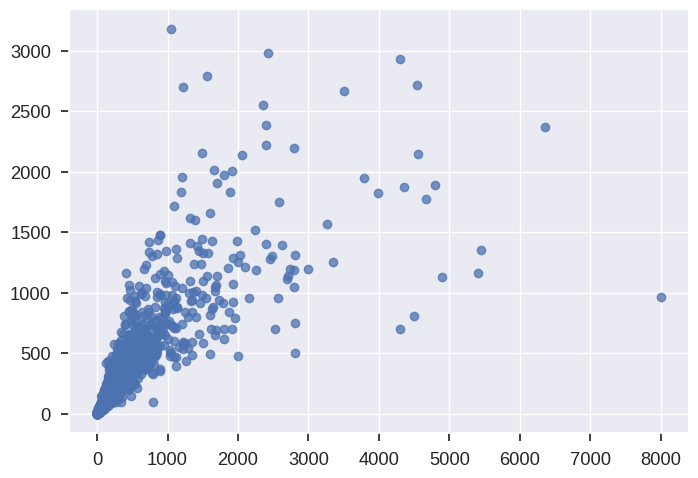

In [ ]:
train_and_evaluate_model(KNeighborsRegressor())

Training model: SVR
MAE:  139.9260
MSE:  233509.1014
RMSE: 483.2278
MAPE: 0.7224
R² Score: 0.1312
Training Time: 3.12 sec


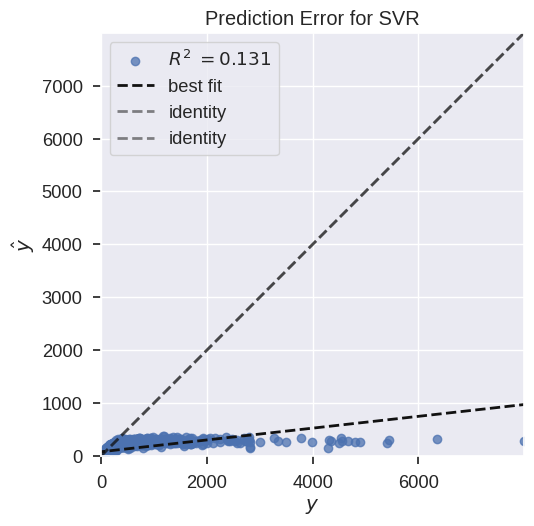

In [ ]:
train_and_evaluate_model(SVR())

Training model: LinearSVR
MAE:  153.9057
MSE:  221796.7508
RMSE: 470.9530
MAPE: 3.1729
R² Score: 0.1747
Training Time: 0.01 sec


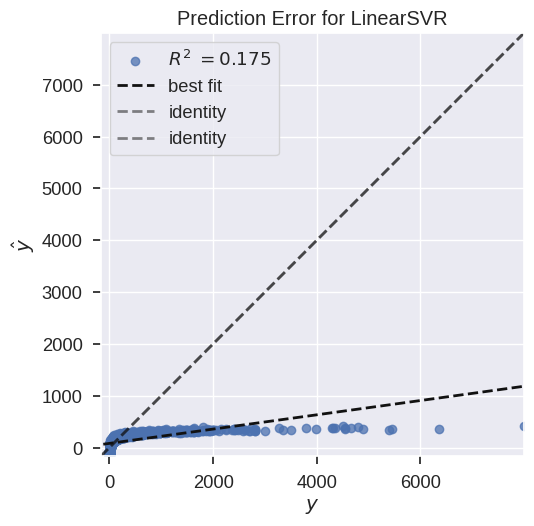

In [ ]:
train_and_evaluate_model(LinearSVR())

Training model: NuSVR
MAE:  142.9347
MSE:  229215.2696
RMSE: 478.7643
MAPE: 1.3400
R² Score: 0.1471
Training Time: 1.69 sec


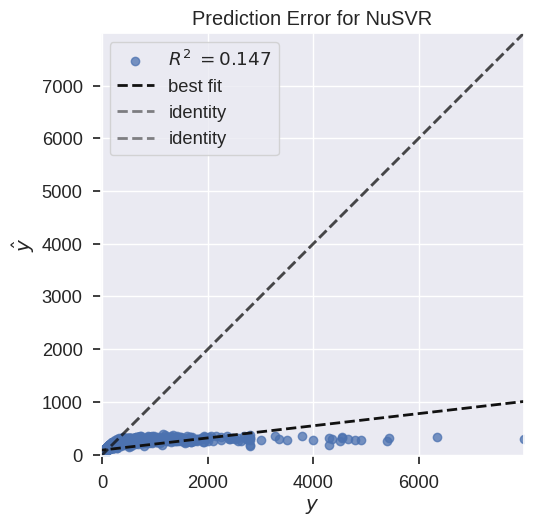

In [ ]:
train_and_evaluate_model(NuSVR())

Training model: DecisionTreeRegressor
MAE:  17.3459
MSE:  14199.2252
RMSE: 119.1605
MAPE: 0.0314
R² Score: 0.9472
Training Time: 0.07 sec


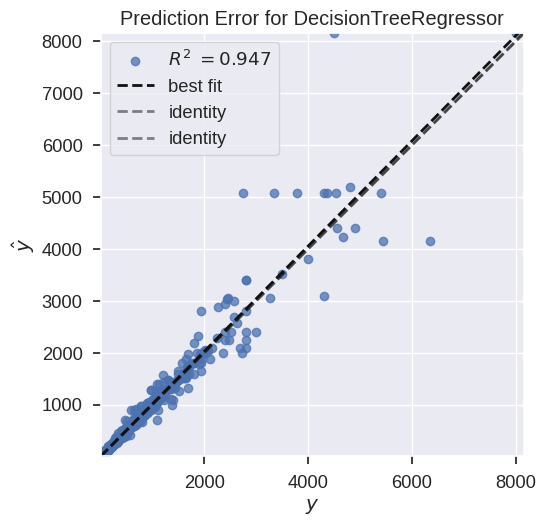

In [ ]:
train_and_evaluate_model(DecisionTreeRegressor())

Training model: ExtraTreesRegressor
MAE:  11.8094
MSE:  6221.4674
RMSE: 78.8763
MAPE: 0.0181
R² Score: 0.9769
Training Time: 2.13 sec


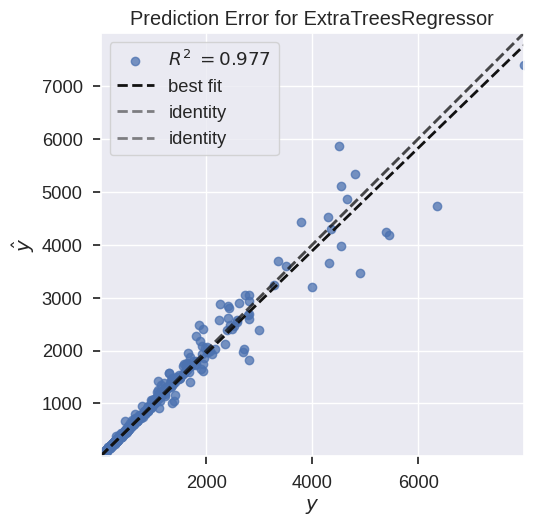

In [ ]:
train_and_evaluate_model(ExtraTreesRegressor())

Training model: AdaBoostRegressor
MAE:  437.5290
MSE:  226652.6094
RMSE: 476.0805
MAPE: 28.1558
R² Score: 0.1567
Training Time: 0.55 sec


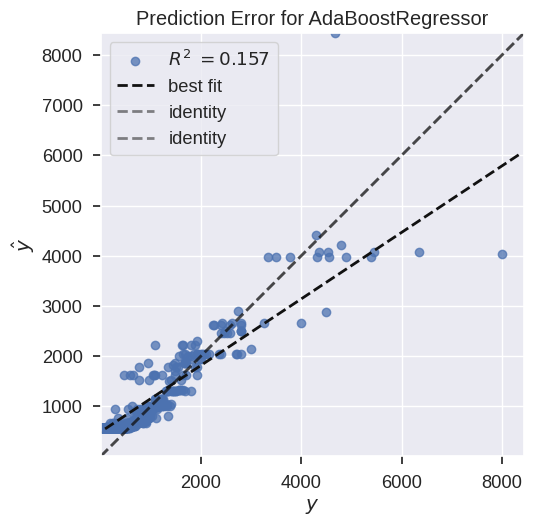

In [ ]:
train_and_evaluate_model(AdaBoostRegressor())

Training model: BaggingRegressor
MAE:  15.0115
MSE:  9256.3699
RMSE: 96.2100
MAPE: 0.0242
R² Score: 0.9656
Training Time: 0.41 sec


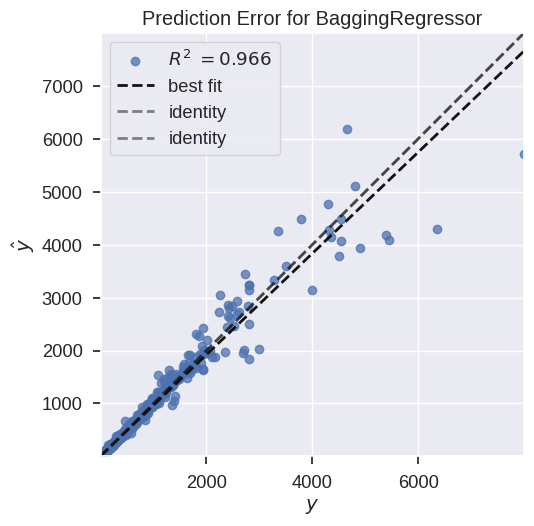

In [ ]:
train_and_evaluate_model(BaggingRegressor())

Training model: GradientBoostingRegressor
MAE:  20.1993
MSE:  12368.0671
RMSE: 111.2118
MAPE: 0.2028
R² Score: 0.9540
Training Time: 1.12 sec


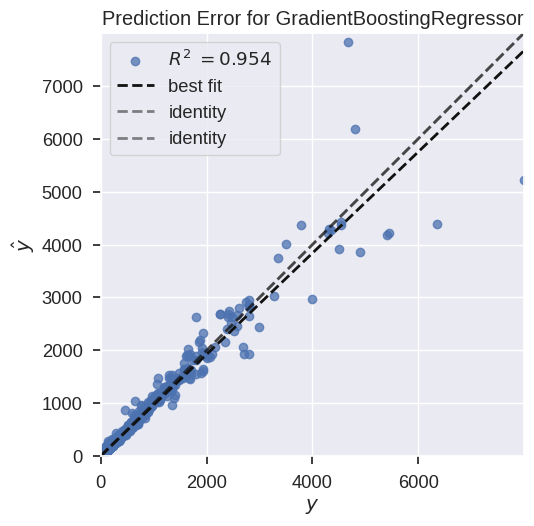

In [ ]:
train_and_evaluate_model(GradientBoostingRegressor())

Training model: HistGradientBoostingRegressor
MAE:  20.2091
MSE:  13523.7132
RMSE: 116.2915
MAPE: 0.0955
R² Score: 0.9497
Training Time: 0.21 sec


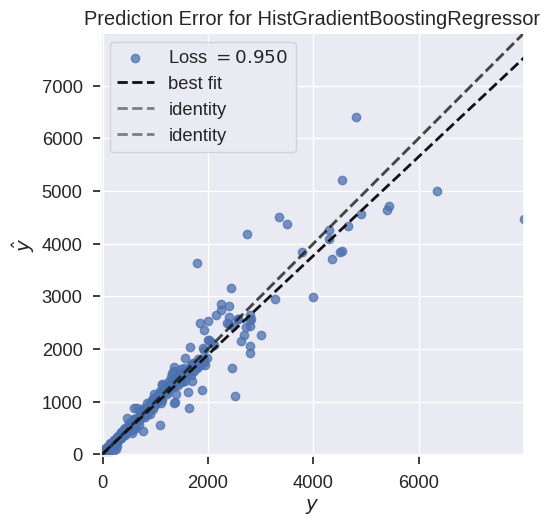

In [ ]:
train_and_evaluate_model(HistGradientBoostingRegressor())

Training model: RandomForestRegressor
MAE:  14.7412
MSE:  11244.5774
RMSE: 106.0405
MAPE: 0.0220
R² Score: 0.9582
Training Time: 3.98 sec


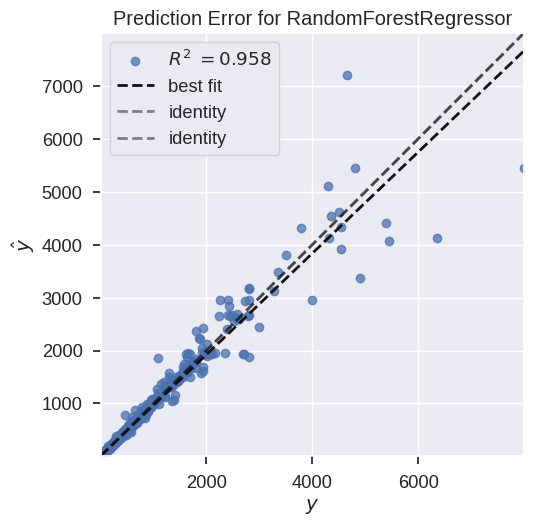

In [ ]:
train_and_evaluate_model(RandomForestRegressor())

Training model: XGBRegressor
MAE:  16.4572
MSE:  7588.8807
RMSE: 87.1142
MAPE: 0.0799
R² Score: 0.9718
Training Time: 0.14 sec


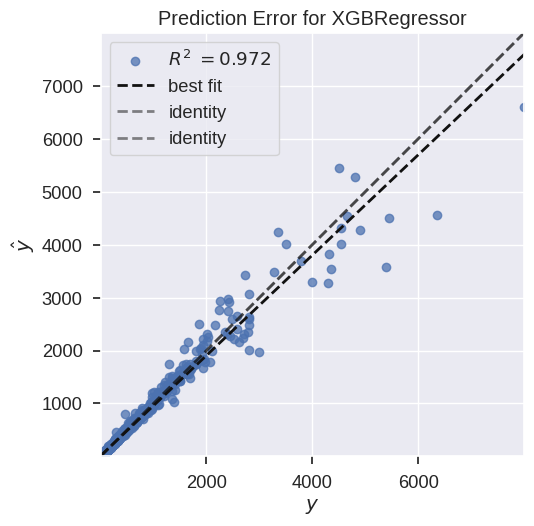

In [ ]:
train_and_evaluate_model(XGBRegressor())

In [ ]:
train_and_evaluate_model(CatBoostRegressor(silent=True))

Training model: CatBoostRegressor
MAE:  17.9171
MSE:  10881.9428
RMSE: 104.3166
MAPE: 0.1165
R² Score: 0.9595
Training Time: 2.48 sec



Training model: LGBMRegressor
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1129
[LightGBM] [Info] Number of data points in the train set: 6991, number of used features: 10
[LightGBM] [Info] Start training from score 221.910060
MAE:  19.4546
MSE:  12870.7193
RMSE: 113.4492
MAPE: 0.0925
R² Score: 0.9521
Training Time: 0.16 sec


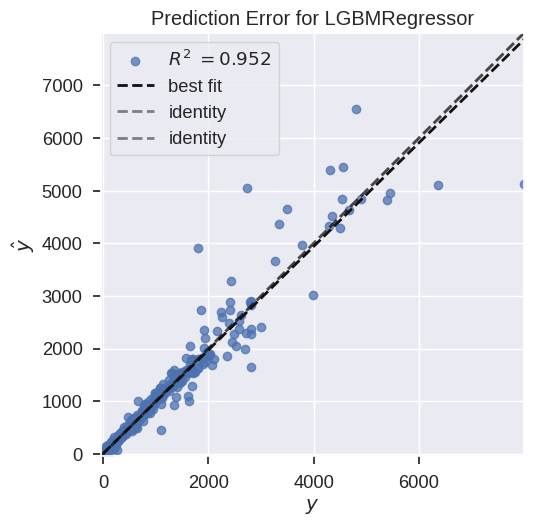

In [ ]:
train_and_evaluate_model(LGBMRegressor())

Training model: NGBRegressor
[iter 0] loss=7.6922 val_loss=0.0000 scale=1.0000 norm=255.5840
[iter 100] loss=6.3430 val_loss=0.0000 scale=2.0000 norm=92.0236
[iter 200] loss=5.3914 val_loss=0.0000 scale=2.0000 norm=36.7144
[iter 300] loss=4.4274 val_loss=0.0000 scale=4.0000 norm=58.2988
[iter 400] loss=3.7587 val_loss=0.0000 scale=2.0000 norm=25.1940
MAE:  19.6263
MSE:  12322.3893
RMSE: 111.0063
MAPE: 0.2121
R² Score: 0.9542
Training Time: 17.24 sec


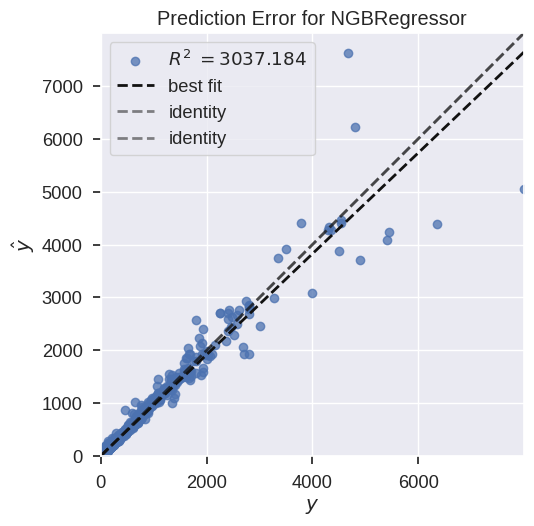

In [ ]:
train_and_evaluate_model(NGBRegressor())

Training model: XGBRFRegressor
MAE:  21.6012
MSE:  10976.6802
RMSE: 104.7697
MAPE: 0.3117
R² Score: 0.9592
Training Time: 0.18 sec


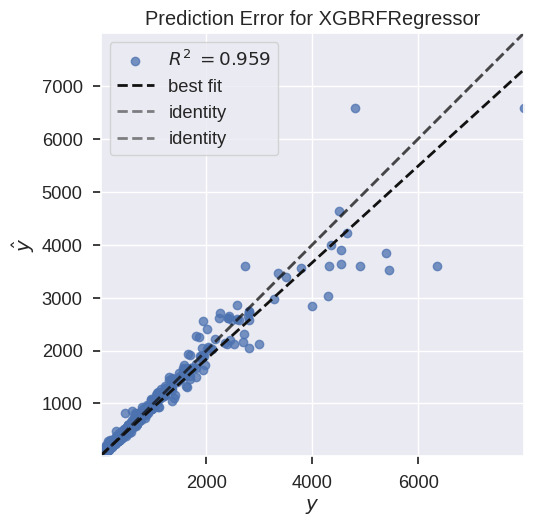

In [ ]:
train_and_evaluate_model(XGBRFRegressor())

Training model: MLPRegressor
MAE:  97.8085
MSE:  80194.5571
RMSE: 283.1864
MAPE: 1.2310
R² Score: 0.7016
Training Time: 3.32 sec


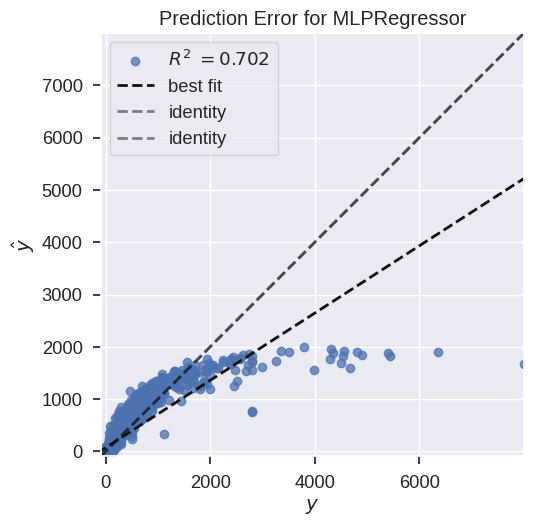

In [ ]:
train_and_evaluate_model(MLPRegressor())

## Baseline Models Performance Comparison

In [ ]:
model_perfs = pd.DataFrame({'Model': models,
                            'R2': r2_scores,
                            'MAE': mape_scores,
                            'MSE': mse_scores,
                            'RMSE': rmse_scores,
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs

,Model,R2,MAE,MSE,RMSE,Training Time
0,"(ExtraTreeRegressor(random_state=349988260), E...",0.976851,0.018062,6221.467397,78.876279,2.129777
1,"XGBRegressor(base_score=None, booster=None, ca...",0.971763,0.079927,7588.880716,87.114182,0.136654
2,(DecisionTreeRegressor(random_state=1132327192...,0.965559,0.024169,9256.369864,96.210030,0.413202
3,<catboost.core.CatBoostRegressor object at 0x7...,0.959510,0.116471,10881.942776,104.316551,2.479546
4,"XGBRFRegressor(base_score=None, booster=None, ...",0.959158,0.311675,10976.680154,104.769653,0.177009
5,"(DecisionTreeRegressor(max_features=1.0, rando...",0.958161,0.021988,11244.577373,106.040452,3.979338
6,NGBRegressor(random_state=RandomState(MT19937)...,0.954151,0.212093,12322.389284,111.006258,17.239147
7,([DecisionTreeRegressor(criterion='friedman_ms...,0.953981,0.202753,12368.067062,111.211812,1.120681
8,LGBMRegressor(),0.952111,0.092451,12870.719268,113.449192,0.158377
9,HistGradientBoostingRegressor(),0.949681,0.095475,13523.713249,116.291501,0.211045


The Extra Trees Regressor is the best performing model which achieved an incredible r2 score of more than 97% on the test set. It's closely followed by the Decision Trees Regressor model which produced an amazing r2 score of approximately 96.2%.

## Cross Validation & Hyperparameter Tuning

In [ ]:
print(f"Mean cross validation training R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_train,y_train,cv=5,scoring='r2',verbose=0))*100,2)}%")

Mean cross validation training R2 score of Extra Trees Regressor: 96.4%


In [ ]:
print(f"Mean cross validation test R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_test,y_test,cv=5,scoring='r2',verbose=0))*100,2)}%")

Mean cross validation test R2 score of Extra Trees Regressor: 95.71%


The cross validation R2 score of the Extra Trees Regressor model on the test set is comparable to the training cross validation R2 score so there seems to be no overfitting.

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=brute, metric=euclidean, n_neighbors=8, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=brute, metric=euclidean, n_neighbors=8, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=brute, metric=euclidean, n_neighbors=8, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=brute, metric=euclidean, n_neighbors=8, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=brute, metric=euclidean, n_neighbors=8, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=brute, metric=manhattan, n_neighbors=8, p=1, weights=distance; total time=   0.2s
[CV] END algorithm=brute, metric=manhattan, n_neighbors=8, p=1, weights=distance; total time=   0.2s
[CV] END algorithm=brute, metric=manhattan, n_neighbors=8, p=1, weights=distance; total time=   0.2s
[CV] END algorithm=brute, metric=manhattan, n_neighbors=8, p=1, weights=distance; total time=   

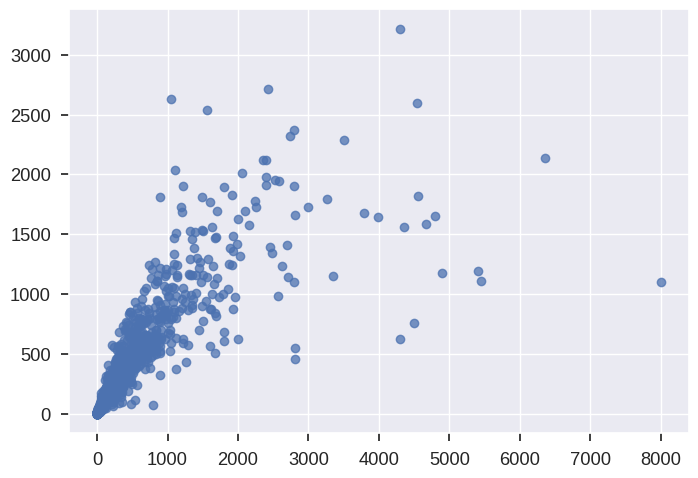

In [ ]:
param_grid = {'n_neighbors': [2,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'brute', 'kd_tree'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev'],
              'p': [1,2]
             }

grid_knn = RandomizedSearchCV(KNeighborsRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_knn)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=squared_error, max_bins=150; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=squared_error, max_bins=150; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=squared_error, max_bins=150; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=squared_error, max_bins=150; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=squared_error, max_bins=150; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=squared_error, max_bins=100; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=squared_error, max_bins=100; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate=1.0, loss=squared_error, max_bins=100; total time=   0.2s
[CV] END interaction_cst=pairwise, learning_rate

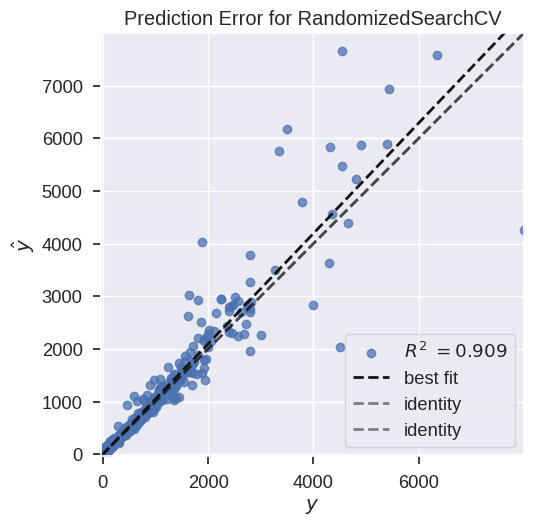

In [ ]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.8,1.0],
              'loss': ['squared_error','absolute_error','poisson','quantile'],
              'max_bins': np.arange(0,255,50),
              'interaction_cst': ['pairwise','no_interaction']}

grid_hgb = RandomizedSearchCV(HistGradientBoostingRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_hgb)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
MAE:  213.1837
MSE:  167924.0599
RMSE: 409.7854
MAPE: 11.6836
R² Score: 0.3752
Training Time: 10.73 sec


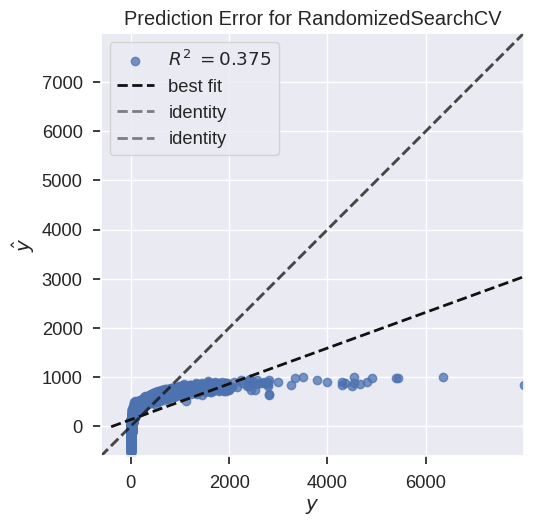

In [ ]:
param_grid = {'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
             'C': [0.0001,0.001,0.01,0.1,1],
             'epsilon': np.linspace(0.001,1,5)}

grid_lsvr = RandomizedSearchCV(LinearSVR(),param_grid,cv=5,verbose=2,n_jobs=10)
train_and_evaluate_model(grid_lsvr)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.0s
[CV] END criterion=poisson, max_features=log2, splitter=random; total time=   0.0s
[CV] END criterion=absolute_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=absolute_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=absolute_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=absolute_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=absolute_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=friedman_mse, max_features=aut

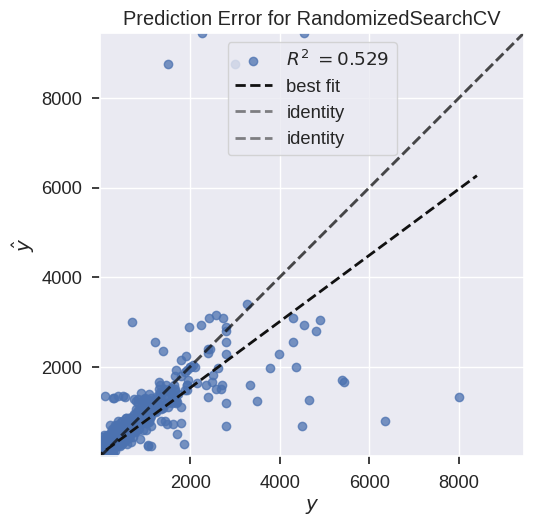

In [ ]:
param_grid = {'criterion': ['squared_error','friedman_mse','absolute_error','poisson'],
              'splitter': ['best','random'],
              'max_features': ['auto','sqrt','log2']
             }

grid_dt = RandomizedSearchCV(DecisionTreeRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_dt)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=friedman_mse, learning_rate=0.7, loss=huber, max_features=log2, n_estimators=700;, score=0.942 total time=   4.7s
[CV 2/5] END criterion=friedman_mse, learning_rate=0.7, loss=huber, max_features=log2, n_estimators=700;, score=0.895 total time=   4.4s
[CV 3/5] END criterion=friedman_mse, learning_rate=0.7, loss=huber, max_features=log2, n_estimators=700;, score=0.950 total time=   5.0s
[CV 4/5] END criterion=friedman_mse, learning_rate=0.7, loss=huber, max_features=log2, n_estimators=700;, score=0.914 total time=   4.4s
[CV 5/5] END criterion=friedman_mse, learning_rate=0.7, loss=huber, max_features=log2, n_estimators=700;, score=0.925 total time=   5.1s
[CV 1/5] END criterion=friedman_mse, learning_rate=0.4, loss=squared_error, max_features=log2, n_estimators=100;, score=0.945 total time=   0.5s
[CV 2/5] END criterion=friedman_mse, learning_rate=0.4, loss=squared_error

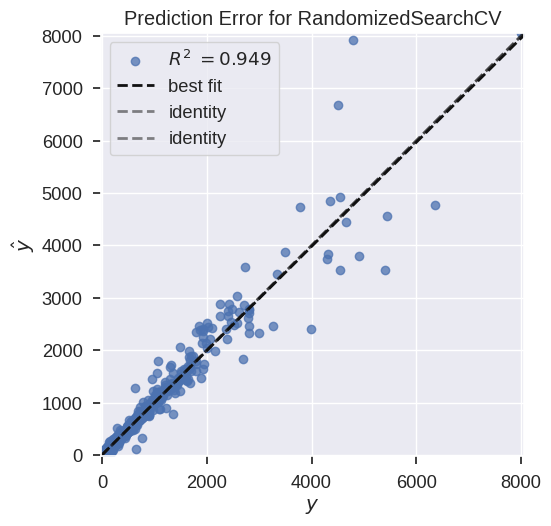

In [ ]:
param_grid =  {'loss': ['squared_error','absolute_error','huber','quantile'],
                'n_estimators': [100,400,700,1000],
                'learning_rate': [0.2,0.4,0.7,1],
                'criterion': ['friedman_mse','squared_error'],
                'max_features': ['auto','sqrt','log2']
                }

grid_gb = RandomizedSearchCV(GradientBoostingRegressor(),param_grid,verbose=4,cv=5)
train_and_evaluate_model(grid_gb)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.4, n_estimators=100;, score=0.938 total time=   0.2s
[CV 2/5] END learning_rate=0.4, n_estimators=100;, score=0.891 total time=   0.2s
[CV 3/5] END learning_rate=0.4, n_estimators=100;, score=0.906 total time=   0.2s
[CV 4/5] END learning_rate=0.4, n_estimators=100;, score=0.915 total time=   0.2s
[CV 5/5] END learning_rate=0.4, n_estimators=100;, score=0.968 total time=   0.2s
[CV 1/5] END learning_rate=0.4, n_estimators=1000;, score=0.938 total time=   1.9s
[CV 2/5] END learning_rate=0.4, n_estimators=1000;, score=0.892 total time=   3.6s
[CV 3/5] END learning_rate=0.4, n_estimators=1000;, score=0.906 total time=   1.9s
[CV 4/5] END learning_rate=0.4, n_estimators=1000;, score=0.914 total time=   1.9s
[CV 5/5] END learning_rate=0.4, n_estimators=1000;, score=0.968 total time=   1.9s
[CV 1/5] END learning_rate=0.7, n_estimators=700;, score=0.896 total time=   1.

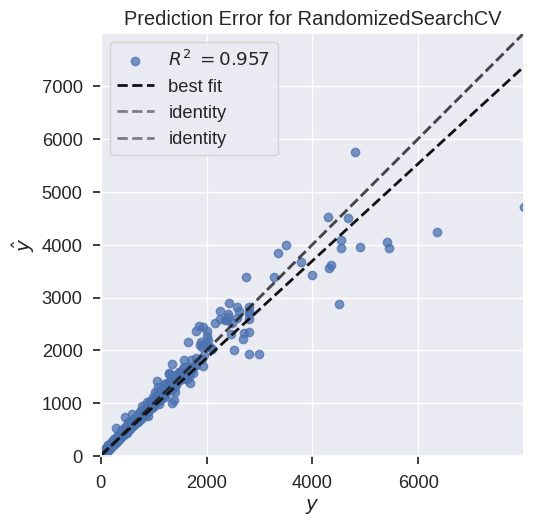

In [ ]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.7,1],
'n_estimators': [100,400,700,800,1000]
}

grid_cat = RandomizedSearchCV(CatBoostRegressor(silent=True),param_grid,verbose=5,cv=5)
train_and_evaluate_model(grid_cat)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there ar

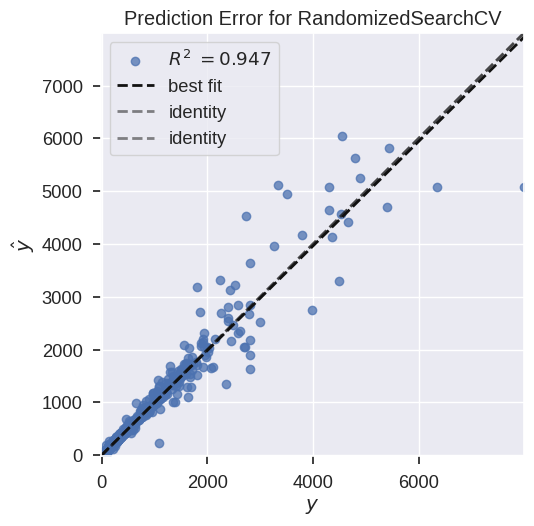

In [ ]:
param_grid = {'boosting_type': ['gbdt','dart','goss','rf'],
            'learning_rate': np.linspace(0,1,6)[1:],
            'n_estimators': [100,300,500,800,1000],
            'importance_type': ['split','gain'],
            'min_split_gain': [0.68,0.79,0.87,1]}

grid_lgbm = RandomizedSearchCV(LGBMRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_lgbm)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END booster=gbtree, grow_policy=0, importance_type=weight, learning_rate=0.7, n_estimators=100, sampling_method=uniform;, score=nan total time=   0.1s
[CV 2/5] END booster=gbtree, grow_policy=0, importance_type=weight, learning_rate=0.7, n_estimators=100, sampling_method=uniform;, score=nan total time=   0.2s
[CV 3/5] END booster=gbtree, grow_policy=0, importance_type=weight, learning_rate=0.7, n_estimators=100, sampling_method=uniform;, score=nan total time=   0.2s
[CV 4/5] END booster=gbtree, grow_policy=0, importance_type=weight, learning_rate=0.7, n_estimators=100, sampling_method=uniform;, score=nan total time=   0.3s
[CV 5/5] END booster=gbtree, grow_policy=0, importance_type=weight, learning_rate=0.7, n_estimators=100, sampling_method=uniform;, score=nan total time=   0.2s
[CV 1/5] END booster=dart, grow_policy=1, importance_type=total_cover, learning_rate=0.1, n_estimators=1

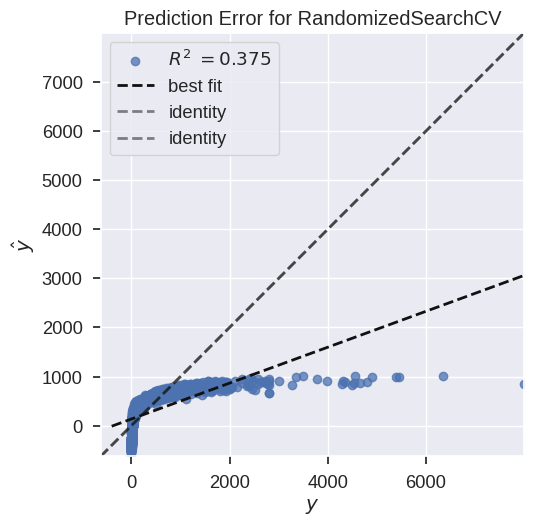

In [ ]:
param_grid = {'n_estimators': [100,400,700,1000],
        'grow_policy': [0,1],
        'learning_rate': [0.1,0.4,0.7,1],
        'booster': ['gbtree','gblinear','dart'],
        'sampling_method': ['uniform','gradient_based'],
        'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgb = RandomizedSearchCV(XGBRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_xgb)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END alpha=0.1, average=True, epsilon=11.111999999999998, l1_ratio=0.15, learning_rate=adaptive, loss=squared_error, penalty=elasticnet, shuffle=False;, score=-76447819661.436 total time=   0.4s
[CV 2/5] END alpha=0.1, average=True, epsilon=11.111999999999998, l1_ratio=0.15, learning_rate=adaptive, loss=squared_error, penalty=elasticnet, shuffle=False;, score=-103033064766.143 total time=   0.2s
[CV 3/5] END alpha=0.1, average=True, epsilon=11.111999999999998, l1_ratio=0.15, learning_rate=adaptive, loss=squared_error, penalty=elasticnet, shuffle=False;, score=-175100766065.635 total time=   0.3s
[CV 4/5] END alpha=0.1, average=True, epsilon=11.111999999999998, l1_ratio=0.15, learning_rate=adaptive, loss=squared_error, penalty=elasticnet, shuffle=False;, score=-45804320821.824 total time=   0.4s
[CV 5/5] END alpha=0.1, average=True, epsilon=11.111999999999998, l1_ratio=0.15, learning_

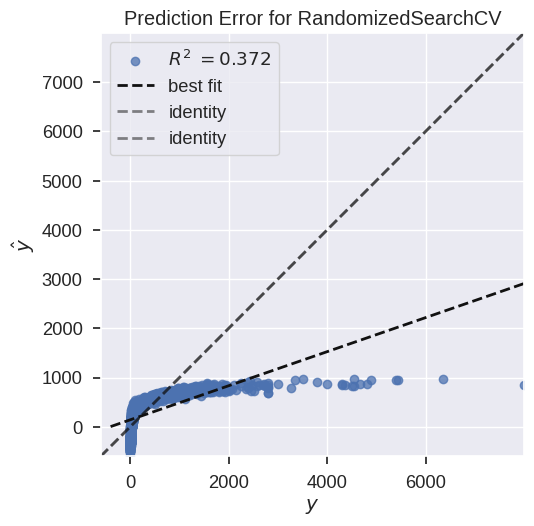

In [ ]:
param_grid = {
                'loss': ['squared_error','huber','epsilon_insensitive','squared_epsilon_insensitive'],
                'penalty': ['l2', 'l1', 'elasticnet'],
                'l1_ratio': [0.15,0.45,0.68,0.81,0.97],
                'alpha': [0.0001,0.001,0.01,0.1,1],
                'shuffle': [True,False],
                'learning_rate': ['adaptive','constant','optimal','invscaling'],
                'epsilon': np.linspace(0.001,100,10),
                'average': [True,False]
             }

grid_sgd = RandomizedSearchCV(SGDRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_sgd)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..........................alpha=2.2223, epsilon=4.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=4.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=4.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=4.0; total time=   0.0s
[CV] END ..........................alpha=2.2223, epsilon=4.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=6.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=6.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=6.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=6.0; total time=   0.0s
[CV] END ..........................alpha=0.0001, epsilon=6.0; total time=   0.0s
[CV] END ..........................alpha=8.8889, epsilon=3.0; total time=   0.0s
[CV] END ....

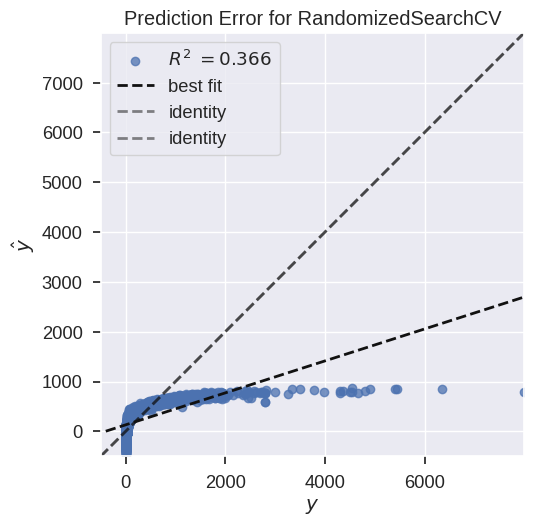

In [ ]:
param_grid = {'epsilon': np.linspace(1,10,10),
'alpha': np.linspace(0.0001,10,10)}

grid_huber = RandomizedSearchCV(HuberRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_huber)

In [ ]:
param_grid = {'link': ['auto', 'identity', 'log'],
'solver': ['lbfgs', 'newton-cholesky'],
'alpha': np.linspace(0.0001,10,10)}

grid_tweedie = RandomizedSearchCV(TweedieRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_tweedie)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=7.777799999999999, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=7.777799999999999, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=7.777799999999999, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=7.777799999999999, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=7.777799999999999, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END ..........alpha=2.2223, link=identity, solver=lbfgs; total time=   0.0s
[CV] END ..........alpha=2.2223, link=identity, solver=lbfgs; total time=   0.0s
[CV] END ..........alpha=2.2223, link=identity, solver=lbfgs; total time=   0.0s
[CV] END ..........alpha=2.2223, link=identity, solver=lbfgs; total time=   0.0s
[CV] END ..........alpha=2.2223, link=identity, solver=lbfgs; total time=   0.0s
[CV] END ....alpha=8.8889, link=auto, solver=newton-cholesky; to

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.0001, average=False, epsilon=0.001, loss=epsilon_insensitive, shuffle=False; total time=   0.3s
[CV] END C=0.0001, average=False, epsilon=0.001, loss=epsilon_insensitive, shuffle=False; total time=   0.3s
[CV] END C=0.0001, average=False, epsilon=0.001, loss=epsilon_insensitive, shuffle=False; total time=   0.3s
[CV] END C=0.0001, average=False, epsilon=0.001, loss=epsilon_insensitive, shuffle=False; total time=   0.3s
[CV] END C=0.0001, average=False, epsilon=0.001, loss=epsilon_insensitive, shuffle=False; total time=   0.3s
[CV] END C=0.01, average=True, epsilon=0.001, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.01, average=True, epsilon=0.001, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.01, average=True, epsilon=0.001, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.01, 

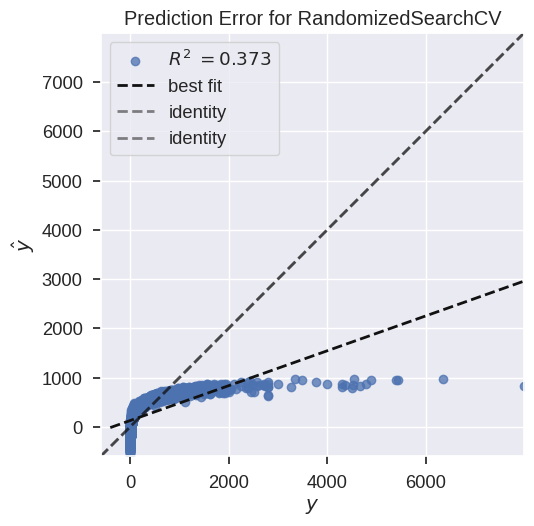

In [ ]:
param_grid = {'C': [0.0001,0.001,0.01,0.1,1,10],
            'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
            'epsilon': np.linspace(0.001,1,5),
            'shuffle': [True,False],
            'average': [True,False]}

grid_pa = RandomizedSearchCV(PassiveAggressiveRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_pa)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=False, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=Fal

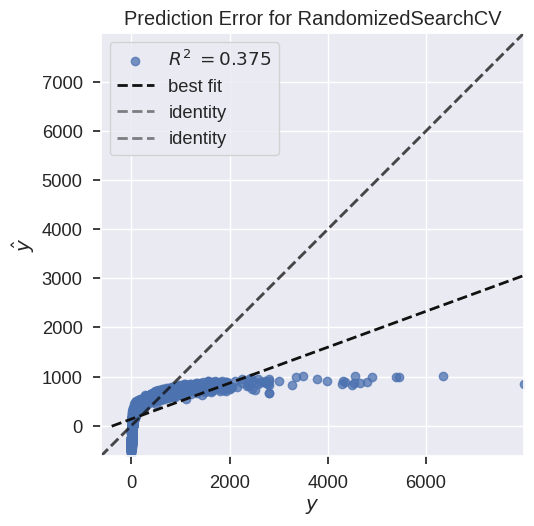

In [ ]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'selection': ['cyclic','random'],
            'fit_intercept': [True,False]
}

grid_lasso = RandomizedSearchCV(Lasso(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lasso)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=sag; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=sag; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=sag; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=sag; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=False, solver=sag; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=True, solver=svd; total time=   0.0s
[CV] END alpha=0.1,

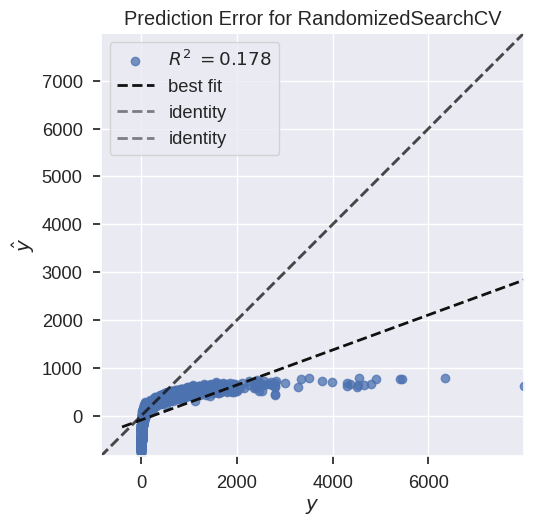

In [ ]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'fit_intercept': [True,False],
            'solver': ['svd','cholesky','lsqr','sparse_cg','sag','saga','lbfgs']
}

grid_ridge = RandomizedSearchCV(Ridge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ridge)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.1, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.1, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.1, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.1, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, l1_ratio=0.1, positive=False, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.8, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.8, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.8, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1

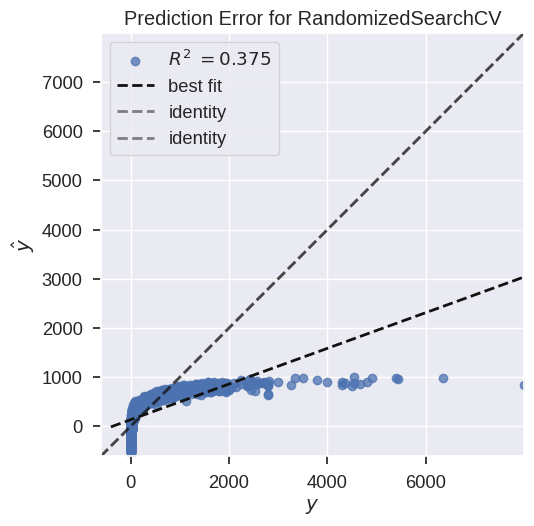

In [ ]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'selection': ['cyclic','random'],
    'l1_ratio': [0.1,0.3,0.5,0.8,1],
    'positive': [True,False],
    'fit_intercept': [True,False]
}

grid_elasticnet = RandomizedSearchCV(ElasticNet(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_elasticnet)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-08; total time=   0.1s
[CV] END alpha_1=1e-07, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-08;

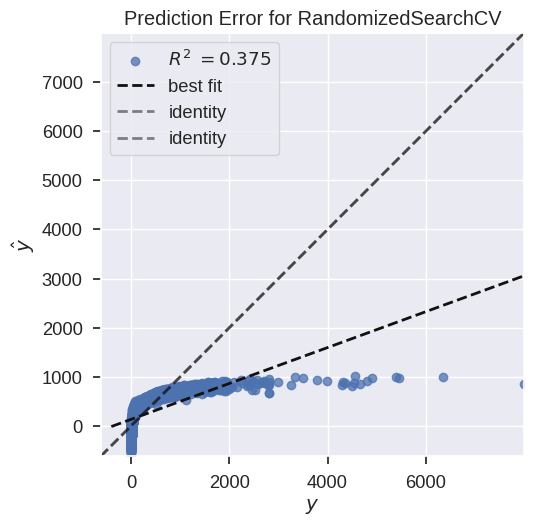

In [ ]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]}

grid_ard = RandomizedSearchCV(ARDRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ard)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=False, positive=True; total time=   0.0s
[CV] END .....

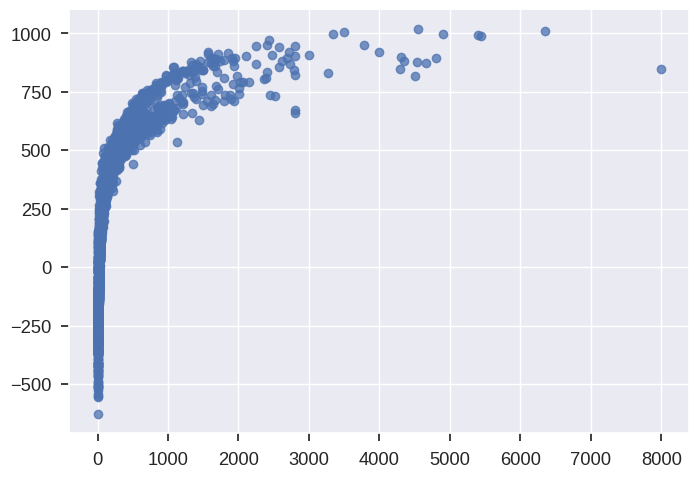

In [ ]:
param_grid = {'fit_intercept': [True,False],
'positive': [True,False]}

grid_lr = RandomizedSearchCV(LinearRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lr)

In [ ]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_poisson = RandomizedSearchCV(estimator=PoissonRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_poisson)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=newton-cholesky, warm_start=False; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END loss=absolute_error, min_samples=0.25, stop_probability=1.0; total time=   0.2s
[CV] END loss=absolute_error, min_samples=0.25, stop_probability=1.0; total time=   0.2s
[CV] END loss=absolute_error, min_samples=0.25, stop_probability=1.0; total time=   0.2s
[CV] END loss=absolute_error, min_samples=0.25, stop_probability=1.0; total time=   0.2s
[CV] END loss=absolute_error, min_samples=0.25, stop_probability=1.0; total time=   0.2s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=1.0; total time=   0.1s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=1.0; total time=   0.1s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=1.0; total time=   0.1s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=1.0; total time=   0.1s
[CV] END loss=absolute_error, min_samples=1.0, stop_probability=1.0; total time=   0.1s
[CV] END loss=squar

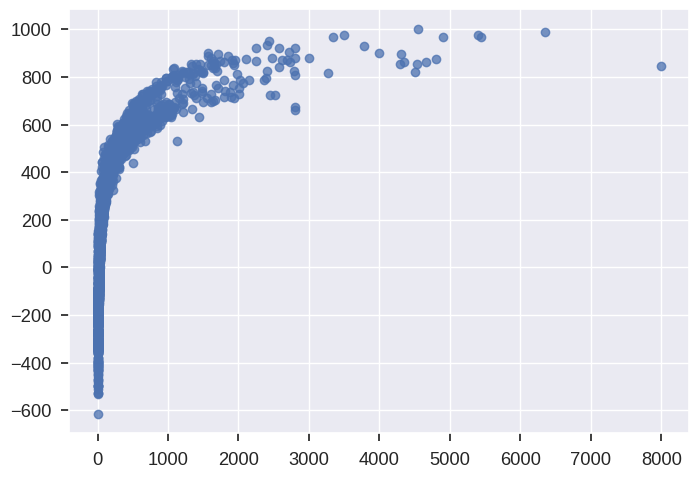

In [ ]:
param_grid = {
    'stop_probability': np.linspace(0,1,5),
    'loss': ['absolute_error','squared_error'],
    'min_samples': np.linspace(0,1,5)[1:]
}

grid_ransac = RandomizedSearchCV(estimator=RANSACRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ransac)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=True; total time=  12.6s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=True; total time=  11.6s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=True; total time=  11.6s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=True; total time=  11.6s
[CV] END bootstrap=True, criterion=friedman_mse, max_features=sqrt, max_samples=0.75, n_estimators=1000, oob_score=False, warm_start=True; total time=  11.6s
[CV] END bootstrap=True, criterion=absolute_error, max_features=auto, max_samples=0.25, n_estimators=500, oob_scor

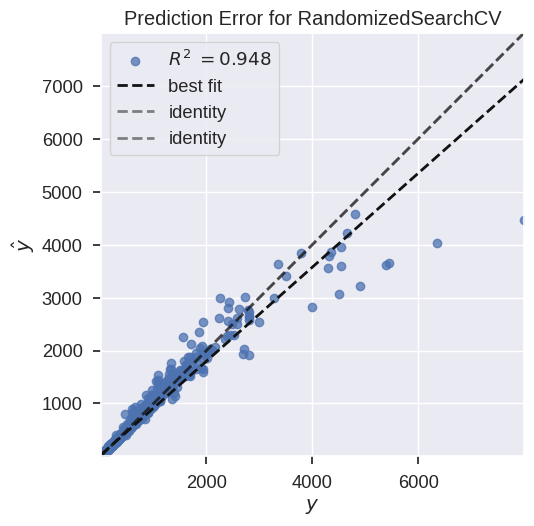

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'warm_start': [True,False],
    'max_samples': [0.25,0.5,0.75,1.0]
}

grid_rf = RandomizedSearchCV(estimator=RandomForestRegressor(),param_distributions=param_grid,verbose=2,return_train_score=True,scoring='r2')
train_and_evaluate_model(grid_rf)

In [ ]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_gamma = RandomizedSearchCV(estimator=GammaRegressor(),param_distributions=param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_gamma)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, solver=lbfgs, warm_start=False

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=1, degree=3, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   1.4s
[CV] END C=1, degree=3, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   2.1s
[CV] END C=1, degree=3, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   1.8s
[CV] END C=1, degree=3, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   1.3s
[CV] END C=1, degree=3, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   1.3s
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   2.0s
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   2.0s
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   2.0s
[CV] END C=0.1, degree=2, epsilon=0.1, gamma=auto, kernel=rbf, shrinking=False; total time=   3.0s
[CV] END

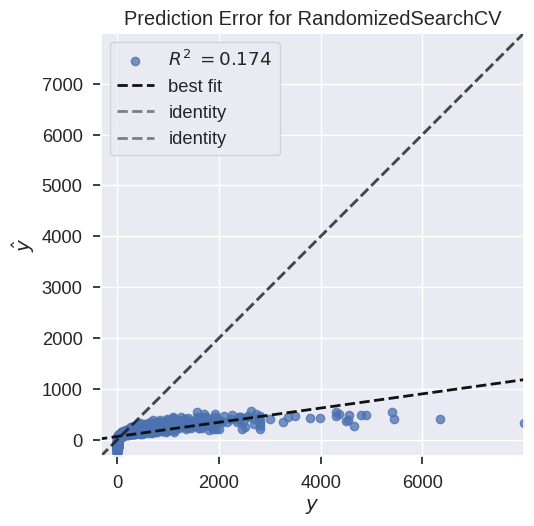

In [ ]:
param_grid = {
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'C': [0.01,0.1,1,10],
    'gamma': ['scale','auto'],
    'shrinking': [True,False],
    'epsilon': [0.001,0.01,0.1,1]
}

grid_svr = RandomizedSearchCV(estimator=SVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_svr)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=1, degree=2, kernel=linear, nu=0.1, shrinking=True; total time=   0.6s
[CV] END C=1, degree=2, kernel=linear, nu=0.1, shrinking=True; total time=   0.6s
[CV] END C=1, degree=2, kernel=linear, nu=0.1, shrinking=True; total time=   0.5s
[CV] END C=1, degree=2, kernel=linear, nu=0.1, shrinking=True; total time=   0.3s
[CV] END C=1, degree=2, kernel=linear, nu=0.1, shrinking=True; total time=   0.3s
[CV] END C=10, degree=3, kernel=sigmoid, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=3, kernel=sigmoid, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=3, kernel=sigmoid, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=3, kernel=sigmoid, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=3, kernel=sigmoid, nu=0.001, shrinking=True; total time=   0.0s
[CV] END C=10, degree=4, kernel=poly, nu=0.01, shrinking=True; t

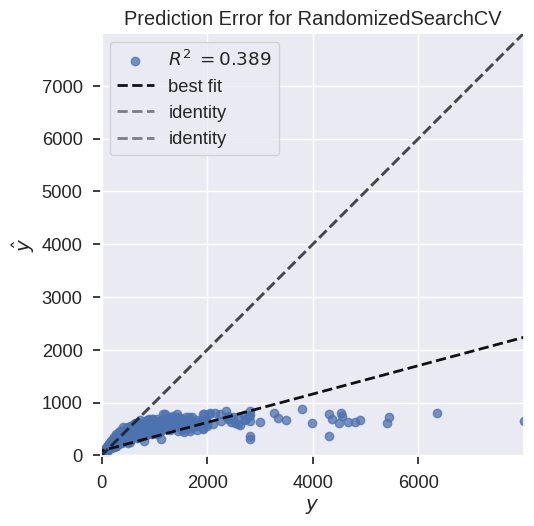

In [ ]:
param_grid = {
    'nu': [0.001,0.01,0.1,0.5,1],
    'C': [0.1,1,10],
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'shrinking': [True,False]
}

grid_nusvr = RandomizedSearchCV(estimator=NuSVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_nusvr)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END copy_X=False, fit_intercept=False, max_subpopulation=1000, n_subsamples=300; total time=   0.2s
[CV] END copy_X=False, fit_intercept=False, max_subpopulation=1000, n_subsamples=300; total time=   0.2s
[CV] END copy_X=False, fit_intercept=False, max_subpopulation=1000, n_subsamples=300; total time=   0.2s
[CV] END copy_X=False, fit_intercept=False, max_subpopulation=1000, n_subsamples=300; total time=   0.2s
[CV] END copy_X=False, fit_intercept=False, max_subpopulation=1000, n_subsamples=300; total time=   0.2s
[CV] END copy_X=False, fit_intercept=True, max_subpopulation=100000, n_subsamples=753; total time=  31.8s
[CV] END copy_X=False, fit_intercept=True, max_subpopulation=100000, n_subsamples=753; total time=  31.0s
[CV] END copy_X=False, fit_intercept=True, max_subpopulation=100000, n_subsamples=753; total time=  31.4s
[CV] END copy_X=False, fit_intercept=True, max_subpopulation=

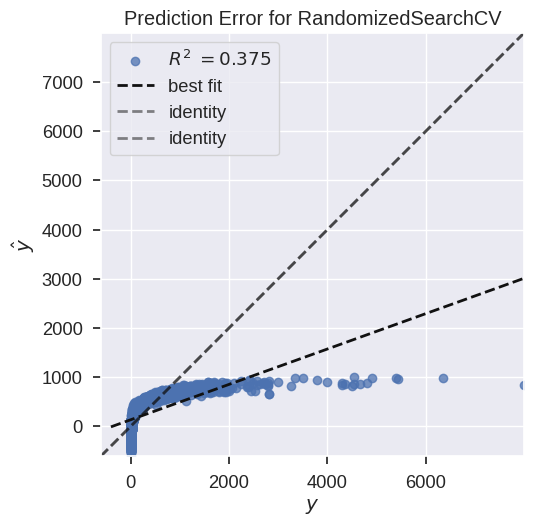

In [ ]:
param_grid = {
    'fit_intercept': [True,False],
    'copy_X': [True,False],
    'max_subpopulation': [1,10,100,1000,10000,100000],
    'n_subsamples': [300,500,753,None]
}

grid_tsr = RandomizedSearchCV(estimator=TheilSenRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_tsr)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-07, lambda_2=1e-06; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; total time=   0.0s
[CV] END alpha_1=1e-07, alpha_2=1e-07, compute_score=False, fit_intercept=False, lambda_1=1e-05, lambda_2=1e-08; tota

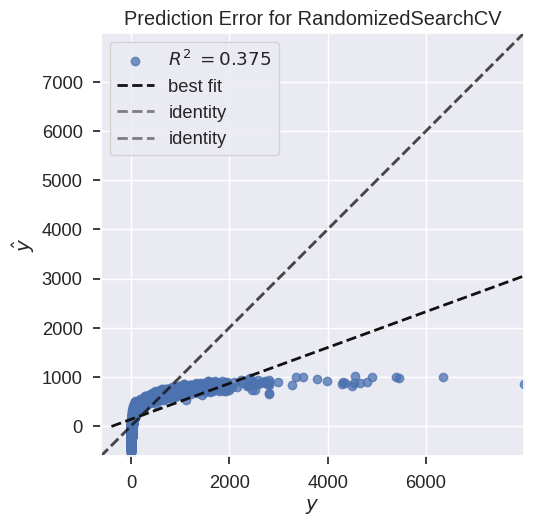

In [ ]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]
             }

grid_bayesian_ridge = RandomizedSearchCV(BayesianRidge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_bayesian_ridge)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END .learning_rate=0.001, loss=square, n_estimators=500; total time=   5.1s
[CV] END .learning_rate=0.001, loss=square, n_estimators=500; total time=   5.7s
[CV] END .learning_rate=0.001, loss=square, n_estimators=500; total time=   5.0s
[CV] END .learning_rate=0.001, loss=square, n_estimators=500; total time=   5.6s
[CV] END .learning_rate=0.001, loss=square, n_estimators=500; total time=   5.2s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=   2.8s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=   3.2s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=   3.6s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=   2.9s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=500; total time=   2.8s
[CV] END learning_rate=0.001, loss=square, n_estimators=1000; total time=  10.8s
[CV] END lear

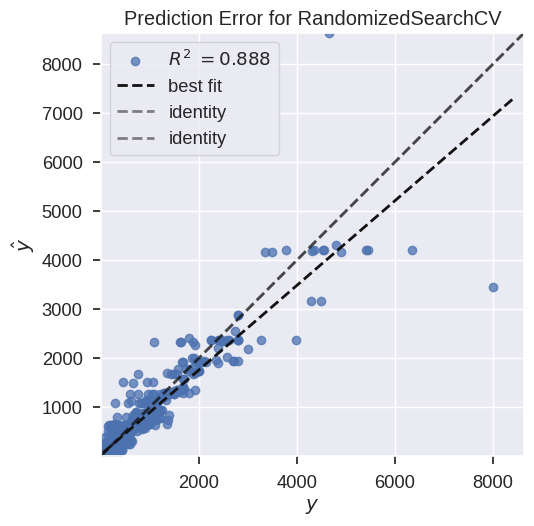

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'loss': ['linear','square','exponential']
}

grid_ab = RandomizedSearchCV(estimator=AdaBoostRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ab)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, criterion=squared_error, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.5s
[CV] END bootstrap=True, criterion=squared_error, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.5s
[CV] END bootstrap=True, criterion=squared_error, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.1s
[CV] END bootstrap=True, criterion=squared_error, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.1s
[CV] END bootstrap=True, criterion=squared_error, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False; total time=   1.1s
[CV] END bootstrap=False, criterion=absolute_error, max_features=sqrt, max_samples=0.5, n_estimators=1000, oob_score=False; total time=   0.0s
[CV] END bootstrap=False, criterion=absolute_error, max_

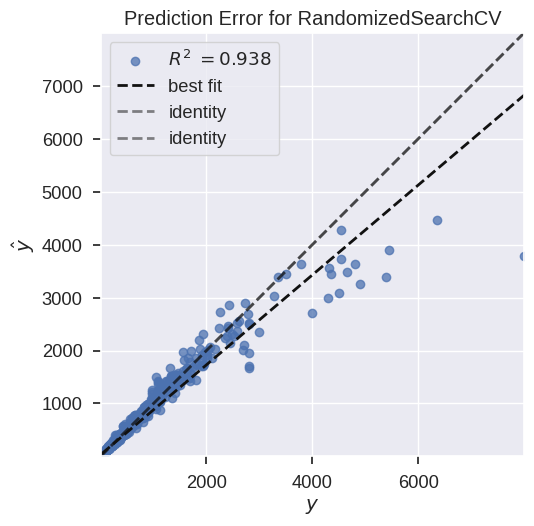

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'max_samples': [0.5,0.75,0.9,1]
}

grid_et = RandomizedSearchCV(estimator=ExtraTreesRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_et)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END booster=gblinear, importance_type=total_gain, learning_rate=0.001, n_estimators=800; total time=   0.0s
[CV] END booster=gblinear, importance_type=total_gain, learning_rate=0.001, n_estimators=800; total time=   0.0s
[CV] END booster=gblinear, importance_type=total_gain, learning_rate=0.001, n_estimators=800; total time=   0.0s
[CV] END booster=gblinear, importance_type=total_gain, learning_rate=0.001, n_estimators=800; total time=   0.0s
[CV] END booster=gblinear, importance_type=total_gain, learning_rate=0.001, n_estimators=800; total time=   0.0s
[CV] END booster=gbtree, importance_type=total_cover, learning_rate=0.001, n_estimators=1000; total time=   1.3s
[CV] END booster=gbtree, importance_type=total_cover, learning_rate=0.001, n_estimators=1000; total time=   1.4s
[CV] END booster=gbtree, importance_type=total_cover, learning_rate=0.001, n_estimators=1000; total time=   1.3s


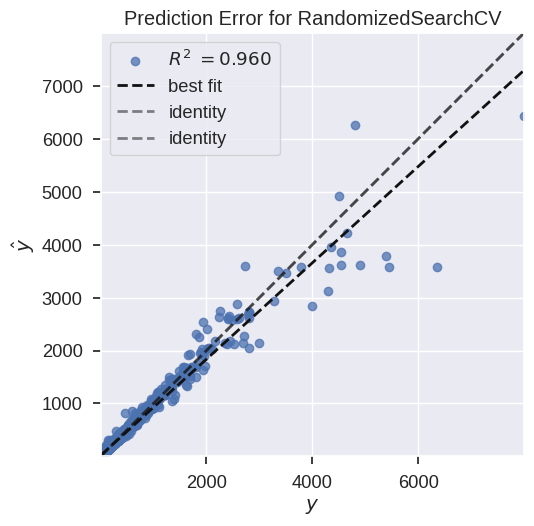

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'booster': ['gbtree','dart','gblinear'],
    'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgbrf = RandomizedSearchCV(estimator=XGBRFRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_xgbrf)

Training model: RandomizedSearchCV
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.5, max_samples=1, n_estimators=1000, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.5, max_samples=1, n_estimators=1000, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.5, max_samples=1, n_estimators=1000, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.5, max_samples=1, n_estimators=1000, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=True, bootstrap_features=True, max_features=0.5, max_samples=1, n_estimators=1000, oob_score=True, warm_start=True; total time=   0.0s
[CV] END bootstrap=False, bootstrap_features=False, max_features=0.5, max_samples=1, n_estimators=1000, oob_score=False, warm_start=Tr

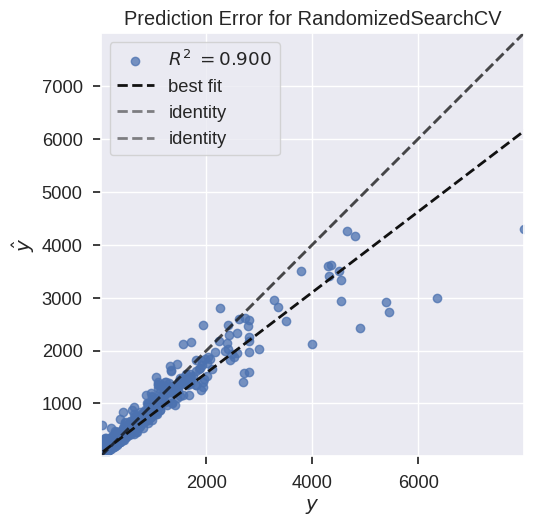

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'max_samples': [0.25,0.5,0.75,1],
    'max_features': [0.5,0.65,0.85,1],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'bootstrap_features': [True,False],
    'warm_start': [True,False]
}

grid_bag = RandomizedSearchCV(estimator=BaggingRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_bag)

## Optimized Models Performance Comparison

In [ ]:
model_perfs = pd.DataFrame({'Model': models,
                            'R2': r2_scores,
                            'RMSE': rmse_scores,
                            'MAPE': mape_scores,
                            'MSE': mse_scores,
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs[:20]

,Model,R2,RMSE,MAPE,MSE,Training Time
0,"(ExtraTreeRegressor(random_state=349988260), E...",0.976851,78.876279,0.018062,6221.467397,2.129777
1,"XGBRegressor(base_score=None, booster=None, ca...",0.971763,87.114182,0.079927,7588.880716,0.136654
2,(DecisionTreeRegressor(random_state=1132327192...,0.965559,96.210030,0.024169,9256.369864,0.413202
3,"RandomizedSearchCV(cv=5,\n e...",0.959781,103.967884,0.319652,10809.320968,19.689752
4,<catboost.core.CatBoostRegressor object at 0x7...,0.959510,104.316551,0.116471,10881.942776,2.479546
5,"XGBRFRegressor(base_score=None, booster=None, ...",0.959158,104.769653,0.311675,10976.680154,0.177009
6,"(DecisionTreeRegressor(max_features=1.0, rando...",0.958161,106.040452,0.021988,11244.577373,3.979338
7,"RandomizedSearchCV(cv=5, estimator=TweedieRegr...",0.957020,107.477144,0.564092,11551.336513,0.612806
8,"RandomizedSearchCV(cv=5,\n e...",0.956795,107.757713,0.113739,11611.724764,63.437432
9,NGBRegressor(random_state=RandomState(MT19937)...,0.954151,111.006258,0.212093,12322.389284,17.239147


Even after tuning the hyperparameters of all the models, the Extra Trees Regressor model stays intact as the best performing model with an outstanding R2 score of more than 97.6%.

## Saving the best performing model for deployment into production

In [ ]:
best_model = model_perfs['Model'].iloc[0]
best_model

ExtraTreesRegressor()

In [ ]:
pipeline = Pipeline(steps=[
        ('transformer',transformer),
        ('scaler',scaler),
        ('model',best_model)
])
pipeline

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_transform',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Quantity',
                                                   'Discounted Profit']),
                                                 ('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['Discount']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['Discount Percentage',
                                                   'Operating Expenses'])])),
                ('scaler', StandardScaler()),
                ('model', ExtraTreesRegressor())])

In [ ]:
joblib.dump(pipeline,'pipeline.pkl')

['pipeline.pkl']

In [ ]:
joblib.load('pipeline.pkl')

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('log_transform',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Quantity',
                                                   'Discounted Profit']),
                                                 ('sqrt_transform',
                                                  FunctionTransformer(func=<ufunc 'sqrt'>),
                                                  ['Discount']),
                                                 ('power_transform',
                                                  PowerTransformer(),
                                                  ['Discount Percentage',
                                                   'Operating Expenses'])])),
                ('scaler', StandardScaler()),
                ('model', ExtraTreesRegressor())])

In [ ]:
for col in final_X_train.columns:
    print(f"Min value of {col}:",df[col].min())
    print(f"Max value of {col}:",df[col].max())

Min value of Discounted Profit: -1979.9934000000003
Max value of Discounted Profit: 5039.9856
Min value of Discount Percentage: 0.0
Max value of Discount Percentage: 180.1801801801802
Min value of Postal Code: 1040.0
Max value of Postal Code: 99301.0
Min value of Discount: 0.0
Max value of Discount: 0.8
Min value of Order Day: 1.0
Max value of Order Day: 31.0
Min value of Order Month: 1.0
Max value of Order Month: 12.0
Min value of Quantity: 1.0
Max value of Quantity: 14.0
Min value of Operating Expenses: 0.5543999999999999
Max value of Operating Expenses: 11839.970399999998
Min value of Ship Day: 1.0
Max value of Ship Day: 31.0
Min value of Order Weekday: 0.0
Max value of Order Weekday: 6.0


In [ ]:
list(final_X_train.columns)

['Discounted Profit',
 'Discount Percentage',
 'Postal Code',
 'Discount',
 'Order Day',
 'Order Month',
 'Quantity',
 'Operating Expenses',
 'Ship Day',
 'Order Weekday']

### Making a test prediction

In [ ]:
pipeline.predict(pd.DataFrame([[3846.91,79.42479138,5937,0.5,8.0,5.0,9.0,6293.46,29.0,3.0]],columns=list(final_X_train.columns)))

array([6598.16654])

In [ ]:
gc.collect()

3694

# Conclusion

## Project Summary
- Successfully developed a robust machine learning pipeline to forecast superstore sales using a dataset of 9,994 transactions.
- Applied data preprocessing, exploratory data analysis (EDA), and feature engineering to enhance model performance.
- Deployed the final model via a Flask-based web application, enabling real-time sales predictions through an intuitive interface.

## Key Achievements
- Identified the ExtraTreesRegressor as the top-performing model, achieving an R2 score of 97.6% post-hyperparameter tuning.
- Integrated critical features (e.g., Profit, Discount, Quantity) into the pipeline, saved as `pipeline.pkl`, with transformations and scaling.
- Provided actionable insights for optimizing inventory management, pricing strategies, and revenue forecasting.

## Future Directions
- Integrate MLflow for experiment tracking and model versioning to streamline future iterations.
- Explore additional ensemble techniques to potentially improve predictive accuracy.
- Enhance the web interface with advanced visualizations and interactive elements for improved user experience.
- Expand the application to broader retail analytics use cases for increased scalability and impact.

This project establishes a strong foundation for sales prediction, with significant potential for refinement and practical deployment in the retail sector.
